In [1]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, Lars, BayesianRidge, SGDRegressor,LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.metrics import mean_squared_error,mean_squared_log_error
from sklearn.model_selection import cross_val_score,KFold
import tensorflow as tf
import keras
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from xgboost import XGBRegressor

C:\Users\hp\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\hp\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\hp\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\hp\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:529: FutureWarning: Passing (type, 1)

In [2]:
sns.set(rc={'figure.figsize':(10,8)})

# Competition Description


Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

Practice Skills
Creative feature engineering 
Advanced regression techniques like random forest and gradient boosting

Acknowledgments
The Ames Housing dataset was compiled by Dean De Cock for use in data science education. It's an incredible alternative for data scientists looking for a modernized and expanded version of the often cited Boston Housing dataset. 

Goal

It is your job to predict the sales price for each house. For each Id in the test set, you must predict the value of the SalePrice variable. 

Metric

Submissions are evaluated on Root-Mean-Squared-Error (RMSE) between the logarithm of the predicted value and the logarithm of the observed sales price. (Taking logs means that errors in predicting expensive houses and cheap houses will affect the result equally.)

File descriptions

train.csv - the training set

test.csv - the test set

Source

https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data

# Exploratory Data Analysis

    Exploratory Data Analysis refers to the critical process of performing initial investigations on data so as to discover patterns,to spot anomalies,to test hypothesis and to check assumptions with the help of summary statistics and graphical representations.

## - Preprocessing Data

        these are either removed, corrected, or imputed

        1. Irrelevant data
        2. Duplicates
        3. Type conversion (Make sure numbers are stored as numerical data types. A date should be stored as a date object)
        4. Syntax errors
        5. Missing values
        7. Outliers
        8. Uniformity
        9. Visualisation
        10. Feature Engineering
        11. Standardization

## - Feature Selection
    
    - Correlatoin Matrix
    - Forward Feature Selection

## - Split dataset 

## - Check Regression Assumptions
    
    1. Linearity
    3. Normality and Homoscedasticity
    4. No Autocorrelation
    5. No Multicolinearity

## - Create Regression Model

# Load data

In [3]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [4]:
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


## Explore Dataset 

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
# Finding Null Values
df_train.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

# Analysis Feature one by one

## 1) MSSubClass

    MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES
 
    Frequencies of its values
    
        1-STORY 1946 & NEWER ALL STYLES  536
        2-STORY 1946 & NEWER             299
        1-1/2 STORY FINISHED ALL AGES    144
        1-STORY PUD (Planned Unit Development) - 1946 & NEWER     87
        1-STORY 1945 & OLDER              69
        2-STORY PUD - 1946 & NEWER        63
        2-STORY 1945 & OLDER              60
        SPLIT OR MULTI-LEVEL              58
        DUPLEX - ALL STYLES AND AGES      52
        2 FAMILY CONVERSION - ALL STYLES AND AGES   30
        SPLIT FOYER                       20
        2-1/2 STORY ALL AGES              16
        1-1/2 STORY - UNFINISHED ALL AGES           12
        PUD - MULTILEVEL - INCL SPLIT LEV/FOYER     10
        1-STORY W/FINISHED ATTIC ALL AGES            4
    
    data type - nominal categorical values
    
    Outlier -> 160,180,190

In [8]:
df_train.MSSubClass.describe(include = all)

count    1460.000000
mean       56.897260
std        42.300571
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max       190.000000
Name: MSSubClass, dtype: float64

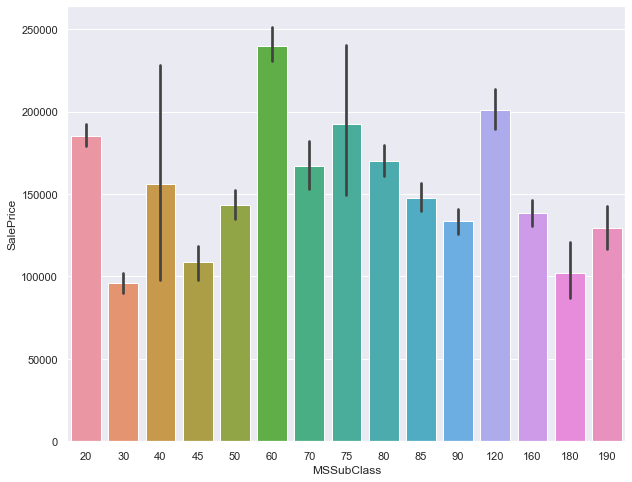

In [9]:
sns.barplot(df_train.MSSubClass,df_train.SalePrice)

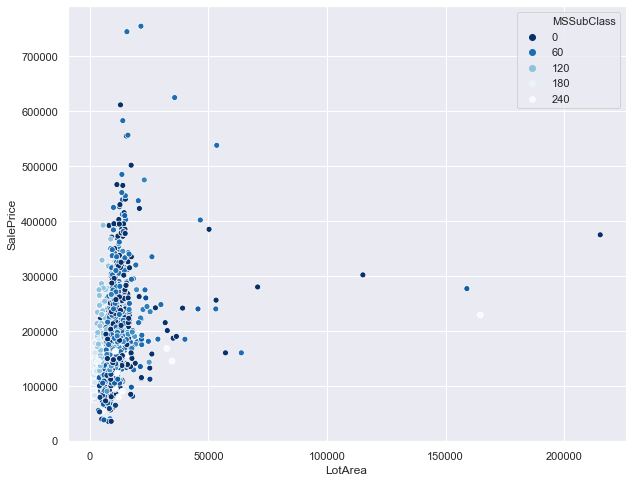

In [10]:
sns.scatterplot(df_train['LotArea'],df_train['SalePrice'], hue = df_train['MSSubClass'],palette = 'Blues_r')

- 20, 60, 75 and 120 have big portion of distribution
- for 60 people are willing to pay high amount 

## 2) MSZoning

MSZoning: Identifies the general zoning classification of the sale.

   A    Agriculture
   
   C    Commercial
   
   FV    Floating Village Residential
   
   I    Industrial
   
   RH    Residential High Density
   
   RL    Residential Low Density
   
   RP    Residential Low Density Park
   
   RM    Residential Medium Density
   
do label encoding of MSZoning
       
       RL = 0
       RM = 1
       FV = 2
       RH = 3
       c  = 4
       RP = 5
       I  = 6
       A  = 7 




In [11]:
df_train.MSZoning.value_counts()

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

In [12]:
ms_zone = {'RL':0,'RM':1,'FV':2,'RH':3,'C (all)':4,'RP':5,'I':6,'A':7}
df_train['MSZoning']=df_train['MSZoning'].map(ms_zone)

In [13]:
df_train.MSZoning.value_counts()

0    1151
1     218
2      65
3      16
4      10
Name: MSZoning, dtype: int64

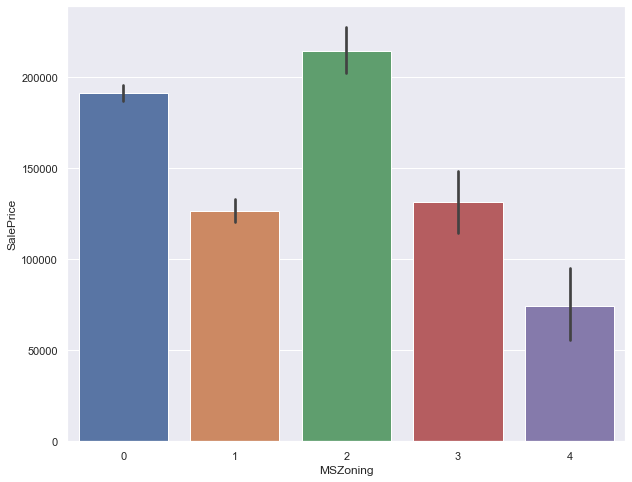

In [14]:
sns.barplot(df_train.MSZoning,df_train.SalePrice)

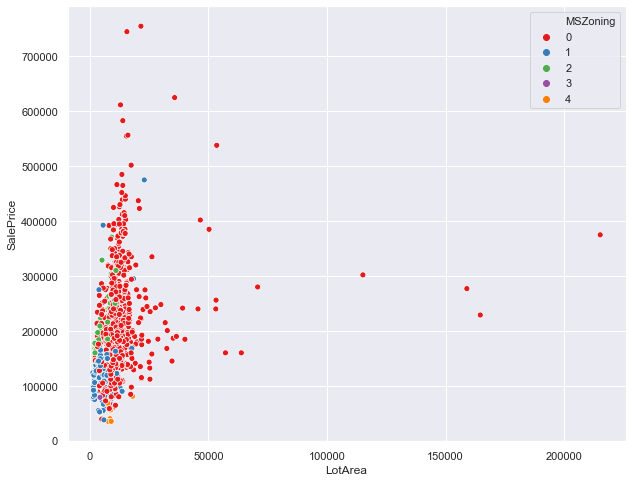

In [15]:
sns.scatterplot(df_train['LotArea'],df_train['SalePrice'], hue = df_train['MSZoning'],palette = 'Set1')

- RL has the high frequency
- c high selling range is 80,000 to 1,00,000
- RM high selling point is 1,00,000 to 1,40,000 and 4,90,000
- RH high selling point is 1,50,000 to 1,70,000
- for RL people can pay high price it high selling point from 3,90,000 to 8,00,000 
- For FV selling point is starting from 1,50,000 to 4,10,000

## 3) LotFrontAge

LotFrontage: Linear feet of street connected to property


## Take Care of Missing Values

Impute with Mean/median: Computing the overall mean, median or mode is a very basic imputation method

In [16]:
df_train.LotFrontage.fillna(69,inplace =True)

In [17]:
df_train.LotFrontage.describe(include=all)

count    1460.000000
mean       69.863699
std        22.027677
min        21.000000
25%        60.000000
50%        69.000000
75%        79.000000
max       313.000000
Name: LotFrontage, dtype: float64

In [18]:
df_train.LotFrontage.value_counts(dropna=False)

69.0     270
60.0     143
70.0      70
80.0      69
50.0      57
        ... 
33.0       1
38.0       1
138.0      1
140.0      1
137.0      1
Name: LotFrontage, Length: 110, dtype: int64

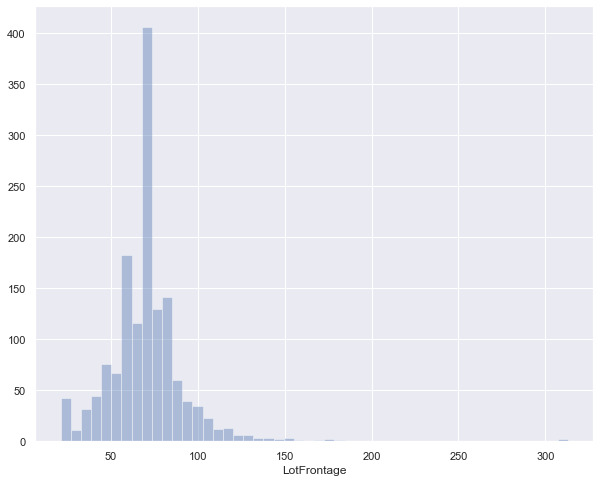

In [19]:
sns.distplot(df_train.LotFrontage,kde=False)

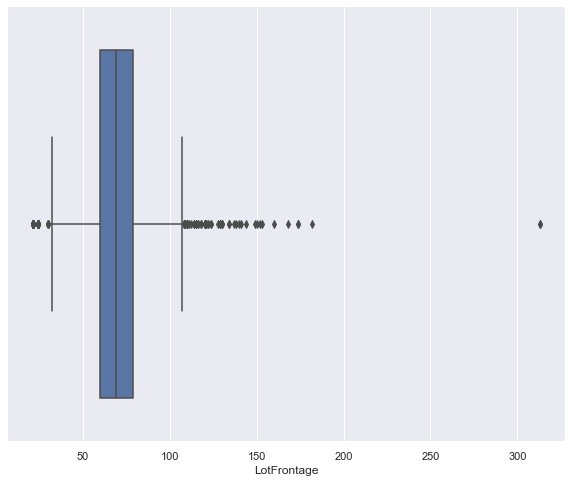

In [20]:
sns.boxplot(df_train.LotFrontage)

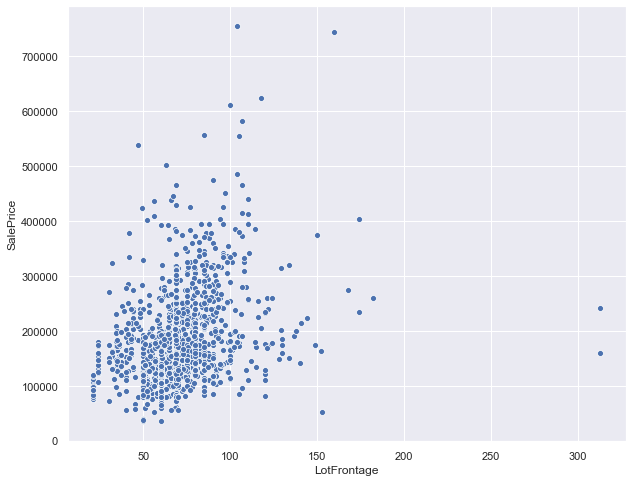

In [21]:
# check relation with Price with zone
# setss = {20:'blue',30:'red',40:'green',45:'yellow',50:'orange',60:'teal',70:'pink',75:'brown',80:'magenta',85:'tan',90:'indigo',120:'lime',160:'maroon',180:'navy',190:'black'}
sns.scatterplot(df_train.LotFrontage,df_train.SalePrice)

## 4) LotArea

LotArea: Lot size in square feet


In [22]:
df_train.LotArea.value_counts()

7200     25
9600     24
6000     17
10800    14
9000     14
         ..
7094      1
6130      1
9337      1
5232      1
8190      1
Name: LotArea, Length: 1073, dtype: int64

In [23]:
df_train.LotArea.describe()

count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64

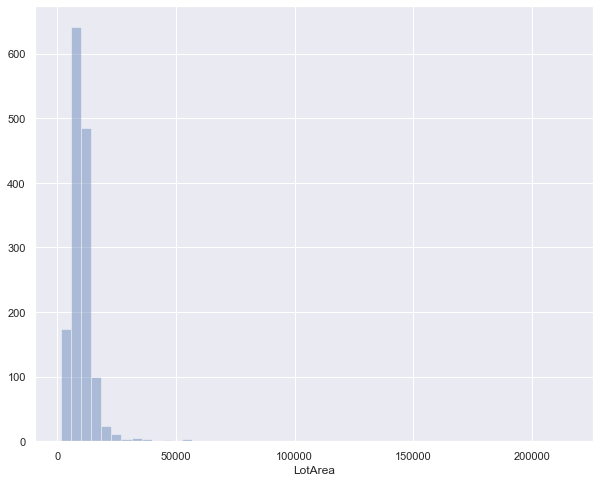

In [24]:
sns.distplot(df_train.LotArea,kde=False)

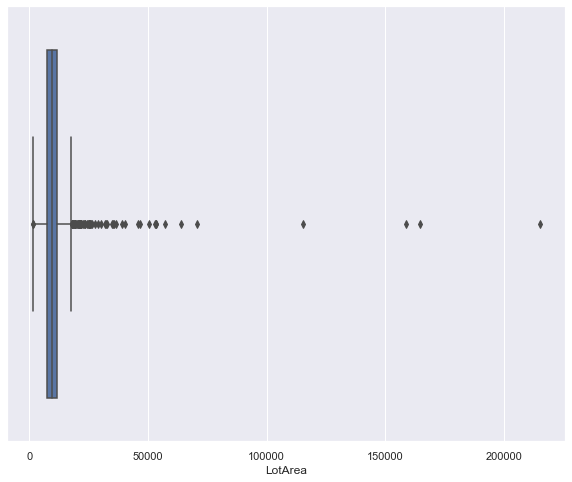

In [25]:
sns.boxplot(df_train.LotArea)

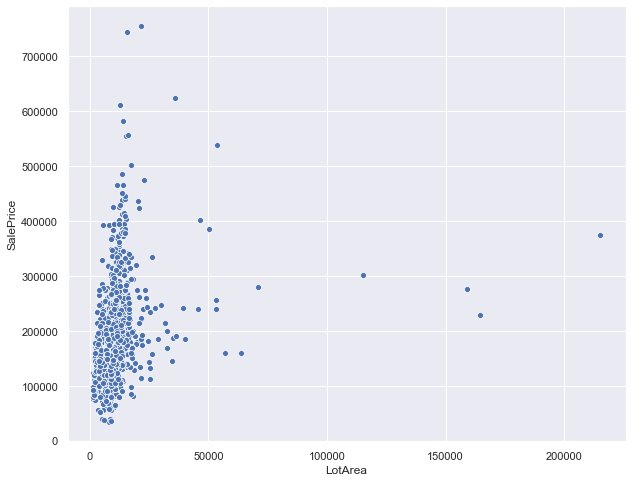

In [26]:
## scatter plot
setss = {20:'blue',30:'red',40:'green',45:'yellow',50:'orange',60:'teal',70:'pink',75:'brown',80:'magenta',85:'tan',90:'indigo',120:'lime',160:'maroon',180:'navy',190:'black'}
sns.scatterplot(df_train.LotArea, df_train.SalePrice)

- LotArea has correlation with frontage and sale price
- lot of bigger area as well as frontage are getting  in residential low density and residential medium density
- 1-STORY 1946 & NEWER ALL STYLES and 2-STORY 1946 & NEWER if these frontage around 0 to 100 and it is in RL so sale price would be high

## LogLotArea

 because LotArea is not a normal distribution and it does not have linearity so we have to use log transormation to bring linearity 

In [27]:
df_train['LogLotArea'] = np.log(df_train['LotArea'])

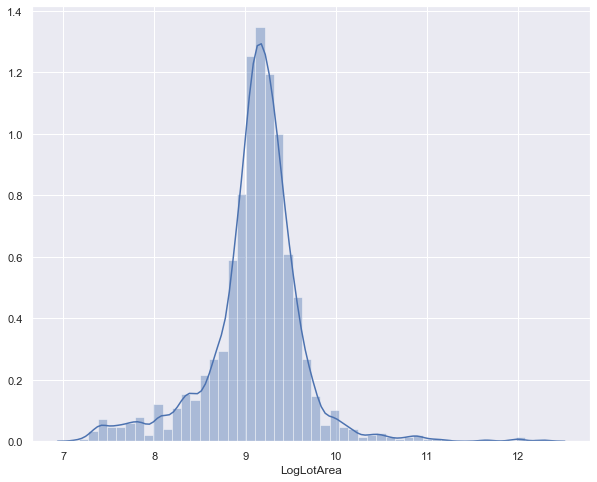

In [28]:
sns.distplot(df_train.LogLotArea,kde=True)

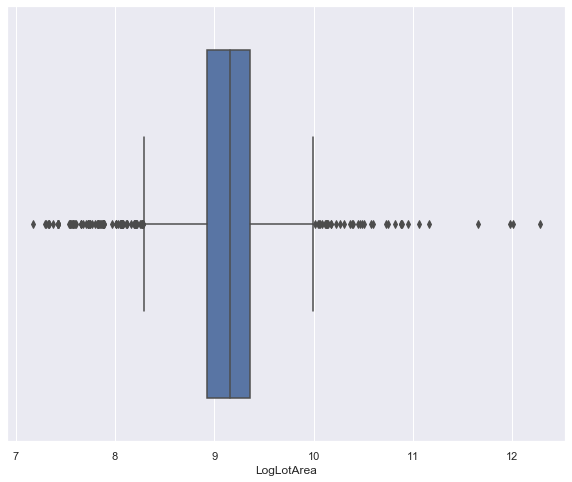

In [29]:
sns.boxplot(df_train.LogLotArea)

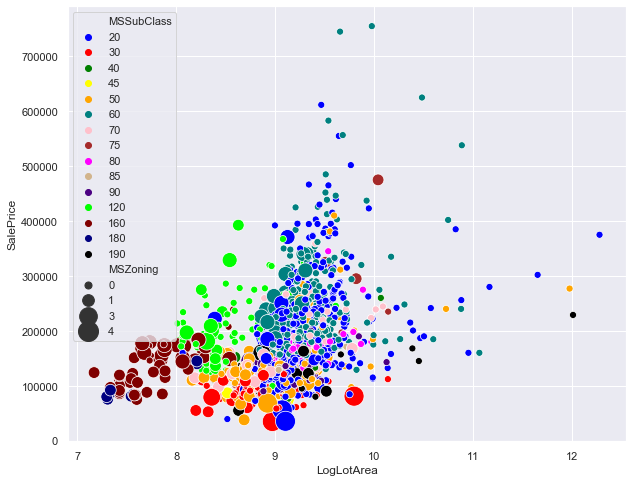

In [30]:
sns.scatterplot(df_train.LogLotArea,df_train.SalePrice, size=df_train['MSZoning'],sizes=(50,400),hue = df_train['MSSubClass'],palette=setss)

## 5) Street

Street: Type of road access to property

   Grvl    Gravel    
   Pave    Paved
   
Label encoding 

Grvl = 0

Pave = 1

In [31]:
strt = {'Grvl': 0, 'Pave': 1}
df_train['Street']=df_train['Street'].map(strt)

In [32]:
df_train['Street'].describe()

count    1460.000000
mean        0.995890
std         0.063996
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: Street, dtype: float64

In [33]:
df_train['Street'].value_counts(dropna=False)

1    1454
0       6
Name: Street, dtype: int64

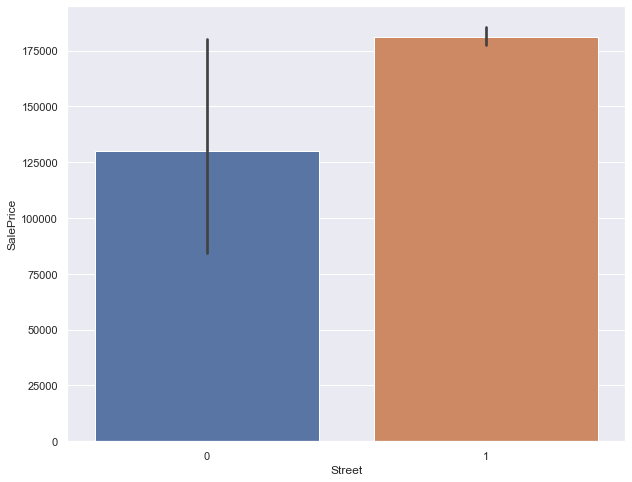

In [34]:
sns.barplot(df_train.Street,df_train.SalePrice)

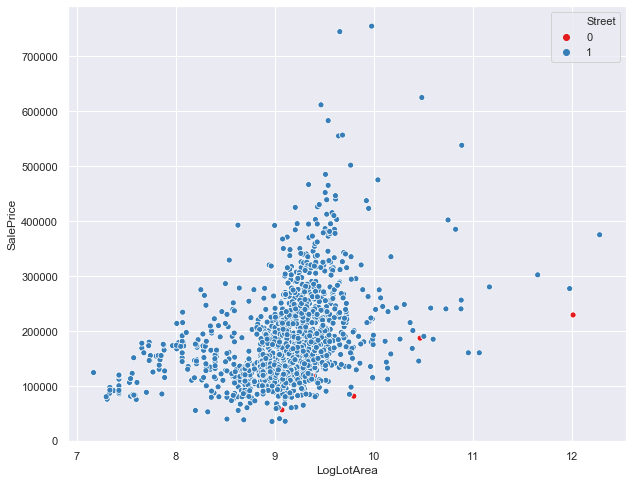

In [35]:
# check scatter with LotArea and SalePrice

sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],palette='Set1',hue=df_train['Street'])

- after 1,50,000 selling price, people are more tend to buy those houses which have pave street 
- those have pave street, that houses have high price

## 6) Alley

Alley: Type of alley access to property

   Grvl    Gravel
   
   Pave    Paved
   
   NA     No alley access
   
What is Alley?

- a narrow road or path between buildings

for label encoding 

Grvl = 0

Pave = 1

NA = 2

In [36]:
alle = {'Grvl':1,'Pave':2,'NA':0}
df_train['Alley'] = df_train['Alley'].map(alle)

In [37]:
df_train['Alley'].fillna(0,inplace=True)

In [38]:
df_train['Alley'].value_counts(dropna=False)

0.0    1369
1.0      50
2.0      41
Name: Alley, dtype: int64

In [39]:
df_train['Alley'].describe()

count    1460.000000
mean        0.090411
std         0.372151
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: Alley, dtype: float64

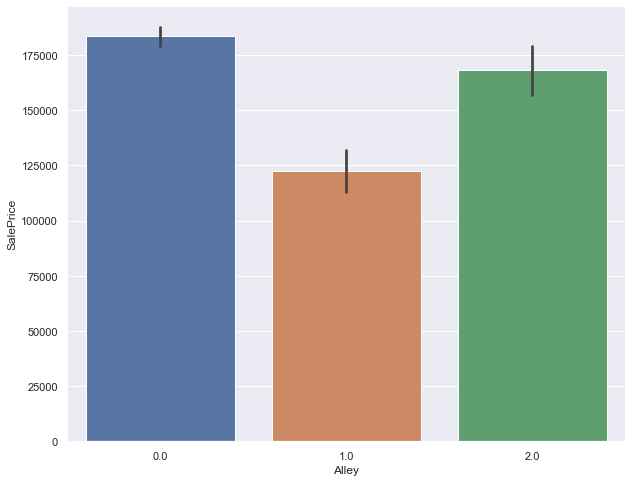

In [40]:
sns.barplot(df_train.Alley,df_train.SalePrice)

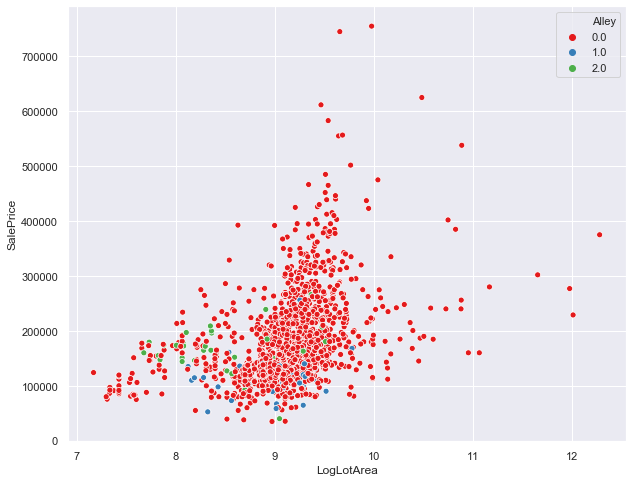

In [41]:
# check it with lot Area and sale price

sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue=df_train['Alley'],palette='Set1')

- most alley present in 20, 60 and 120 subclasses which are in RL zone
- houses those price  is high they don't have Alley
- no alley has big portion of distribution

## 7) LotShape

LotShape: General shape of property

       Reg    Regular
   
       IR1    Slightly irregular
   
       IR2    Moderately Irregular
   
       IR3    Irregular

Label Encoding

        Reg = 0
    
        IR1 = 1
     
        IR2 = 2
    
        IR3 = 3

In [42]:
shp = {'Reg':0,'IR1':1,'IR2':2,'IR3':3}
df_train['LotShape'] = df_train['LotShape'].map(shp)

In [43]:
df_train['LotShape'].value_counts(dropna=False)

0    925
1    484
2     41
3     10
Name: LotShape, dtype: int64

In [44]:
df_train['LotShape'].describe()

count    1460.000000
mean        0.408219
std         0.582296
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         3.000000
Name: LotShape, dtype: float64

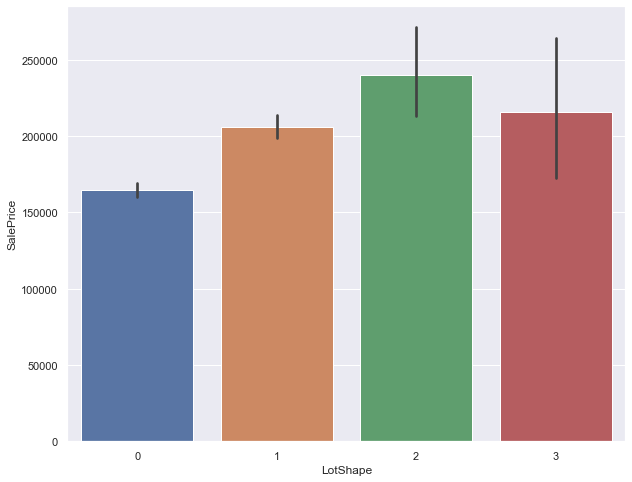

In [45]:
sns.barplot(df_train.LotShape,df_train.SalePrice)

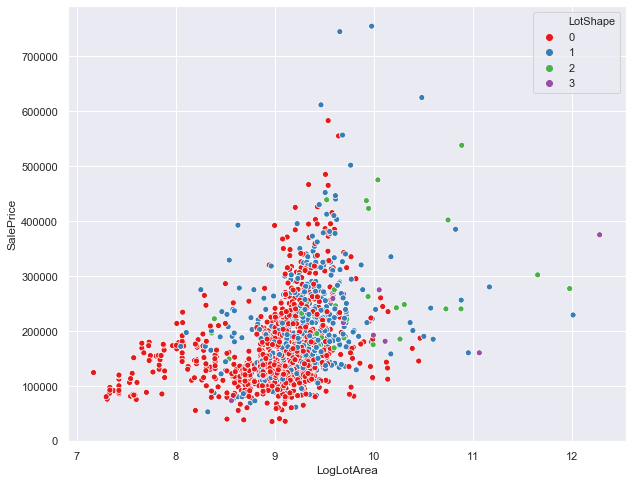

In [46]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue = df_train['LotShape'],palette='Set1')

- 20, 60 and 50 are IR1 or IR2 or IR3 shape houses in RL so these houses are bigger in size and price is high in comparison to REG type
- IR3 high selling point is around from 3,00,000 to 4,00,000
- Reg high selling point is around from 50,000 to 1,80,000
- IR2 high selling point is around from 2,00,000 to 2,80,000 and 4,00,000 to 6,00,000
- for IR1 people can pay high amount

## 8) LandContour

LandContour: Flatness of the property

       Lvl    Near Flat/Level  
   
       Bnk    Banked - Quick and significant rise from street grade to building
   
       HLS    Hillside - Significant slope from side to side
   
       Low    Depression

Label encoding 
       
       Lvl = 0
       
       Bnk = 1
       
       HLS = 2
       
       Low = 3
       

In [47]:
lc = {'Lvl':0,'Bnk':1,'HLS':2,'Low':3}
df_train['LandContour'] = df_train['LandContour'].map(lc)

In [48]:
df_train['LandContour'].describe()

count    1460.000000
mean        0.185616
std         0.606509
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         3.000000
Name: LandContour, dtype: float64

In [49]:
df_train['LandContour'].value_counts(dropna=False)

0    1311
1      63
2      50
3      36
Name: LandContour, dtype: int64

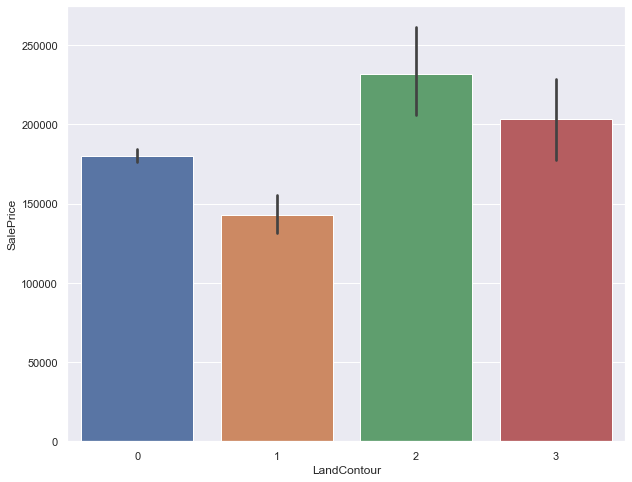

In [50]:
sns.barplot(df_train.LandContour,df_train.SalePrice)

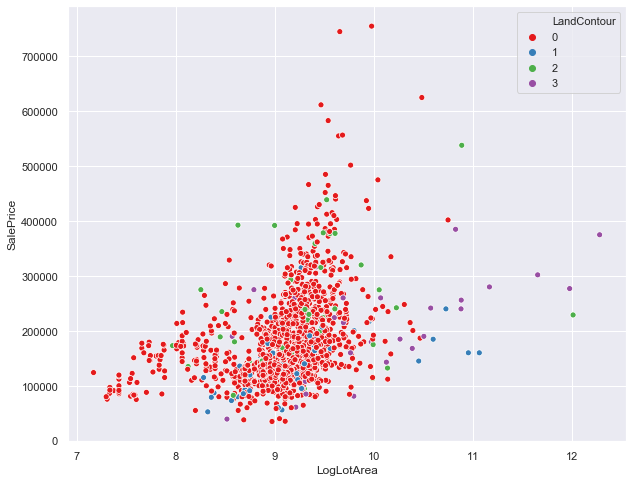

In [51]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue =df_train['LandContour'], palette = 'Set1')

- and low contour is more expensive than banked and hillsides
- high price of those which in RL and from 20 and 60 class and it has flat land 
- bnk has high selling point from 1,20,000  to 1,50,000
- Flat selling point from 1,70,000 to 2,00,000 and 6,00,000 t0 8,00,000
- Low selling point from 50,000 to 1,20,000 and 2,00,000 to 3,50,000
- hill selling point from 3,50,000 to 6,30,000
- after bnk people want to buy flat area property

## 9) Utilities

Utilities: Type of utilities available

       AllPub    All public Utilities (E,G,W,& S)
   
       NoSewr    Electricity, Gas, and Water (Septic Tank)
   
       NoSeWa    Electricity and Gas Only
   
       ELO    Electricity only 
   
Label encoding
       
       AllPub = 0
       
       NoSewr = 1
       
       NoSewa = 2
       
       Elo = 3
       

In [52]:
df_train['Utilities'].value_counts(dropna=False)

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

In [53]:
ut = {'AllPub':0,'NoSewr':1,'NoSeWa':2,'ELO':3}
df_train['Utilities'] = df_train['Utilities'].map(ut)

In [54]:
df_train['Utilities'].describe()

count    1460.000000
mean        0.001370
std         0.052342
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: Utilities, dtype: float64

In [55]:
df_train['Utilities'].value_counts(dropna=False)

0    1459
2       1
Name: Utilities, dtype: int64

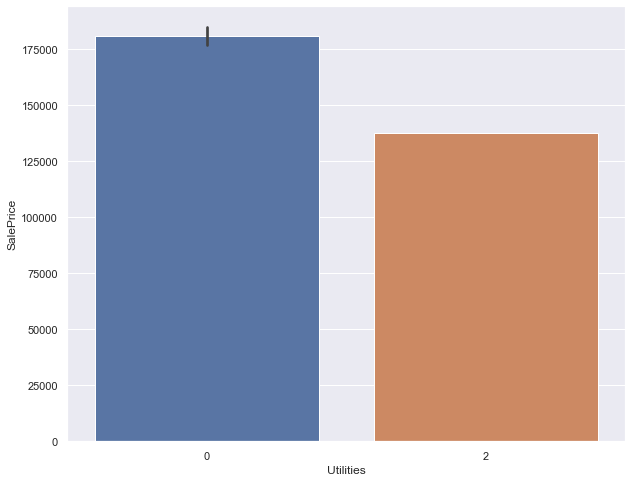

In [56]:
sns.barplot(df_train.Utilities,df_train.SalePrice)

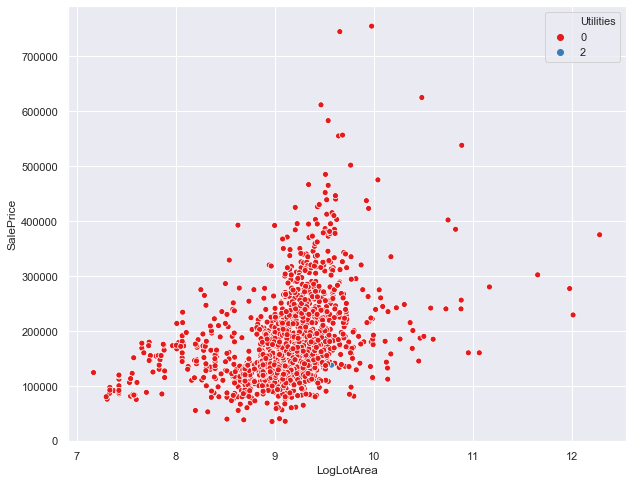

In [57]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue =df_train['Utilities'], palette ='Set1')

- all Houses have All facilities

## 10) LotConfig

LotConfig: Lot configuration

       Inside    Inside lot
   
       Corner    Corner lot
   
       CulDSac    Cul-de-sac
   
       FR2    Frontage on 2 sides of property
   
       FR3    Frontage on 3 sides of property

label encoding
       
       Inside = 0
       
       Corner = 1
       
       CulDSac = 2
       
       FR2 = 3
       
       FR3 = 4
       

In [58]:
df_train['LotConfig'].value_counts(dropna=False)

Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64

In [59]:
lc ={'Inside':0,'Corner':1,'CulDSac':2,'FR2':3,'FR3':4}
df_train['LotConfig'] = df_train['LotConfig'].map(lc)

In [60]:
df_train['LotConfig'].value_counts()

0    1052
1     263
2      94
3      47
4       4
Name: LotConfig, dtype: int64

In [61]:
df_train['LotConfig'].describe()

count    1460.000000
mean        0.416438
std         0.773448
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         4.000000
Name: LotConfig, dtype: float64

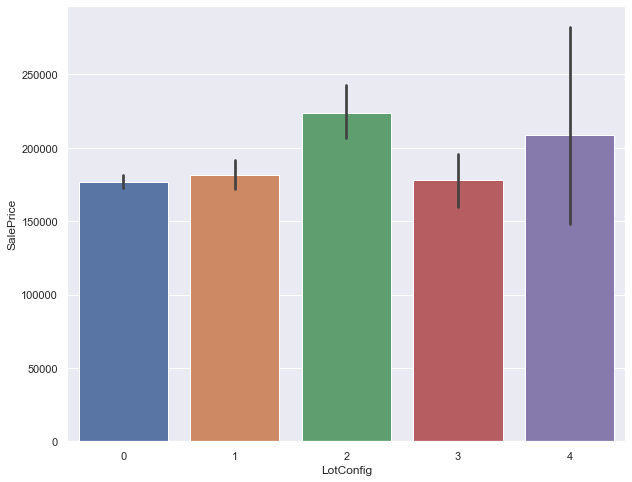

In [62]:
sns.barplot(df_train.LotConfig,df_train.SalePrice)

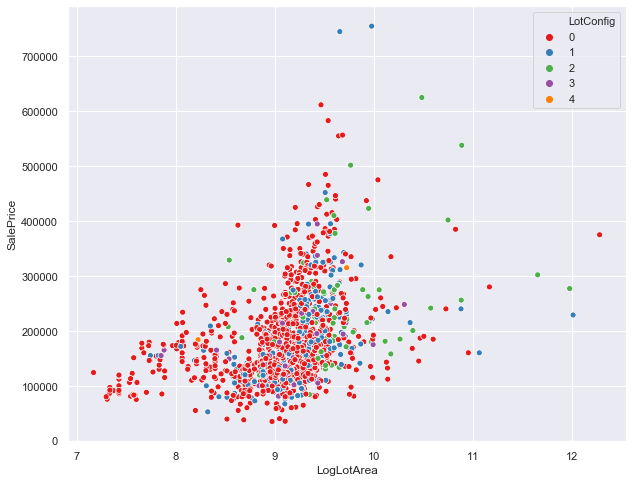

In [63]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['LotConfig'], palette = 'Set1')

- caldsac has lower price range to highj price range houses and it has high distribution 
- below 2,00,000 selling point people are highly insterested in inside, corner and f2
- f3 high selling point where people only f3 2,50,000 to 3,80,000
- strange most expensive house is from corner

## 11) LandSlope

LandSlope: Slope of property

       Gtl    Gentle slope
   
       Mod    Moderate Slope    
       
       Sev    Severe Slope

label encoding 
       
       Gtl = 0
       
       Mod = 1
       
       Sev = 2

In [64]:
df_train['LandSlope'].value_counts()

Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64

In [65]:
ls = {'Gtl':0,'Mod':1,'Sev':2}
df_train['LandSlope'] = df_train['LandSlope'].map(ls)

In [66]:
df_train['LandSlope'].value_counts()

0    1382
1      65
2      13
Name: LandSlope, dtype: int64

In [67]:
df_train['LandSlope'].describe()

count    1460.000000
mean        0.062329
std         0.276232
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: LandSlope, dtype: float64

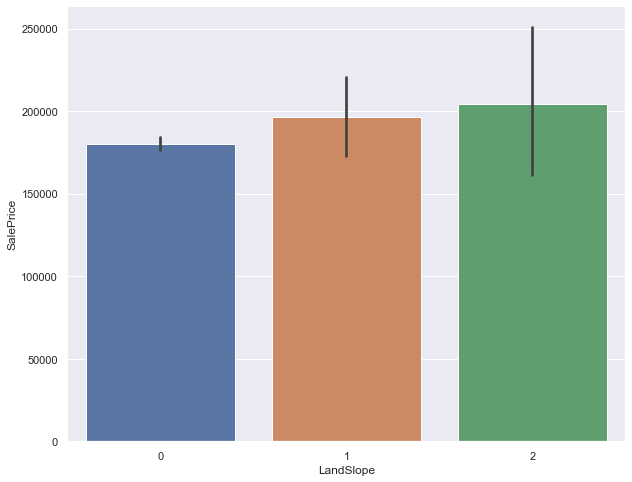

In [68]:
sns.barplot(df_train.LandSlope,df_train.SalePrice,ci =95)

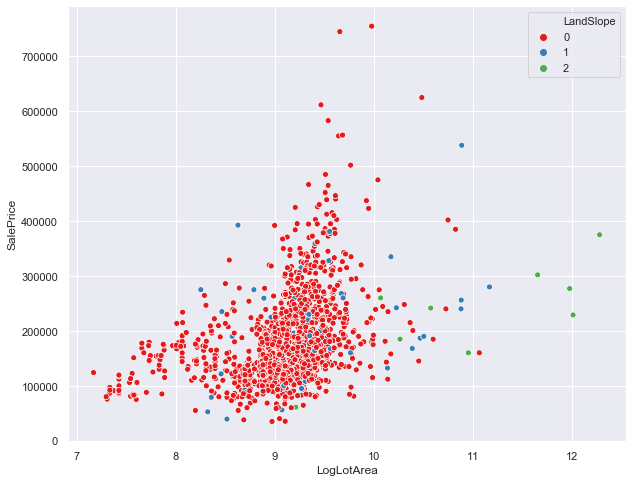

In [69]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['LandSlope'],palette = 'Set1')

- clearly people like gtl slope if there are mod slope or sev slope so selling price goes down from its real price even in sev slope its goes more down from its real value.

- so some expensive houses sale in lower price because they have mod or sev slope 

- Those houses have big lot area but they have sold in less price because they have mod or sev slope (lotArea = 21,00,000 and selling price = 3,80,000)

## 12) Neighborhood

Neighborhood: Physical locations within Ames city limits

   Blmngtn    Bloomington Heights
   
   Blueste    Bluestem
   
   BrDale    Briardale
   
   BrkSide    Brookside
   
   ClearCr    Clear Creek
   
   CollgCr    College Creek
   
   Crawfor    Crawford
   
   Edwards    Edwards
   
   Gilbert    Gilbert
   
   IDOTRR    Iowa DOT and Rail Road
   
   MeadowV    Meadow Village
   
   Mitchel    Mitchell
   
   Names    North Ames
   
   NoRidge    Northridge
   
   NPkVill    Northpark Villa
   
   NridgHt    Northridge Heights
   
   NWAmes    Northwest Ames
   
   OldTown    Old Town
   
   SWISU    South & West of Iowa State University
   
   Sawyer    Sawyer
   
   SawyerW    Sawyer West
   
   Somerst    Somerset
   
   StoneBr    Stone Brook
   
   Timber    Timberland
   
   Veenker    Veenker
   
   
Label encoding

       Blmngtn    0.16
   
       Blueste    0.32
   
       BrDale    0.48
   
       BrkSide    0.64
   
       ClearCr     0.80
   
       CollgCr    0.96
   
       Crawfor    1.12
   
       Edwards    1.28
   
       Gilbert    1.44
   
       IDOTRR    1.60
   
       MeadowV    1.76
   
       Mitchel    1.92
   
       Names    2.08
   
       NoRidge    2.24
   
       NPkVill    2.40
   
       NridgHt    2.56
   
       NWAmes    2.72
   
       OldTown    2.88
   
       SWISU    3.04
   
       Sawyer    3.20
   
       SawyerW    3.36
   
       Somerst    3.52
   
       StoneBr    3.68
   
       Timber    3.84
   
       Veenker    4.00

In [70]:
df_train['Neighborhood'].value_counts(dropna=False)

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
SWISU       25
StoneBr     25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

In [71]:
n= {'Blmngtn':0,'Blueste':1,'BrDale':2,'BrkSide':3,'ClearCr':4,'CollgCr':5,'Crawfor': 6,'Edwards':7,
    'Gilbert':8,'IDOTRR':9,'MeadowV':10,'Mitchel':11,'Names':12,'NoRidge':13,'NPkVill':14,'NridgHt':15,
    'NWAmes':16,'OldTown':17,'SWISU':18,'Sawyer':19,'SawyerW':20,'Somerst':21,'StoneBr':22,'Timber':23,
    'Veenker':24}

df_train['Neighborhood']=df_train['Neighborhood'].map(n)

In [72]:
df_train['Neighborhood'].describe()

count    1235.000000
mean       12.293927
std         6.540381
min         0.000000
25%         6.000000
50%        13.000000
75%        18.000000
max        24.000000
Name: Neighborhood, dtype: float64

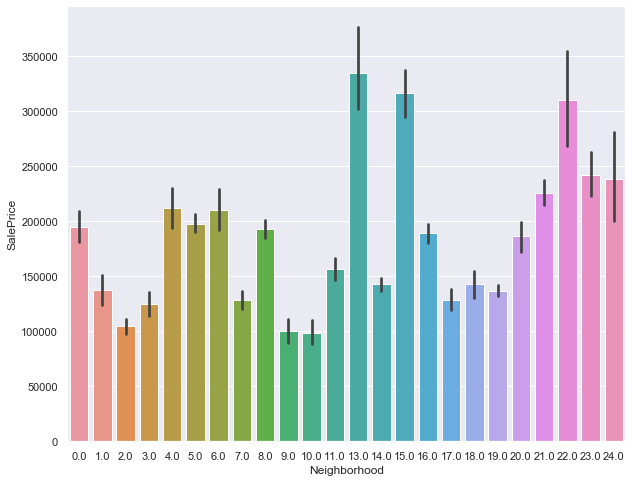

In [73]:
sns.barplot(df_train.Neighborhood,df_train.SalePrice)

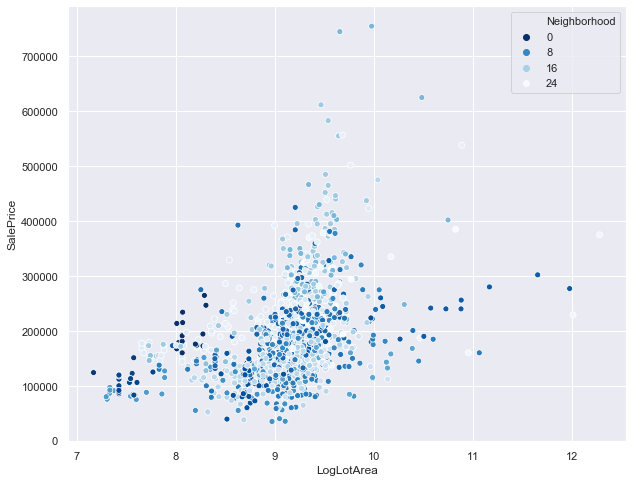

In [74]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],palette='Blues_r',sizes=(50,400),hue=df_train['Neighborhood'])

- 2.56 ( NridgHt) area comes under RL zoning
- in this area if LotArea increases so sale price also increase  

- IDOTRR (1.60) in RM and C 
- those in RM has high price 
- those in C has lower price comparing to those whose are in RM 

- in Blmngtn neighbor houses are expensive in compare to IDOTRR
- there Area is not only factor there is something else which determine price of houses 

- Blueste has two observations 
- both are in RM

- BrDale has all house in RM
- there are other factors for effecting price this neighbor
- this neighbor is less costly than Blueste

- People like to buy house in RM zone in BrkSide neighbor when it falls in 5000sqft to 8500sqft 
- otherwise people like to buy house in RL zone

- in ClearCr neighbor has all house in RL


- those area below 6000 sq ft it will RM
- Otherwise all houses are in RL in CllgCr

- Edwards neighborhood is very sensitive regard Area and sale price
- litte increase change in Area it cause of big jump up in Price

- Gilbert

- MeadowV has all houses in RM zone

- most of the house in RL
- in Mitchel neighborhood landContour and landSlope effect the selling price
- lot shape also effect on sale price

- in NoRidge neighborhood lotconfig affect price if config is CulDSac then price would to hihg
- and it is very expensive neigbhorhood
- shape also effect if IR1 then it would be high price

- No Useful insight
- strange neighborhood
- might be other factors are affecting it

- No Useful insight

- OldTown has relation but area does not much affect price 
- Most of the Houses in the RM zone 

- this Neighborhood has lot of house in FV zone

- other factors are affecting Timber neighborhood

## 13) Condition1: Proximity to various conditions

           Artery    Adjacent to arterial street
           
           Feedr    Adjacent to feeder street    
           
           Norm    Normal    
           
           RRNn    Within 200' of North-South Railroad
           
           RRAn    Adjacent to North-South Railroad
           
           PosN    Near positive off-site feature--park, greenbelt, etc.
           
           PosA    Adjacent to postive off-site feature
           
           RRNe    Within 200' of East-West Railroad
   
           RRAe    Adjacent to East-West Railroad
           
LAbel Encoding
    
            Artery = 0
            
            Feedr = 1
            
            Norm = 2
            
            RRNn = 3
            
            RRAn = 4
            
            PosN = 5
            
            PosA = 6
            
            RRNe = 7
            
            RRAe = 8

In [75]:
df_train['Condition1'].value_counts(dropna=False)

Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64

In [76]:
c1 = {'Artery':0,'Feedr': 1,'Norm': 2,'RRNn':3,'RRAn':4,'PosN':5,'PosA':6,'RRNe':7,'RRAe':8}
df_train['Condition1'] = df_train['Condition1'].map(c1)

In [77]:
df_train['Condition1'].value_counts()

2    1260
1      81
0      48
4      26
5      19
8      11
6       8
3       5
7       2
Name: Condition1, dtype: int64

In [78]:
df_train['Condition1'].describe()

count    1460.000000
mean        2.030822
std         0.878349
min         0.000000
25%         2.000000
50%         2.000000
75%         2.000000
max         8.000000
Name: Condition1, dtype: float64

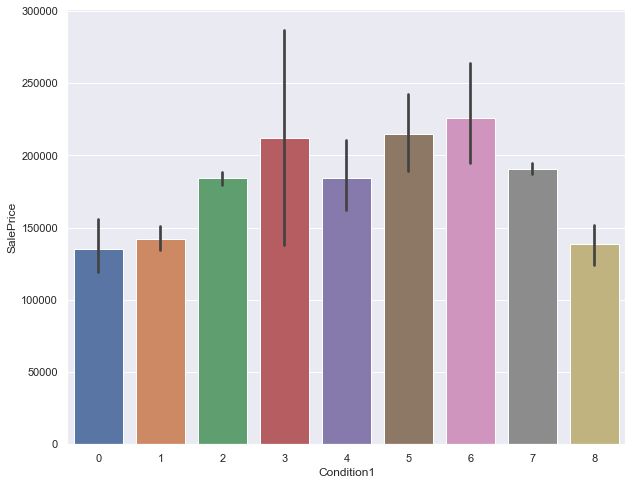

In [79]:
sns.barplot(df_train.Condition1,df_train.SalePrice)

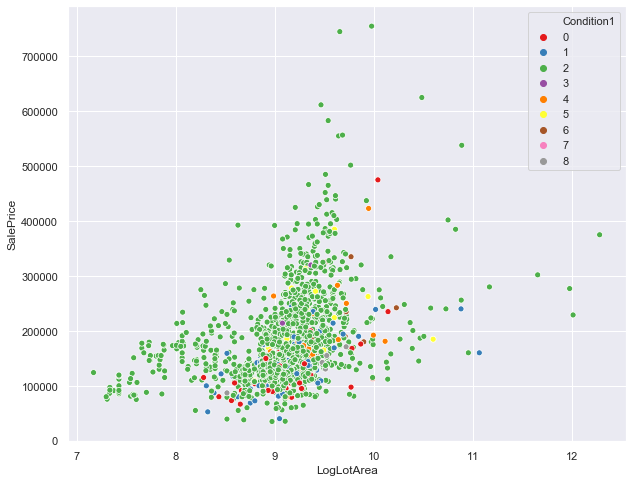

In [80]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue = df_train['Condition1'],palette='Set1')

- in this condition lot of house in RM zone

- price sensitive

- expensive and price sensitive condition

## 14)  Condition2: Proximity to various conditions (if more than one is present)

       Artery    Adjacent to arterial street
       Feedr    Adjacent to feeder street    
       Norm    Normal    
       RRNn    Within 200' of North-South Railroad
       RRAn    Adjacent to North-South Railroad
       PosN    Near positive off-site feature--park, greenbelt, etc.
       PosA    Adjacent to postive off-site feature
       RRNe    Within 200' of East-West Railroad
       RRAe    Adjacent to East-West Railroad

In [81]:
df_train['Condition2'].value_counts()

Norm      1445
Feedr        6
PosN         2
RRNn         2
Artery       2
PosA         1
RRAe         1
RRAn         1
Name: Condition2, dtype: int64

In [82]:
c2 ={'Artery':0,'Feedr': 1,'Norm': 2,'RRNn':3,'RRAn':4,'PosN':5,'PosA':6,'RRNe':7,'RRAe':8}
df_train['Condition2'] = df_train['Condition2'].map(c2)

In [83]:
df_train['Condition2'].value_counts(dropna=False)

2    1445
1       6
5       2
3       2
0       2
8       1
6       1
4       1
Name: Condition2, dtype: int64

In [84]:
df_train['Condition2'].describe()

count    1460.000000
mean        2.006849
std         0.248272
min         0.000000
25%         2.000000
50%         2.000000
75%         2.000000
max         8.000000
Name: Condition2, dtype: float64

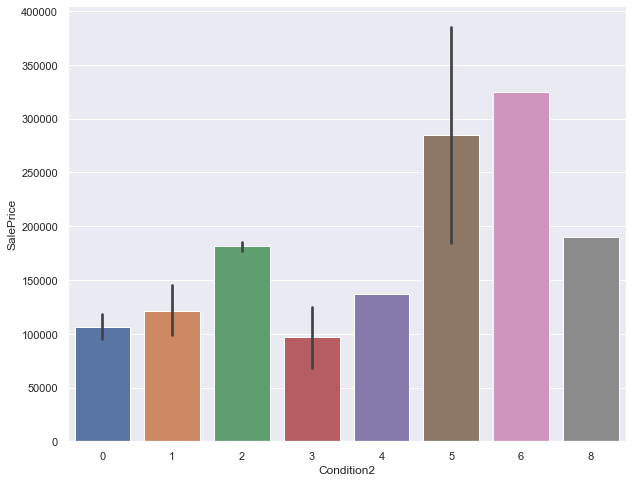

In [85]:
ax = sns.barplot(df_train['Condition2'],df_train['SalePrice'],ci= 95)

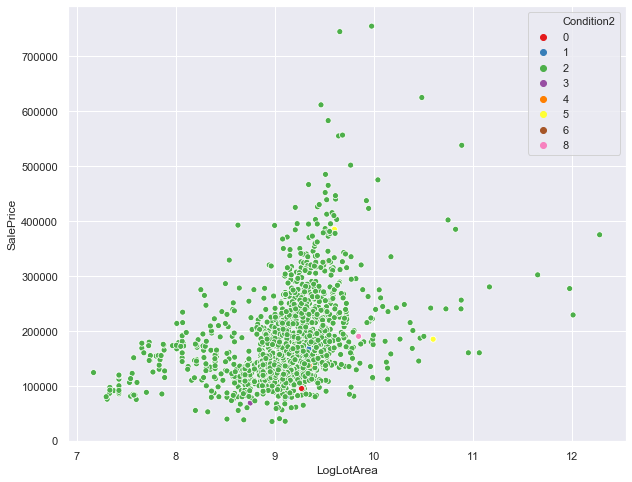

In [86]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],sizes = (500,50), palette= 'Set1', hue = df_train['Condition2'])

# 15) BldgType: Type of dwelling

       1Fam    Single-family Detached    
   
       2FmCon    Two-family Conversion; originally built as one-family dwelling
   
       Duplx    Duplex
   
       TwnhsE    Townhouse End Unit
   
       TwnhsI    Townhouse Inside Unit
       
 Label encoding
        
        1Fam = 0
        
        2FmCon = 1
        
        Duplx = 2
        
        TwhsE = 3
        
        TownhsI = 4

In [87]:
df_train['BldgType'].value_counts()

1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64

In [88]:
Bt = {'1Fam':0,'2fmCon': 1,'Duplex':2,'TwnhsE': 3,'Twnhs': 4}
df_train['BldgType'] = df_train['BldgType'].map(Bt)

In [89]:
df_train['BldgType'].value_counts()

0    1220
3     114
2      52
4      43
1      31
Name: BldgType, dtype: int64

In [90]:
df_train['BldgType'].describe()


count    1460.000000
mean        0.444521
std         1.068108
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         4.000000
Name: BldgType, dtype: float64

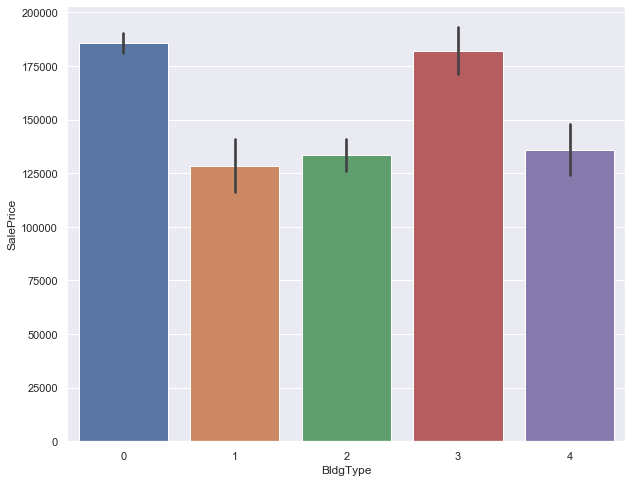

In [91]:
sns.barplot(df_train['BldgType'],df_train['SalePrice'])

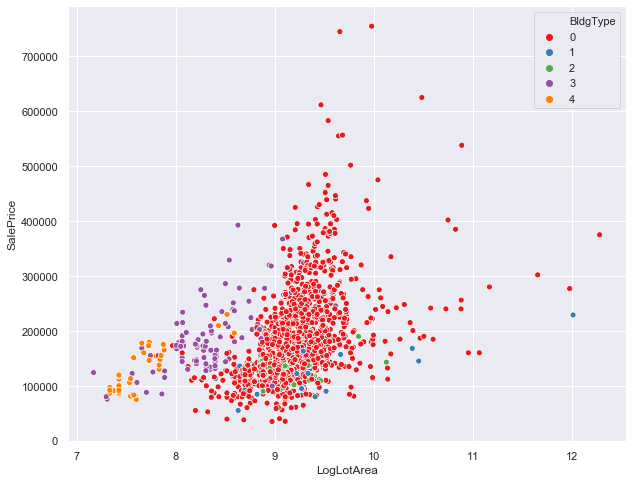

In [92]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], palette= 'Set1', hue = df_train['BldgType'])

- single one family type has All type sub classes except 190 and 90

- Two-family Conversion; originally built as one-family dwelling is 190 mssubclass

- Duplex type is 90 mssubclass

- 120, 160 and few 20 in Townhouse End Unit

- 120, 160 and few 20 in Townhouse inside unit

## 16) HouseStyle: Style of dwelling

       1Story    One story
   
       1.5Fin    One and one-half story: 2nd level finished
   
       1.5Unf    One and one-half story: 2nd level unfinished
       
       2Story    Two story
   
       2.5Fin    Two and one-half story: 2nd level finished
   
       2.5Unf    Two and one-half story: 2nd level unfinished
   
       SFoyer    Split Foyer
       
       SLvl    Split Level
       
Label Encoding
       
       1Story = 0
       
       1.5Fin = 0.5
       
       1.5Unf = 1.0
        
       2story = 1.5
       
       2.5Fin = 2
       
       2.5Unf = 2.5
       
       SFoyer = 3.0
       
       SLvl = 3.5
     

In [93]:
df_train['HouseStyle'].value_counts()

1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64

In [94]:
hs = {'1Story':0,'1.5Fin':1,'1.5Unf':2,'2Story':3,'2.5Fin':4,'2.5Unf':5,'SFoyer':6,'SLvl':7}
df_train['HouseStyle'] = df_train['HouseStyle'].map(hs) 

In [95]:
df_train['HouseStyle'].value_counts()

0    726
3    445
1    154
7     65
6     37
2     14
5     11
4      8
Name: HouseStyle, dtype: int64

In [96]:
df_train['HouseStyle'].describe()

count    1460.000000
mean        1.562329
std         1.954122
min         0.000000
25%         0.000000
50%         1.000000
75%         3.000000
max         7.000000
Name: HouseStyle, dtype: float64

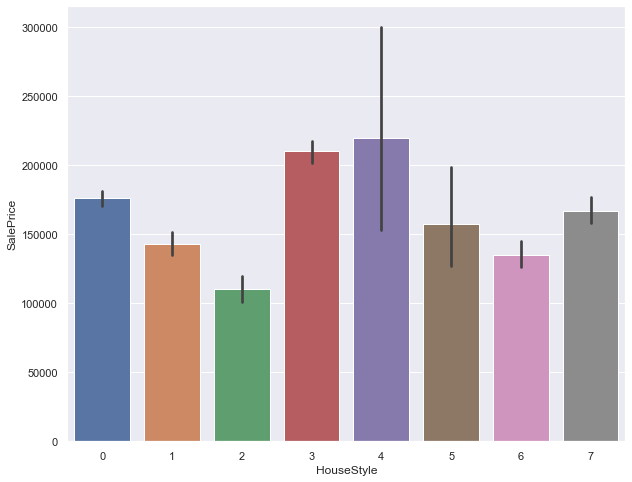

In [97]:
sns.barplot(df_train['HouseStyle'],df_train['SalePrice'], ci =95, )

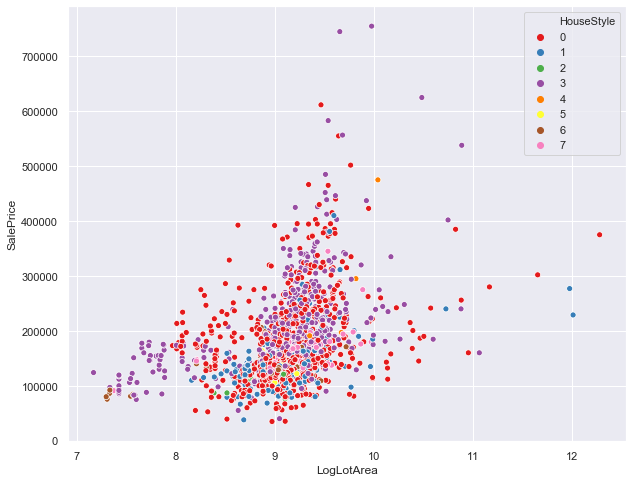

In [98]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], palette= 'Set1', hue = df_train['HouseStyle'])

- 20 Mssubclass has 1 story house style 
- 60 has 2 story house style

- Most the houses in 50 subclass have 1.5 finished

- most of houses in 45 subclass have 1.5 story and unfinshed 

-  20, 70, 160 and 190 have 2 story house style  

 - few houses in 70,160 and 190 subclass have 2.5 story 

- 2 story unfinished houses are in 160,190 subclass

- 85 and 180 subclass have sFoyer

- majority of 80 subclass have slvl

## 17) OverallQual: Rates the overall material and finish of the house

       10   Very Excellent
       9    Excellent
       8    Very Good
       7    Good
       6    Above Average
       5    Average
       4    Below Average
       3    Fair
       2    Poor
       1    Very Poor

In [99]:
df_train['OverallQual'].value_counts(dropna=False)

5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64

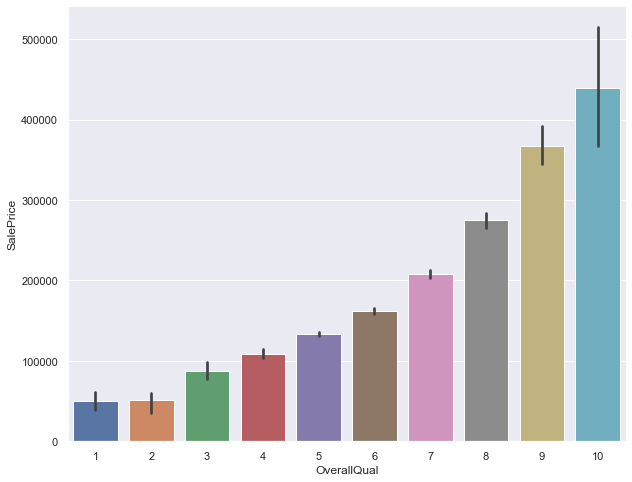

In [100]:
sns.barplot(df_train['OverallQual'],df_train['SalePrice'])

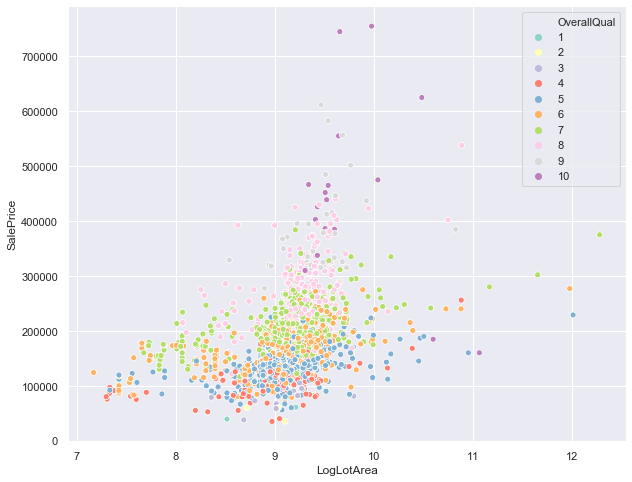

In [101]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], palette= 'Set3', hue =  df_train['OverallQual'])

## 18) OverallCond: Rates the overall condition of the house

  
      
      10    Very Excellent
   
       9    Excellent
   
       8    Very Good
   
       7    Good
   
       6    Above Average    
   
       5    Average
   
       4    Below Average    
   
       3    Fair
   
       2    Poor
   
       1    Very Poor

In [102]:
df_train['OverallCond'].value_counts()

5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64

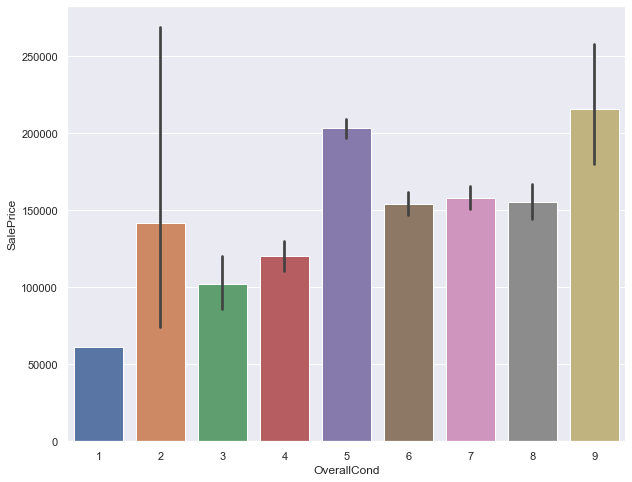

In [103]:
sns.barplot(df_train['OverallCond'],df_train['SalePrice'])

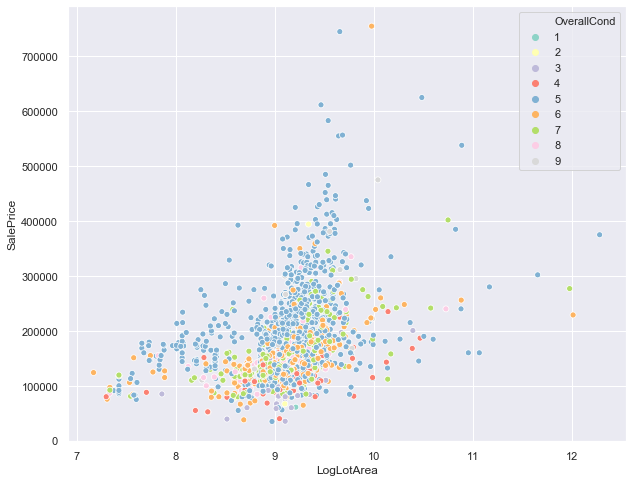

In [104]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],palette= 'Set3', hue =  df_train['OverallCond'])

## 19) YearBuilt

In [105]:
df_train['YearBuilt'].value_counts()

2006    67
2005    64
2004    54
2007    49
2003    45
        ..
1906     1
1911     1
1913     1
1917     1
1872     1
Name: YearBuilt, Length: 112, dtype: int64

In [106]:
df_train['YearBuilt'].describe(include=all)

count    1460.000000
mean     1971.267808
std        30.202904
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64

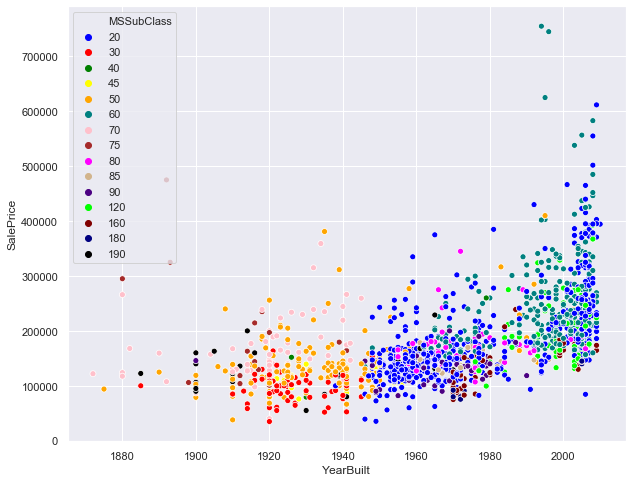

In [107]:
sns.scatterplot(df_train['YearBuilt'],df_train['SalePrice'],hue= df_train['MSSubClass'], palette = setss)

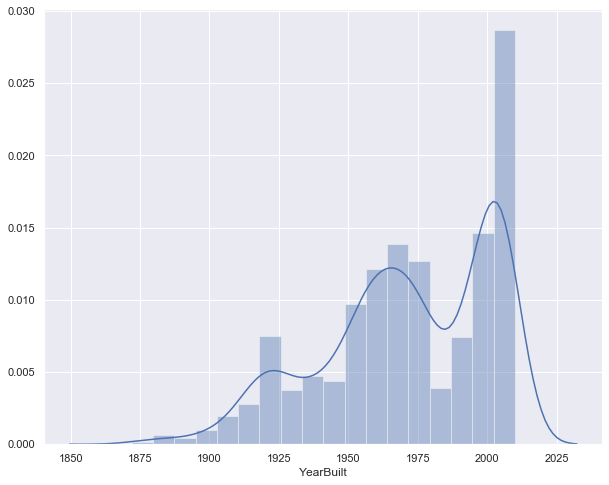

In [108]:
sns.distplot(df_train['YearBuilt'])

# Binning

In [109]:
(2010-1872)/6

23.0

In [110]:
x = 1872
for i in range(0,139):
    if x == 2010:
        break
    else:
        x += 23
        print(x)

1895
1918
1941
1964
1987
2010


In [111]:
df_train.loc[df_train['YearBuilt']<=1895,'YearBuilt'] = 0
df_train.loc[(df_train['YearBuilt']>1895)&(df_train['YearBuilt']<=1918),'YearBuilt'] = 1
df_train.loc[(df_train['YearBuilt']>1918)&(df_train['YearBuilt']<=1941),'YearBuilt'] = 2
df_train.loc[(df_train['YearBuilt']>1941)&(df_train['YearBuilt']<=1964),'YearBuilt'] = 3
df_train.loc[(df_train['YearBuilt']>1964)&(df_train['YearBuilt']<=1987),'YearBuilt'] = 4
df_train.loc[(df_train['YearBuilt']>1987)&(df_train['YearBuilt']<=2010),'YearBuilt'] = 5

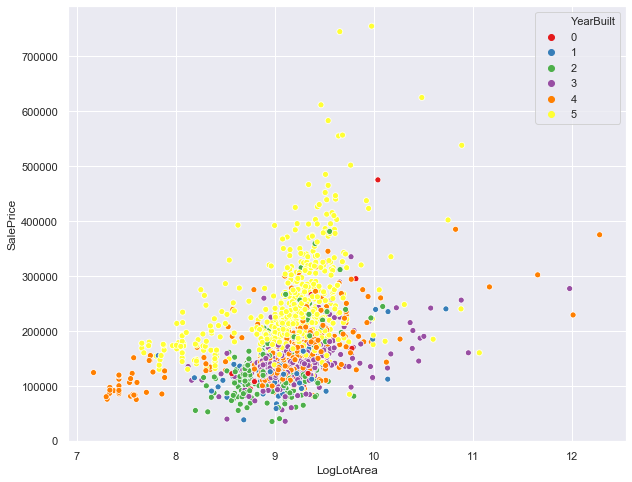

In [112]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue= df_train['YearBuilt'], palette = 'Set1')

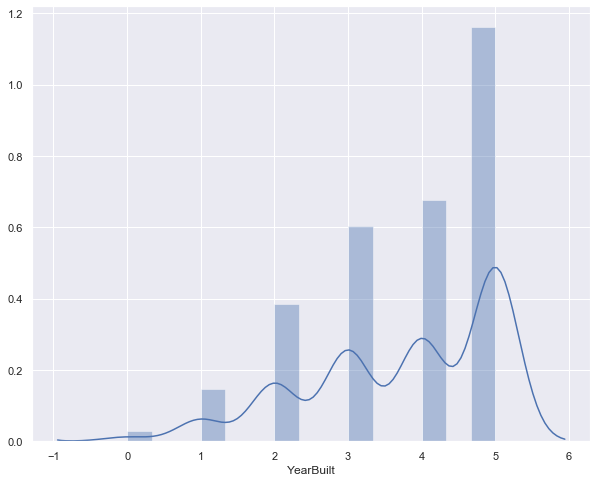

In [113]:
sns.distplot(df_train['YearBuilt'])

## 20) YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)

In [114]:
df_train['YearRemodAdd'].value_counts()

1950    178
2006     97
2007     76
2005     73
2004     62
       ... 
2010      6
1983      5
1952      5
1986      5
1951      4
Name: YearRemodAdd, Length: 61, dtype: int64

In [115]:
df_train['YearRemodAdd'].describe()

count    1460.000000
mean     1984.865753
std        20.645407
min      1950.000000
25%      1967.000000
50%      1994.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64

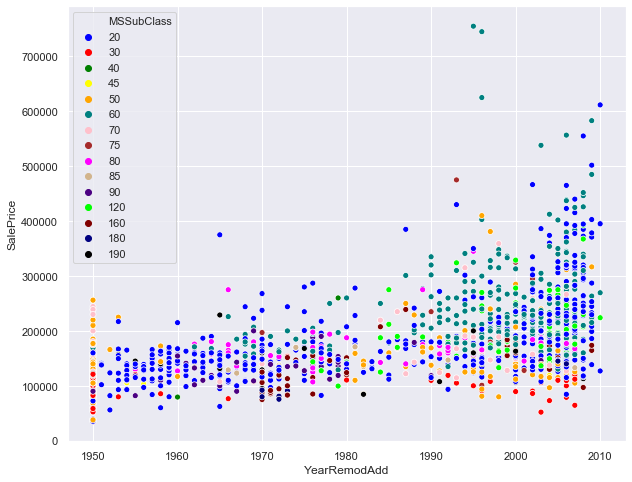

In [116]:
sns.scatterplot(df_train['YearRemodAdd'],df_train['SalePrice'],hue= df_train['MSSubClass'], palette = setss)

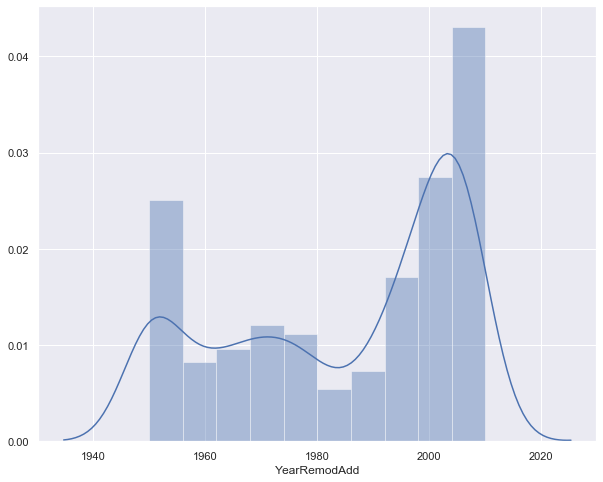

In [117]:
sns.distplot(df_train['YearRemodAdd'])

# Binning

In [118]:
df_train.loc[df_train['YearRemodAdd']<=1965,'YearRemodAdd'] = 0
df_train.loc[(df_train['YearRemodAdd']>1965)&(df_train['YearRemodAdd']<=1980),'YearRemodAdd'] = 1
df_train.loc[(df_train['YearRemodAdd']>1980)&(df_train['YearRemodAdd']<=1995),'YearRemodAdd'] = 2
df_train.loc[(df_train['YearRemodAdd']>1995)&(df_train['YearRemodAdd']<=2010),'YearRemodAdd'] = 3

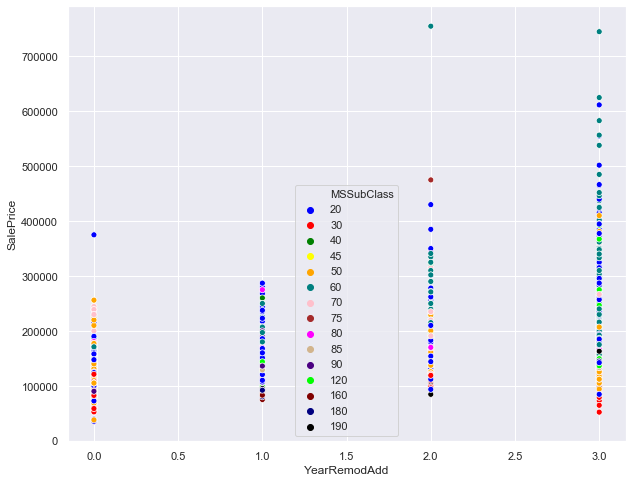

In [119]:
sns.scatterplot(df_train['YearRemodAdd'],df_train['SalePrice'],hue= df_train['MSSubClass'], palette = setss)

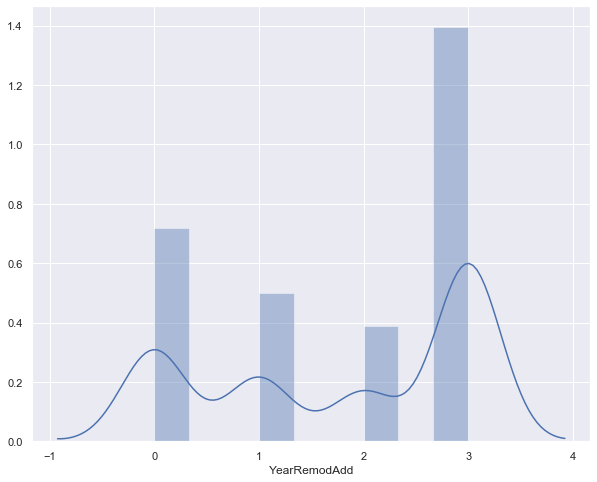

In [120]:
sns.distplot(df_train['YearRemodAdd'])

## 21) RoofStyle: Type of roof

   
       Flat    Flat = 0
   
       Gable    Gable = 1
   
       Gambrel    Gabrel (Barn) = 2
   
       Hip    Hip = 3
   
       Mansard    Mansard = 4
   
       Shed    Shed = 5

In [121]:
df_train['RoofStyle'].value_counts(dropna=False)

Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64

In [122]:
rs = {'Flat':0,'Gable':1,'Gambrel':2,'Hip':3,'Mansard':4,'Shed':5}
df_train['RoofStyle'] = df_train['RoofStyle'].map(rs)

In [123]:
df_train['RoofStyle'].value_counts()

1    1141
3     286
0      13
2      11
4       7
5       2
Name: RoofStyle, dtype: int64

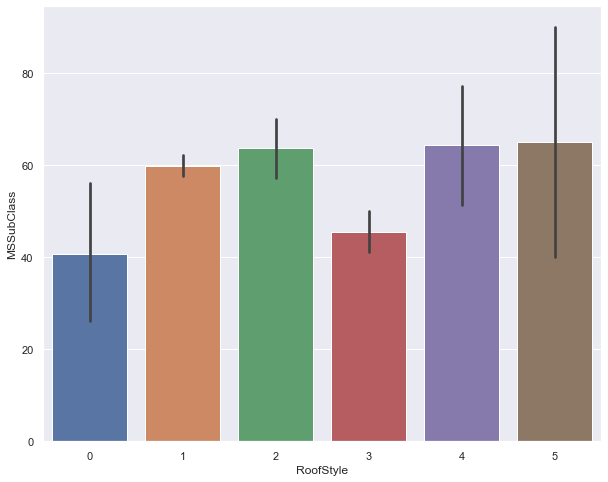

In [124]:
sns.barplot(df_train['RoofStyle'],df_train['MSSubClass'])

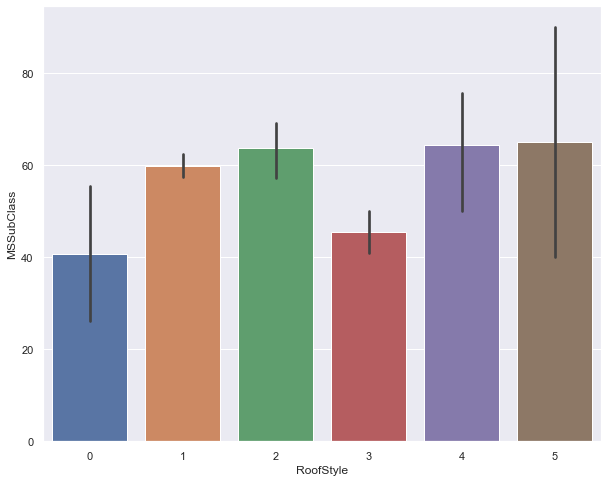

In [125]:
sns.barplot(df_train['RoofStyle'],df_train['MSSubClass'])


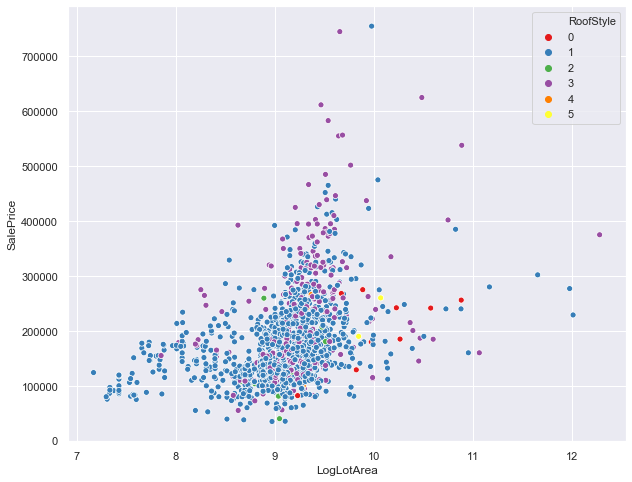

In [126]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], palette= 'Set1', hue = df_train['RoofStyle'])

## 22) RoofMatl: Roof material

       ClyTile    Clay or Tile = 0
       CompShg    Standard (Composite) Shingle = 1
       Membran    Membrane = 2
       Metal    Metal = 3
       Roll    Roll = 4
       Tar&Grv    Gravel & Tar = 5
       WdShake    Wood Shakes = 6
       WdShngl    Wood Shingles = 7

In [127]:
df_train['RoofMatl'].value_counts(dropna=False)

CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
ClyTile       1
Roll          1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64

In [128]:
rm ={'ClyTile': 0,'CompShg': 1,'Membran': 2,'Metal': 3,'Roll': 4,'Tar&Grv': 5,'WdShake': 6,'WdShngl':7}
df_train['RoofMatl'] = df_train['RoofMatl'].map(rm)

In [129]:
df_train['RoofMatl'].value_counts(dropna=False)

1    1434
5      11
7       6
6       5
4       1
3       1
2       1
0       1
Name: RoofMatl, dtype: int64

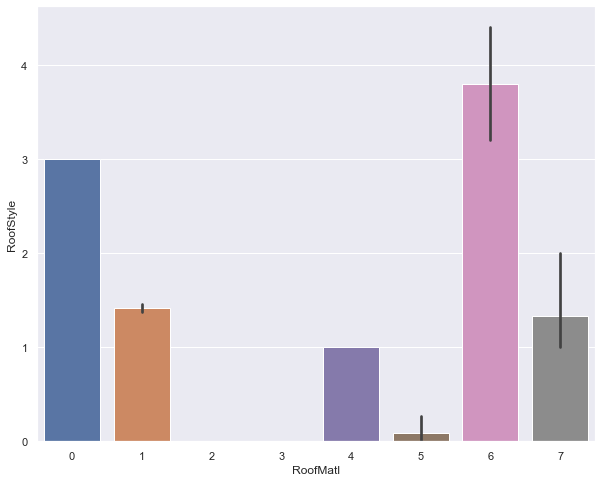

In [130]:
sns.barplot(df_train['RoofMatl'],df_train['RoofStyle']) 

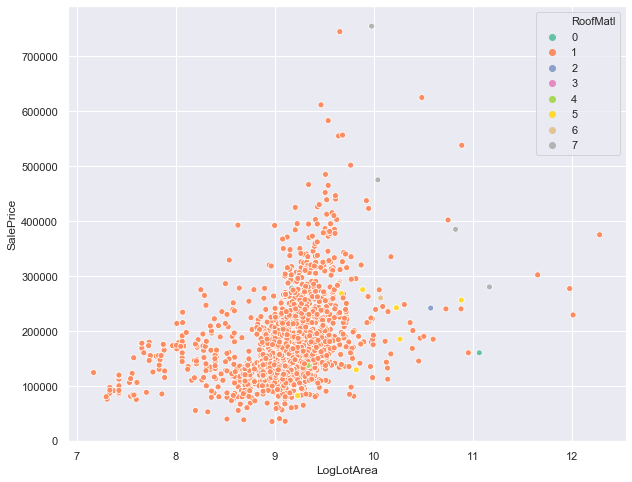

In [131]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['RoofMatl'],palette='Set2') 

## 23) Exterior1st: Exterior covering on house

       AsbShng:0    Asbestos Shingles
       AsphShn:1    Asphalt Shingles
       BrkComm:2    Brick Common
       BrkFace:3    Brick Face
       CBlock:4    Cinder Block
       CemntBd:5    Cement Board
       HdBoard:6    Hard Board
       ImStucc:7    Imitation Stucco
       MetalSd:8    Metal Siding
       Other:9    Other
       Plywood:10    Plywood
       PreCast:11    PreCast    
       Stone:12    Stone
       Stucco:13    Stucco
       VinylSd:14    Vinyl Siding
       Wd Sdng:15    Wood Siding
       WdShing:16    Wood Shingles

In [132]:
df_train['Exterior1st'].value_counts(dropna=False)

VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
Stone        2
BrkComm      2
AsphShn      1
ImStucc      1
CBlock       1
Name: Exterior1st, dtype: int64

In [133]:
e1 ={'AsbShng':0, 
'AsphShn':1, 
'BrkComm':2, 
'BrkFace':3, 
'CBlock':4,  
'CemntBd':5, 
'HdBoard':6, 
'ImStucc':7, 
'MetalSd':8, 
'Other':9,   
'Plywood':10,
'PreCast':11,
'Stone':12,  
'Stucco':13, 
'VinylSd':14,
'Wd Sdng':15,
'WdShing':16,}
df_train['Exterior1st'] = df_train['Exterior1st'].map(e1)

In [134]:
df_train['Exterior1st'].value_counts(dropna=False)

14    515
6     222
8     220
15    206
10    108
5      61
3      50
16     26
13     25
0      20
12      2
2       2
7       1
4       1
1       1
Name: Exterior1st, dtype: int64

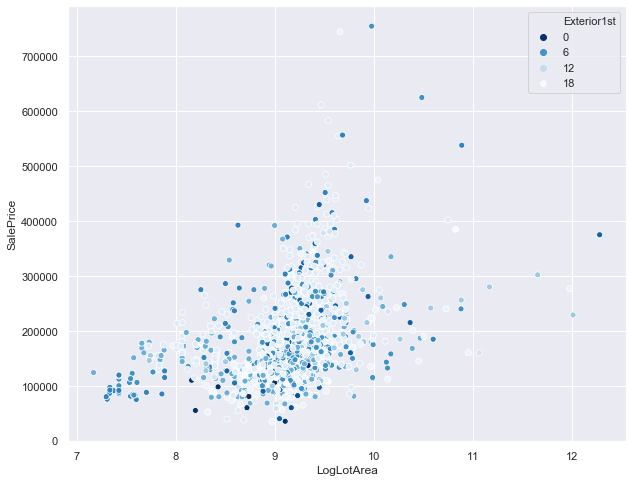

In [135]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], palette= 'Blues_r', hue = df_train['Exterior1st'])

## 24) Exterior2nd: Exterior covering on house (if more than one material)

       AsbShng    Asbestos Shingles
       AsphShn    Asphalt Shingles
       BrkComm    Brick Common
       BrkFace    Brick Face
       CBlock    Cinder Block
       CemntBd    Cement Board
       HdBoard    Hard Board
       ImStucc    Imitation Stucco
       MetalSd    Metal Siding
       Other    Other
       Plywood    Plywood
       PreCast    PreCast
       Stone    Stone
       Stucco    Stucco
       VinylSd    Vinyl Siding
       Wd Sdng    Wood Siding
       WdShing    Wood Shingles

In [136]:
df_train['Exterior2nd'].value_counts()

VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
Other        1
CBlock       1
Name: Exterior2nd, dtype: int64

In [137]:
e2 ={'AsbShng':0, 
'AsphShn':1, 
'BrkComm':2, 
'BrkFace':3, 
'CBlock':4,  
'CemntBd':5, 
'HdBoard':6, 
'ImStucc':7, 
'MetalSd':8, 
'Other':9,   
'Plywood':10,
'PreCast':11,
'Stone':12,  
'Stucco':13, 
'VinylSd':14,
'Wd Sdng':15,
'WdShing':16,}
df_train['Exterior2nd'] = df_train['Exterior2nd'].map(e2)

In [138]:
df_train['Exterior2nd'].value_counts(dropna =False)

14.0    504
8.0     214
6.0     207
15.0    197
10.0    142
NaN     105
13.0     26
3.0      25
0.0      20
7.0      10
12.0      5
1.0       3
4.0       1
9.0       1
Name: Exterior2nd, dtype: int64

In [139]:
ed = pd.DataFrame()
ed['ex1'] =df_train['Exterior1st']
ed['ex2'] = df_train['Exterior2nd']

In [140]:
ed

,ex1,ex2
0,14,14.0
1,8,8.0
2,14,14.0
3,15,NaN
4,14,14.0
...,...,...
1455,14,14.0
1456,10,10.0
1457,5,NaN
1458,8,8.0


In [141]:
ed['ex2'].fillna(ed.groupby('ex1')['ex2'].transform('median'),inplace = True)


In [142]:
med = ed['ex2'].median()
ed['ex2'].fillna(med,inplace =True)

In [143]:
ed['ex2'].value_counts(dropna=True)

14.0    511
15.0    266
8.0     215
6.0     208
10.0    164
13.0     30
3.0      26
0.0      20
7.0      10
12.0      5
1.0       3
4.0       1
9.0       1
Name: ex2, dtype: int64

In [144]:
f = []
for i in range(0,1460):
    if ed.iloc[i,0] == ed.iloc[i,1]:
        f.append(1)
    else:
        f.append(2)

In [145]:
 x1 = np.array([f])

In [146]:
x1 = x1.transpose()

In [147]:
ed['ext_n'] = x1

In [148]:
ed

,ex1,ex2,ext_n
0,14,14.0,1
1,8,8.0,1
2,14,14.0,1
3,15,15.0,1
4,14,14.0,1
...,...,...,...
1455,14,14.0,1
1456,10,10.0,1
1457,5,15.0,2
1458,8,8.0,1


In [149]:
df_train['ext_no'] = ed['ext_n']

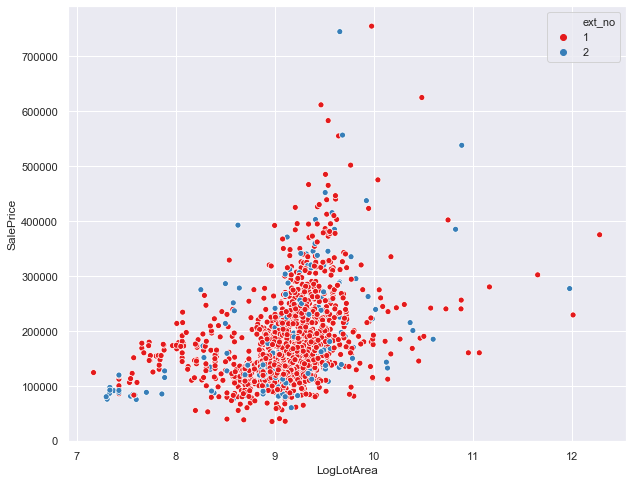

In [150]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], palette= 'Set1', hue = df_train['ext_no'])

## 25) MasVnrType: Masonry veneer type

       BrkCmn    Brick Common = 1
       BrkFace    Brick Face = 2
       CBlock    Cinder Block = 3
       None    None = 0
       Stone    Stone = 4

In [151]:
df_train['MasVnrType'].value_counts(dropna=False)

None       864
BrkFace    445
Stone      128
BrkCmn      15
NaN          8
Name: MasVnrType, dtype: int64

In [152]:
mv ={'BrkCmn':1,
'BrkFace':2,
'CBlock':3,
'NaN':0,
'Stone':4}
df_train['MasVnrType'] = df_train['MasVnrType'].map(mv)

In [153]:
df_train['MasVnrType'].fillna(0,inplace=True)

In [154]:
df_train['MasVnrType'].value_counts(dropna=False)

0.0    872
2.0    445
4.0    128
1.0     15
Name: MasVnrType, dtype: int64

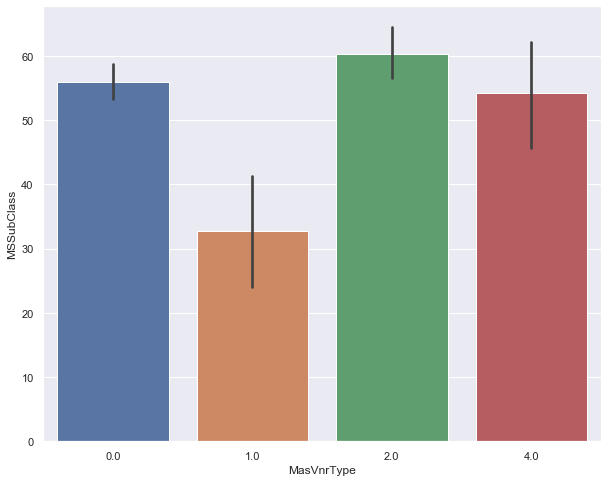

In [155]:
sns.barplot(df_train['MasVnrType'],df_train['MSSubClass'])

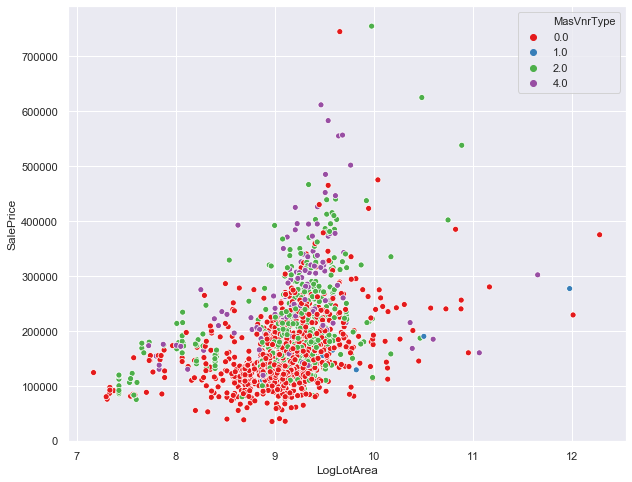

In [156]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], palette= 'Set1', hue = df_train['MasVnrType'])

## 26) MasVnrArea: Masonry veneer area in square feet

In [157]:
df_train['MasVnrArea'].value_counts(dropna=False)

0.0      861
72.0       8
180.0      8
NaN        8
108.0      8
        ... 
337.0      1
415.0      1
293.0      1
259.0      1
621.0      1
Name: MasVnrArea, Length: 328, dtype: int64

In [158]:
df_train['MasVnrArea'].describe()

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64

In [159]:
df_train['MasVnrArea'].fillna(df_train.groupby('MasVnrType')['MasVnrArea'].transform('median'),inplace=True)

In [160]:
df_train['MasVnrArea']

0       196.0
1         0.0
2       162.0
3         0.0
4       350.0
        ...  
1455      0.0
1456    119.0
1457      0.0
1458      0.0
1459      0.0
Name: MasVnrArea, Length: 1460, dtype: float64

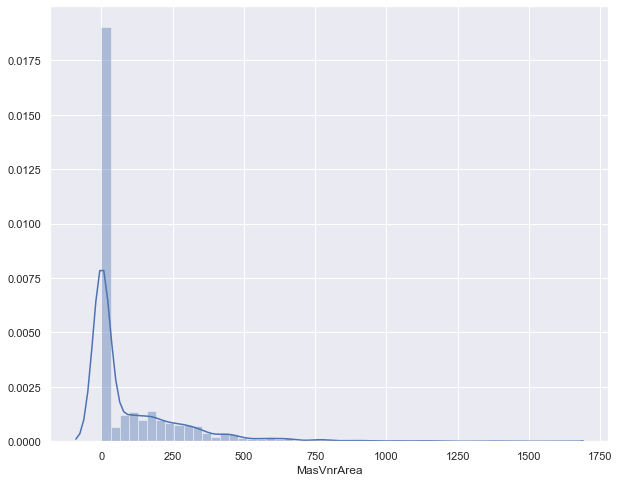

In [161]:
sns.distplot(df_train['MasVnrArea'])

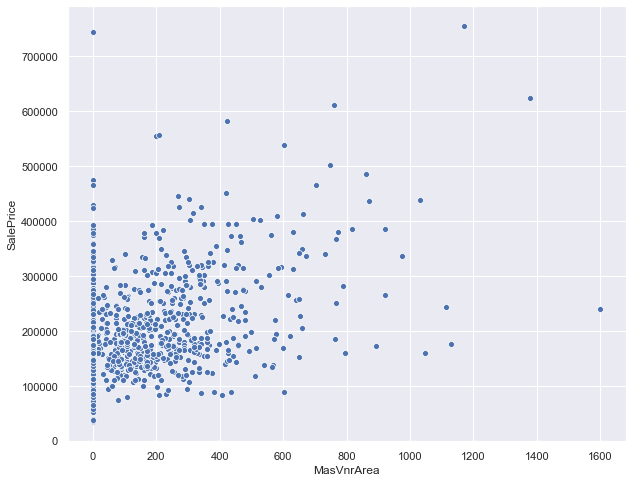

In [162]:
sns.scatterplot(df_train['MasVnrArea'],df_train['SalePrice'])

## 27) ExterQual: Evaluates the quality of the material on the exterior 
		
       Ex	Excellent = 1
       Gd	Good = 2
       TA	Average/Typical = 3
       Fa	Fair = 4
       Po	Poor = 5

In [163]:
df_train['ExterQual'].value_counts(dropna= False)

TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64

In [164]:
eq = {'Ex':1, 'Gd':2, 'TA':3, 'Fa':4, 'Po':5}
df_train['ExterQual'] = df_train['ExterQual'].map(eq)

In [165]:
df_train['ExterQual'].value_counts(dropna= False)

3    906
2    488
1     52
4     14
Name: ExterQual, dtype: int64

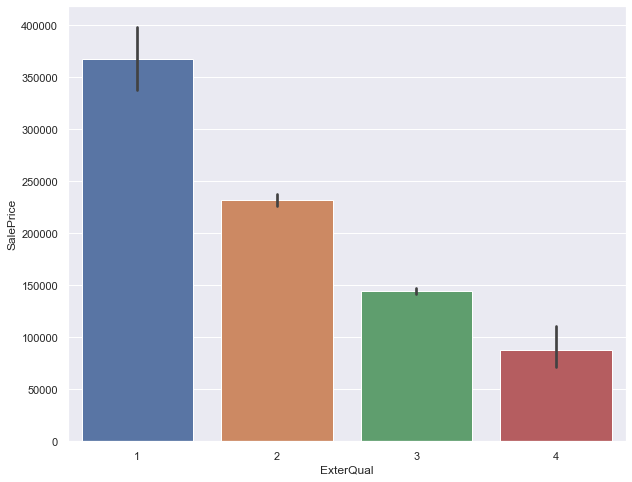

In [166]:
sns.barplot(df_train['ExterQual'],df_train['SalePrice'])

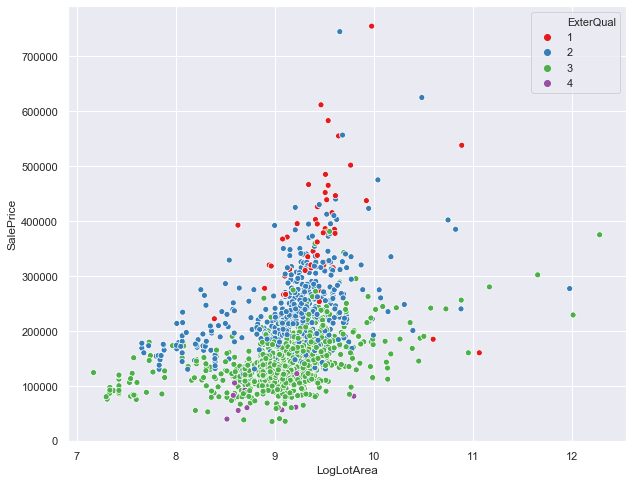

In [167]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['ExterQual'],palette = 'Set1')

## 28) ExterCond: Evaluates the present condition of the material on the exterior

       Ex    Excellent = 1
       Gd    Good = 2
       TA    Average/Typical = 3
       Fa    Fair = 4
       Po    Poor = 5

In [168]:
df_train['ExterCond'].value_counts(dropna=False)

TA    1282
Gd     146
Fa      28
Ex       3
Po       1
Name: ExterCond, dtype: int64

In [169]:
ec = {'Ex':1, 'Gd':2, 'TA':3, 'Fa':4, 'Po':5}
df_train['ExterCond']= df_train['ExterCond'].map(ec)

In [170]:
df_train['ExterCond'].value_counts(dropna=False)

3    1282
2     146
4      28
1       3
5       1
Name: ExterCond, dtype: int64

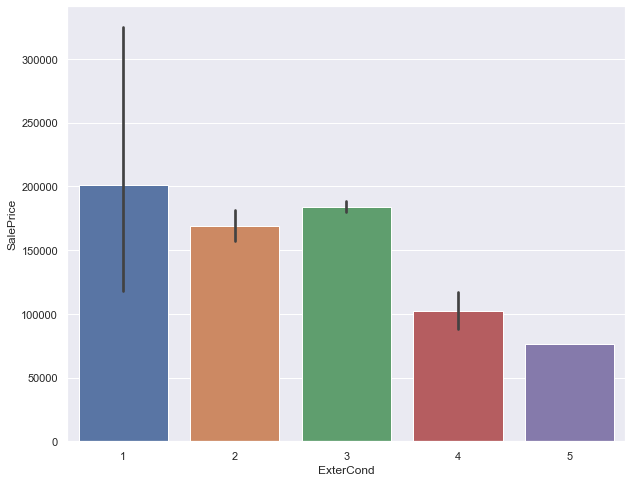

In [171]:
sns.barplot(df_train['ExterCond'],df_train['SalePrice'])

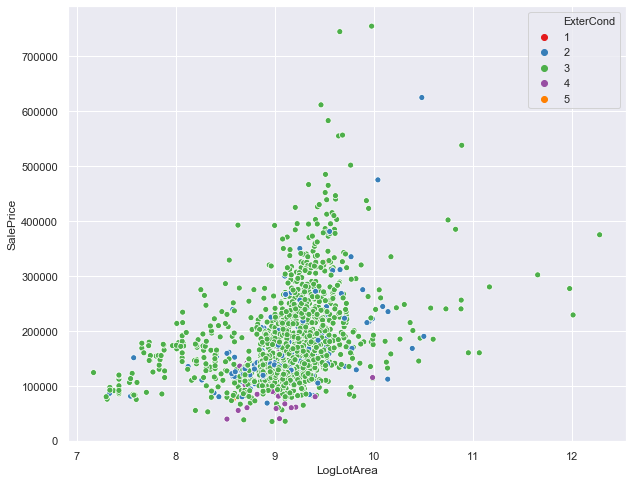

In [172]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue =df_train['ExterCond'],palette='Set1')

## 29) Foundation: Type of foundation

       BrkTil    Brick & Tile = 0
       CBlock    Cinder Block = 1
       PConc    Poured Contrete  = 2  
       Slab    Slab = 3
       Stone    Stone = 4
       Wood    Wood = 5

In [173]:
df_train['Foundation'].value_counts(dropna = False)

PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64

In [174]:
fd = {'BrkTil':0,'CBlock':1,'PConc':2,'Slab':3,'Stone':4,'Wood':5}
df_train['Foundation'] = df_train['Foundation'].map(fd)

In [175]:
df_train['Foundation'].value_counts(dropna = False)

2    647
1    634
0    146
3     24
4      6
5      3
Name: Foundation, dtype: int64

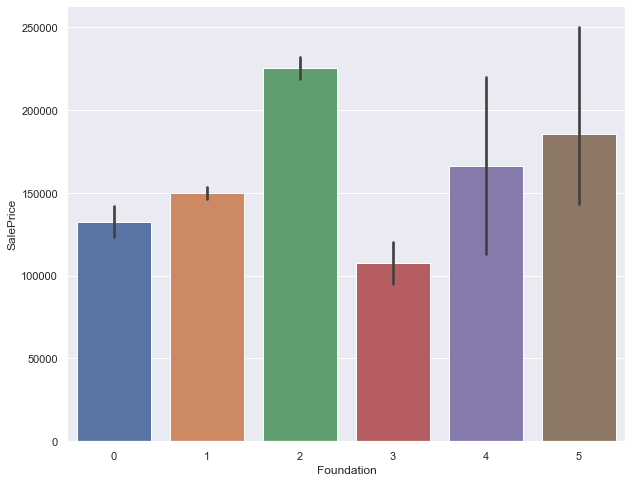

In [176]:
sns.barplot(df_train['Foundation'],df_train['SalePrice'])

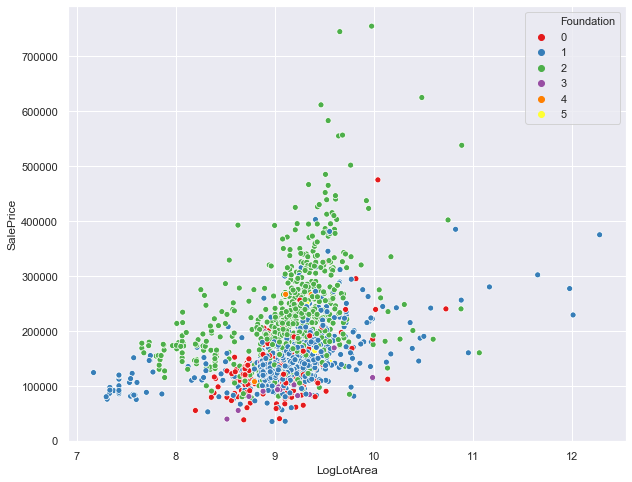

In [177]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['Foundation'], palette = 'Set1')

## 30) BsmtQual: Evaluates the height of the basement
       
       NA    No Basement = 0
       Ex    Excellent (100+ inches) = 1    
       Gd    Good (90-99 inches) = 2
       TA    Typical (80-89 inches) = 3
       Fa    Fair (70-79 inches) = 4
       Po    Poor (<70 inches) = 5

In [178]:
df_train['BsmtQual'].value_counts(dropna=False)

TA     649
Gd     618
Ex     121
NaN     37
Fa      35
Name: BsmtQual, dtype: int64

In [179]:
bq = {'Ex':1,'Gd':2,'TA':3,'Fa':4,'Po':5, 'NaN':0}
df_train['BsmtQual'] = df_train['BsmtQual'].map(bq)

In [180]:
df_train['BsmtQual'].value_counts(dropna=False)

3.0    649
2.0    618
1.0    121
NaN     37
4.0     35
Name: BsmtQual, dtype: int64

In [181]:
df_train['BsmtQual'] = df_train['BsmtQual'].fillna(0)

In [182]:
df_train['BsmtQual'].value_counts(dropna=False)

3.0    649
2.0    618
1.0    121
0.0     37
4.0     35
Name: BsmtQual, dtype: int64

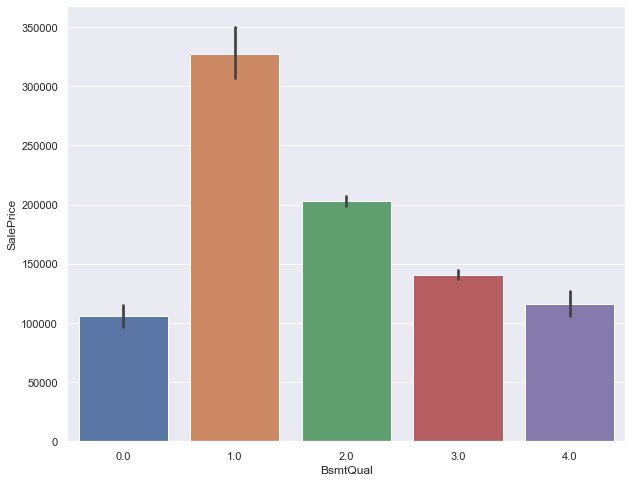

In [183]:
sns.barplot(df_train['BsmtQual'],df_train['SalePrice'])

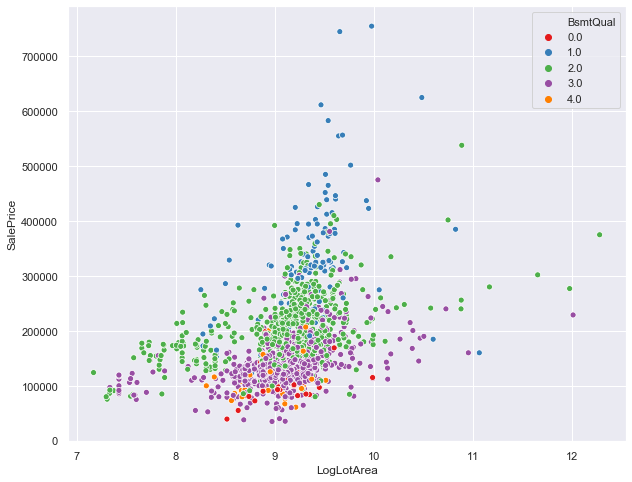

In [184]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue=df_train['BsmtQual'],palette='Set1')

## 31) BsmtCond: Evaluates the general condition of the basement

       Ex    Excellent = 1
       Gd    Good = 2
       TA    Typical - slight dampness allowed = 3
       Fa    Fair - dampness or some cracking or settling = 4
       Po    Poor - Severe cracking, settling, or wetness = 5
       NA    No Basement = 0

In [185]:
df_train['BsmtCond'].value_counts(dropna=False)

TA     1311
Gd       65
Fa       45
NaN      37
Po        2
Name: BsmtCond, dtype: int64

In [186]:
bc = {'Ex':1,'Gd':2,'TA':3,'Fa':4,'Po':5, 'NaN':0}
df_train['BsmtCond'] = df_train['BsmtCond'].map(bc)

In [187]:
df_train['BsmtCond'].value_counts(dropna=False)

3.0    1311
2.0      65
4.0      45
NaN      37
5.0       2
Name: BsmtCond, dtype: int64

In [188]:
df_train['BsmtCond'] = df_train['BsmtCond'].fillna(0)

In [189]:
df_train['BsmtCond'].value_counts(dropna=False)

3.0    1311
2.0      65
4.0      45
0.0      37
5.0       2
Name: BsmtCond, dtype: int64

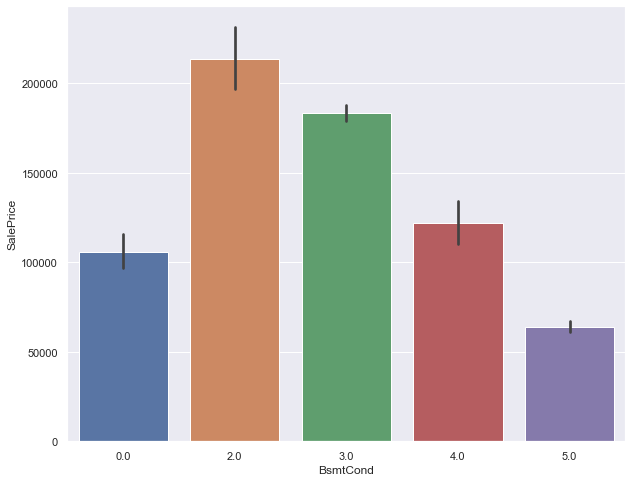

In [190]:
sns.barplot(df_train['BsmtCond'],df_train['SalePrice'])

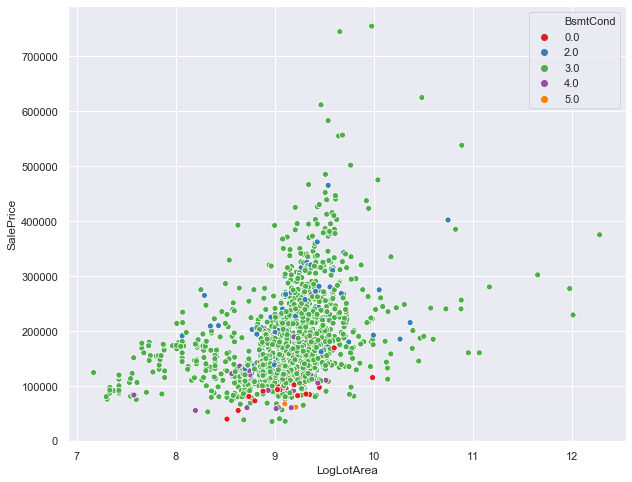

In [191]:

sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue=df_train['BsmtCond'],palette='Set1')

## 32) BsmtExposure: Refers to walkout or garden level walls

       Gd    Good Exposure = 2
       Av    Average Exposure (split levels or foyers typically score average or above) = 3    
       Mn    Mimimum Exposure = 4
       No    No Exposure = 1
       NA    No Basement = 0

In [192]:
df_train['BsmtExposure'].value_counts(dropna=False)

No     953
Av     221
Gd     134
Mn     114
NaN     38
Name: BsmtExposure, dtype: int64

In [193]:
be = {'NaN':0,'No':1,'Gd':2,'Av':3,'Mn':4}
df_train['BsmtExposure'] = df_train['BsmtExposure'].map(be)

In [194]:
df_train['BsmtExposure'].value_counts(dropna=False)

1.0    953
3.0    221
2.0    134
4.0    114
NaN     38
Name: BsmtExposure, dtype: int64

In [195]:
df_train['BsmtExposure'] = df_train['BsmtExposure'].fillna(0)

In [196]:
df_train['BsmtExposure'].value_counts(dropna=False)

1.0    953
3.0    221
2.0    134
4.0    114
0.0     38
Name: BsmtExposure, dtype: int64

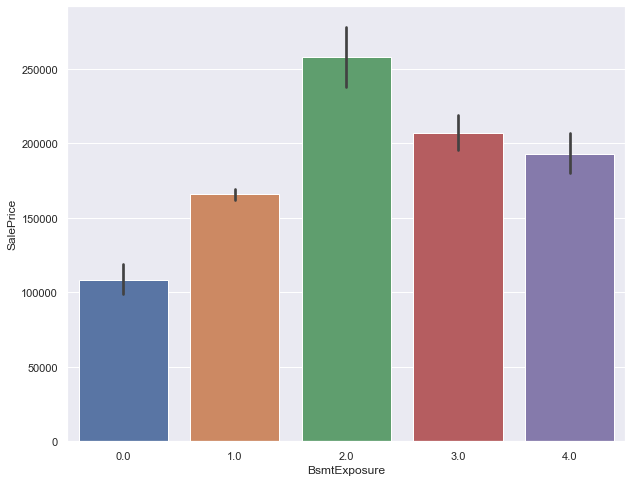

In [197]:
sns.barplot(df_train['BsmtExposure'],df_train['SalePrice'])

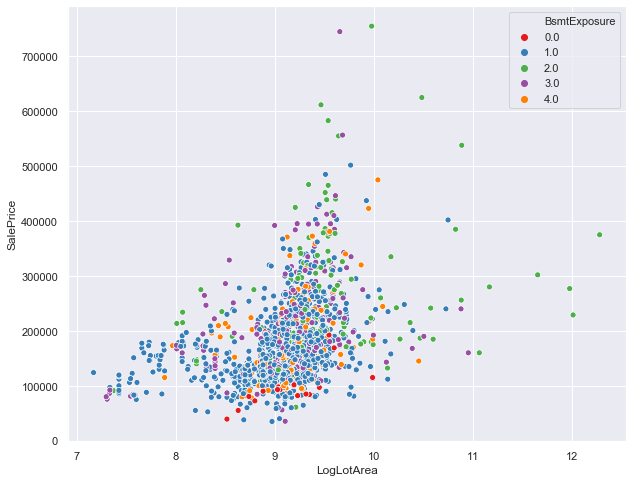

In [198]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue=df_train['BsmtExposure'],palette='Set1')

## 33) BsmtFinType1: Rating of basement finished area

       GLQ    Good Living Quarters = 1
       ALQ    Average Living Quarters = 2
       BLQ    Below Average Living Quarters = 3    
       Rec    Average Rec Room = 4
       LwQ    Low Quality = 5
       Unf    Unfinshed = 6
       NA    No Basement = 0

In [199]:
df_train['BsmtFinType1'].value_counts(dropna=False)

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
NaN     37
Name: BsmtFinType1, dtype: int64

In [200]:
bft = {'GLQ':1, 'ALQ':2, 'BLQ':3, 'Rec': 4,'LwQ':5, 'Unf': 6,'NaN':0}
df_train['BsmtFinType1'] = df_train['BsmtFinType1'].map(bft)

In [201]:
df_train['BsmtFinType1'] = df_train['BsmtFinType1'].fillna(0)

In [202]:
df_train['BsmtFinType1'].value_counts(dropna=False)

6.0    430
1.0    418
2.0    220
3.0    148
4.0    133
5.0     74
0.0     37
Name: BsmtFinType1, dtype: int64

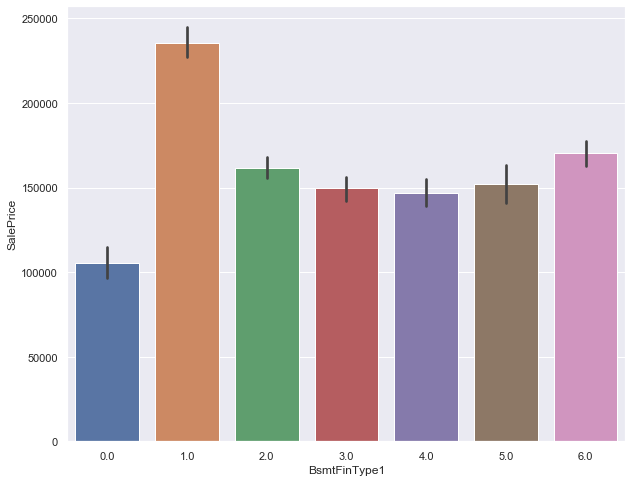

In [203]:
sns.barplot(df_train['BsmtFinType1'],df_train['SalePrice'])

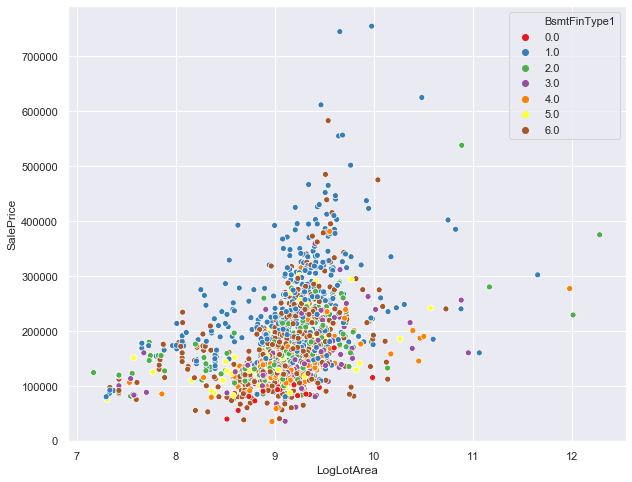

In [204]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue=df_train['BsmtFinType1'],palette='Set1')

## 34) BsmtFinSF1: Type 1 finished square feet

In [205]:
df_train['BsmtFinSF1'].value_counts(dropna=False)

0       467
24       12
16        9
20        5
686       5
       ... 
1032      1
1022      1
599       1
1018      1
1904      1
Name: BsmtFinSF1, Length: 637, dtype: int64

In [206]:
df_train['BsmtFinSF1'].describe()

count    1460.000000
mean      443.639726
std       456.098091
min         0.000000
25%         0.000000
50%       383.500000
75%       712.250000
max      5644.000000
Name: BsmtFinSF1, dtype: float64

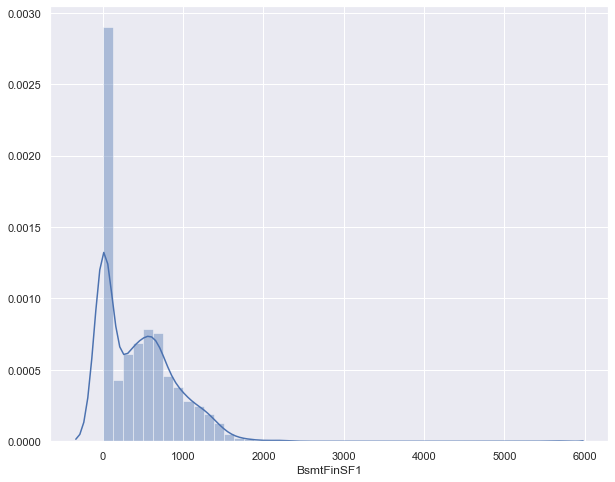

In [207]:
sns.distplot(df_train['BsmtFinSF1'],kde=True)

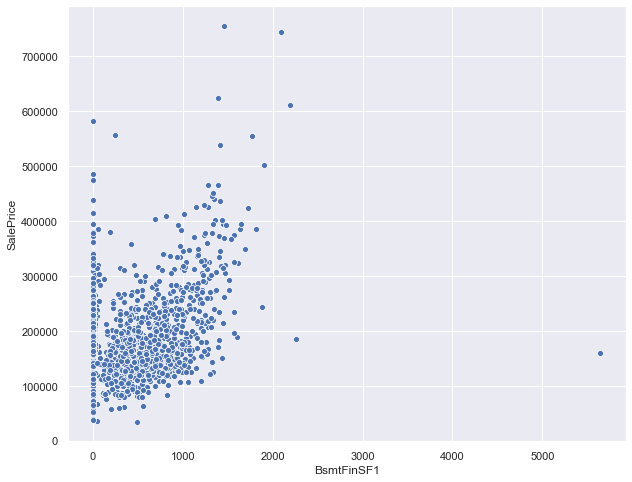

In [208]:
sns.scatterplot(df_train['BsmtFinSF1'],df_train['SalePrice'])

## 35) BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

In [209]:
df_train['BsmtFinType2'].value_counts(dropna=False)

Unf    1256
Rec      54
LwQ      46
NaN      38
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

In [210]:
bft2 = {'GLQ':1, 'ALQ':2, 'BLQ':3, 'Rec': 4,'LwQ':5, 'Unf': 6,'NaN':0}
df_train['BsmtFinType2'] = df_train['BsmtFinType2'].map(bft2)

In [211]:
df_train['BsmtFinType2'].value_counts(dropna=False)

6.0    1256
4.0      54
5.0      46
NaN      38
3.0      33
2.0      19
1.0      14
Name: BsmtFinType2, dtype: int64

In [212]:
df_train['BsmtFinType2'] = df_train['BsmtFinType2'].fillna(0)

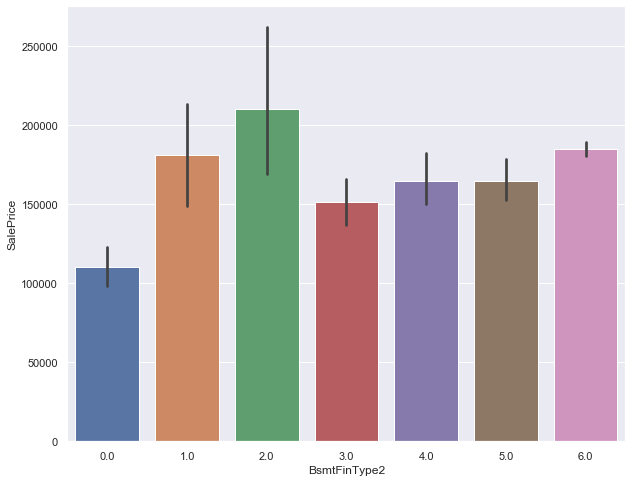

In [213]:
sns.barplot(df_train['BsmtFinType2'],df_train['SalePrice'])

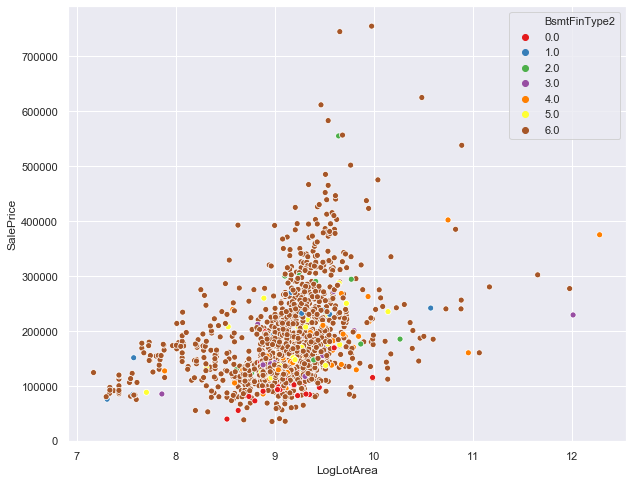

In [214]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'],hue=df_train['BsmtFinType2'],palette='Set1')

## 36) BsmtFinSF2: Type 2 finished square feet

In [215]:
df_train['BsmtFinSF2'].value_counts(dropna=False)

0       1293
180        5
374        3
551        2
93         2
        ... 
532        1
544        1
546        1
547        1
1474       1
Name: BsmtFinSF2, Length: 144, dtype: int64

In [216]:
df_train['BsmtFinSF2'].describe()

count    1460.000000
mean       46.549315
std       161.319273
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1474.000000
Name: BsmtFinSF2, dtype: float64

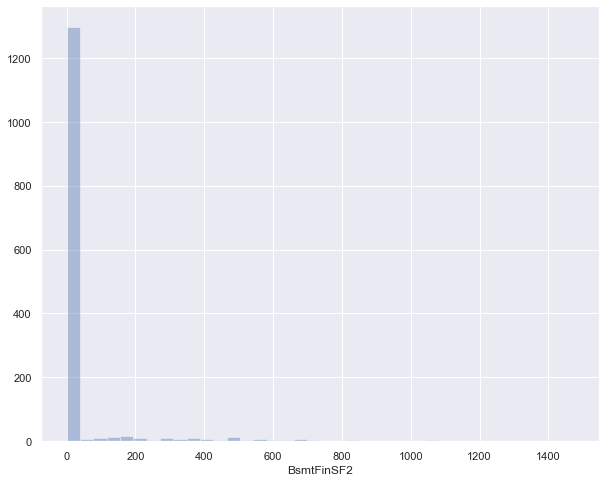

In [217]:
sns.distplot(df_train['BsmtFinSF2'],kde=False)

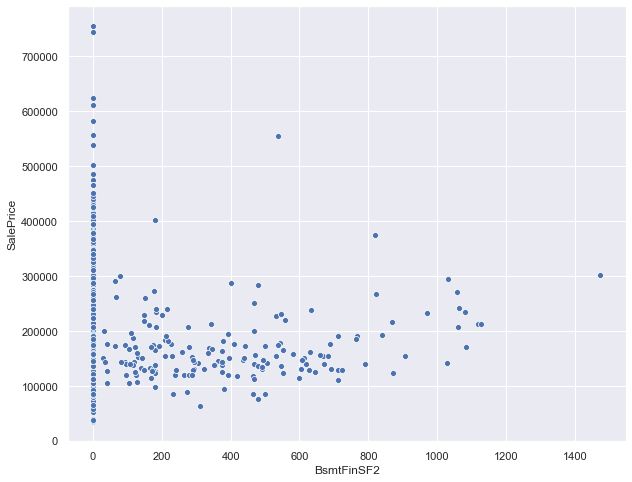

In [218]:
sns.scatterplot(df_train['BsmtFinSF2'],df_train['SalePrice'])

## 37) BsmtUnfSF: Unfinished square feet of basement area

In [219]:
df_train['BsmtUnfSF'].value_counts(dropna=False)

0       118
728       9
384       8
572       7
600       7
       ... 
731       1
730       1
726       1
725       1
2046      1
Name: BsmtUnfSF, Length: 780, dtype: int64

In [220]:
df_train['BsmtUnfSF'].describe()

count    1460.000000
mean      567.240411
std       441.866955
min         0.000000
25%       223.000000
50%       477.500000
75%       808.000000
max      2336.000000
Name: BsmtUnfSF, dtype: float64

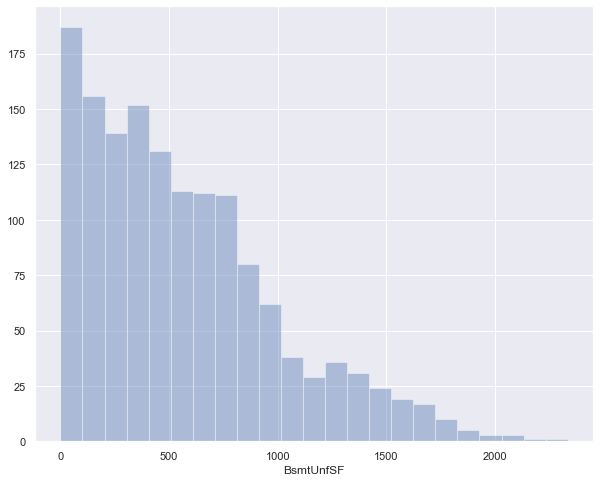

In [221]:
sns.distplot(df_train['BsmtUnfSF'],kde=False)

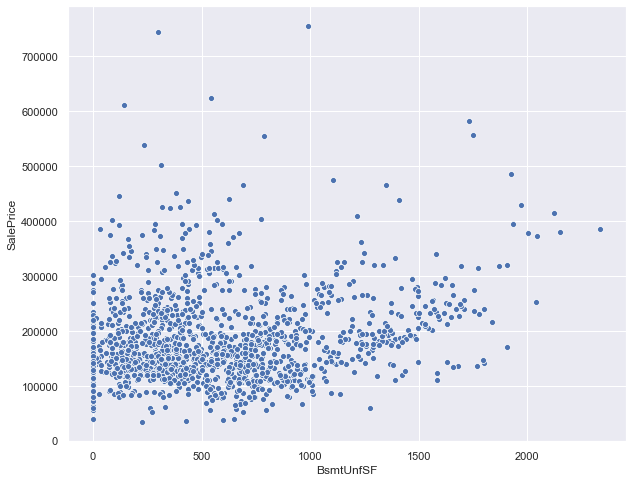

In [222]:
sns.scatterplot(df_train['BsmtUnfSF'],df_train['SalePrice'])

## 38) TotalBsmtSF: Total square feet of basement area

In [223]:
df_train['TotalBsmtSF'].value_counts(dropna=False)

0       37
864     35
672     17
912     15
1040    14
        ..
1463     1
1459     1
1454     1
1019     1
2046     1
Name: TotalBsmtSF, Length: 721, dtype: int64

In [224]:
df_train['TotalBsmtSF'].describe()

count    1460.000000
mean     1057.429452
std       438.705324
min         0.000000
25%       795.750000
50%       991.500000
75%      1298.250000
max      6110.000000
Name: TotalBsmtSF, dtype: float64

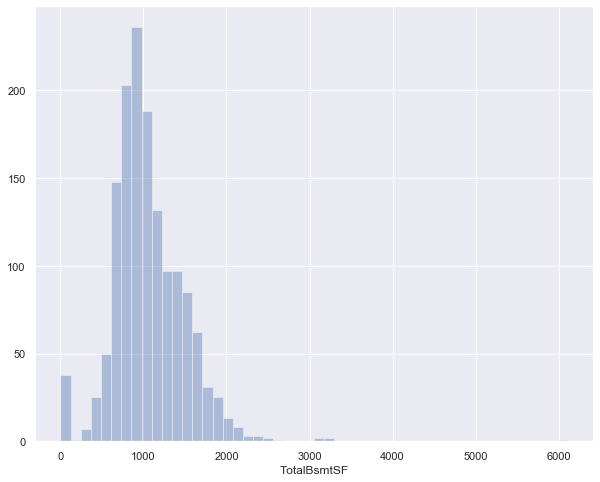

In [225]:
sns.distplot(df_train['TotalBsmtSF'],kde=False)

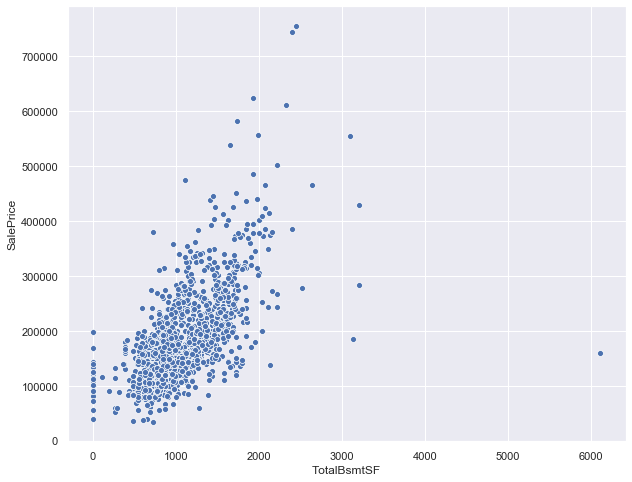

In [226]:
sns.scatterplot(df_train['TotalBsmtSF'],df_train['SalePrice'])

## 39) Heating: Type of heating

       Floor    Floor Furnace = 0
       GasA    Gas forced warm air furnace = 1
       GasW    Gas hot water or steam heat = 2
       Grav    Gravity furnace    = 3
       OthW    Hot water or steam heat other than gas = 4
       Wall    Wall furnace = 5

In [227]:
df_train['Heating'].value_counts(dropna=False)

GasA     1428
GasW       18
Grav        7
Wall        4
OthW        2
Floor       1
Name: Heating, dtype: int64

In [228]:
ht = {'Floor':0,'GasA':1,'GasW':2,'Grav':3,'OthW':4,'Wall':5}
df_train['Heating'] = df_train['Heating'].map(ht)

In [229]:
df_train['Heating'].value_counts(dropna=False)

1    1428
2      18
3       7
5       4
4       2
0       1
Name: Heating, dtype: int64

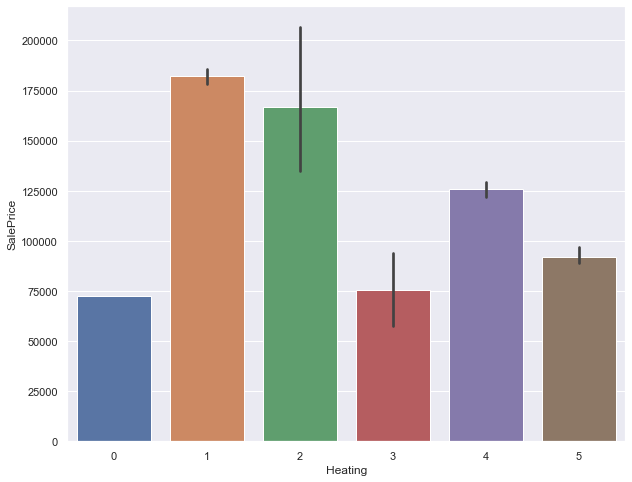

In [230]:
sns.barplot(df_train['Heating'],df_train['SalePrice'])

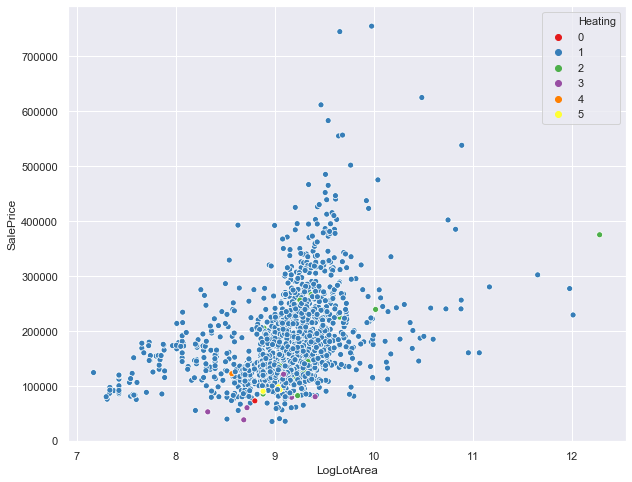

In [231]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['Heating'],palette = 'Set1')

## 40) HeatingQC: Heating quality and condition

       Ex    Excellent = 1
       Gd    Good = 2
       TA    Average/Typical = 3
       Fa    Fair = 4
       Po    Poor = 5

In [232]:
df_train['HeatingQC'].value_counts(dropna=False)

Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64

In [233]:
qc = {'Ex':1, 'Gd':2, 'TA':3, 'Fa':4, 'Po':5}
df_train['HeatingQC'] = df_train['HeatingQC'].map(qc)

In [234]:
df_train['HeatingQC'].value_counts(dropna=False)

1    741
3    428
2    241
4     49
5      1
Name: HeatingQC, dtype: int64

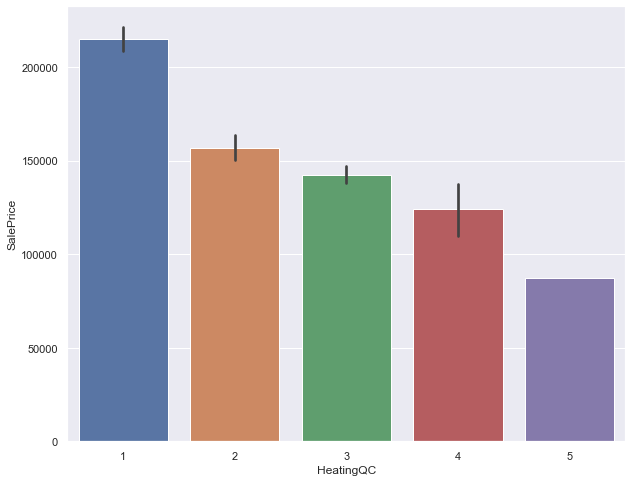

In [235]:
sns.barplot(df_train['HeatingQC'],df_train['SalePrice'])

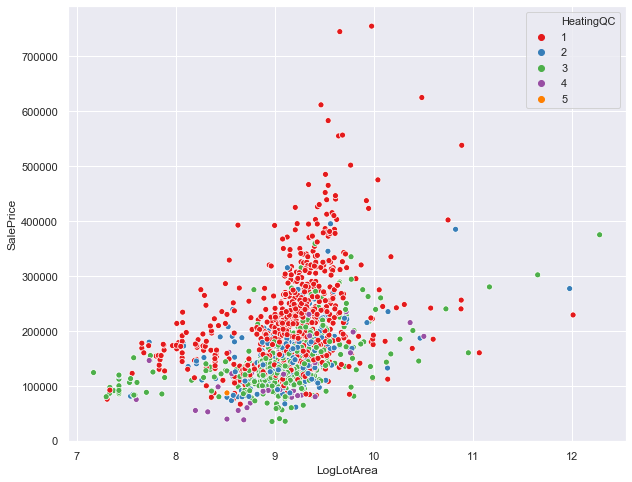

In [236]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['HeatingQC'],palette = 'Set1')

## 41) CentralAir: Central air conditioning

       N    No = 0
       Y    Yes = 1

In [237]:
df_train['CentralAir'].value_counts(dropna = False)

Y    1365
N      95
Name: CentralAir, dtype: int64

In [238]:
ca = {'N':0,'Y':1}
df_train['CentralAir'] = df_train['CentralAir'].map(ca)

In [239]:
df_train['CentralAir'].value_counts(dropna = False)

1    1365
0      95
Name: CentralAir, dtype: int64

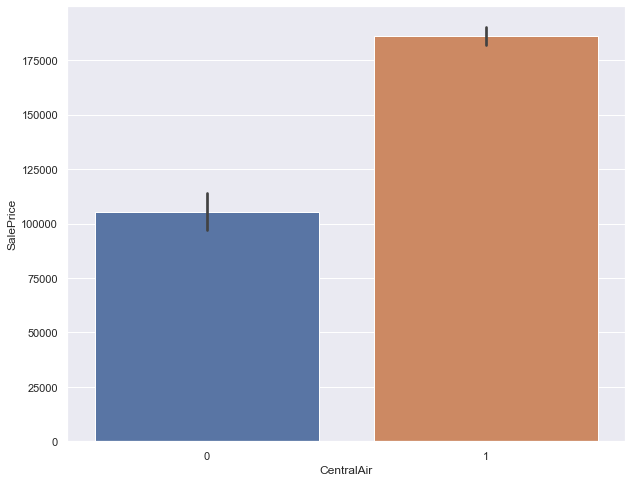

In [240]:
sns.barplot(df_train['CentralAir'],df_train['SalePrice'])

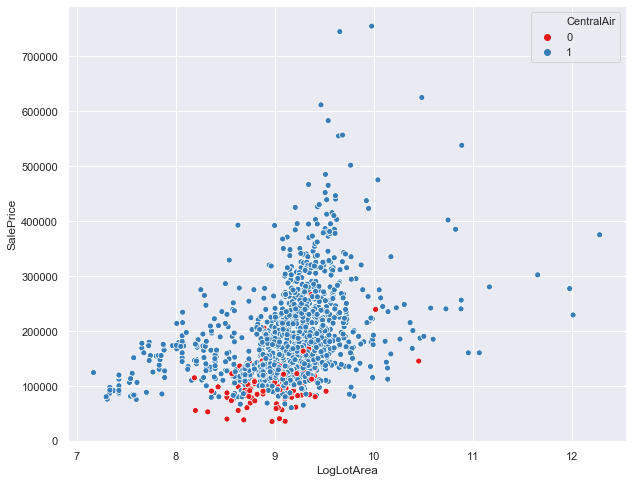

In [241]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['CentralAir'],palette = 'Set1')

## 42) Electrical: Electrical system

       SBrkr    Standard Circuit Breakers & Romex = 0
       FuseA    Fuse Box over 60 AMP and all Romex wiring (Average) = 1   
       FuseF    60 AMP Fuse Box and mostly Romex wiring (Fair) = 2
       FuseP    60 AMP Fuse Box and mostly knob & tube wiring (poor) = 3
       Mix    Mixed = 4

In [242]:
df_train['Electrical'].value_counts(dropna=False)

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
NaN         1
Name: Electrical, dtype: int64

In [243]:
el = {'SBrkr':0,'FuseA':1, 'FuseF':2, 'FuseP':3, 'Mix':4}
df_train['Electrical'] = df_train['Electrical'].map(el)

In [244]:
df_train['Electrical'].value_counts(dropna=False)

0.0    1334
1.0      94
2.0      27
3.0       3
NaN       1
4.0       1
Name: Electrical, dtype: int64

In [245]:
df_train['Electrical'].describe()

count    1459.000000
mean        0.110350
std         0.394782
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         4.000000
Name: Electrical, dtype: float64

In [246]:
df_train['Electrical'] = df_train['Electrical'].fillna(0)

In [247]:
df_train['Electrical'].value_counts(dropna=False)

0.0    1335
1.0      94
2.0      27
3.0       3
4.0       1
Name: Electrical, dtype: int64

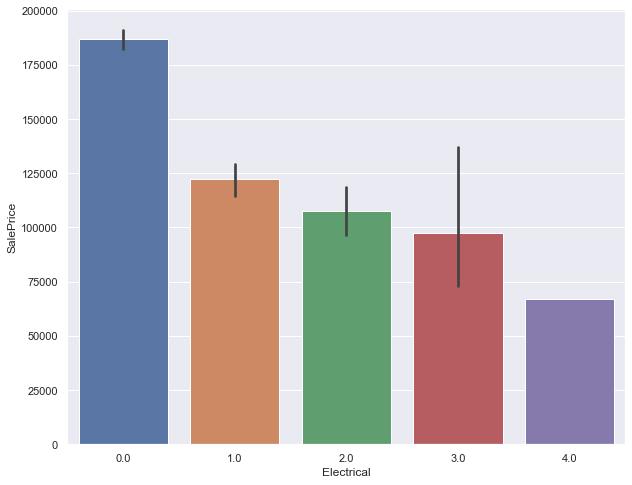

In [248]:
sns.barplot(df_train['Electrical'], df_train['SalePrice'])

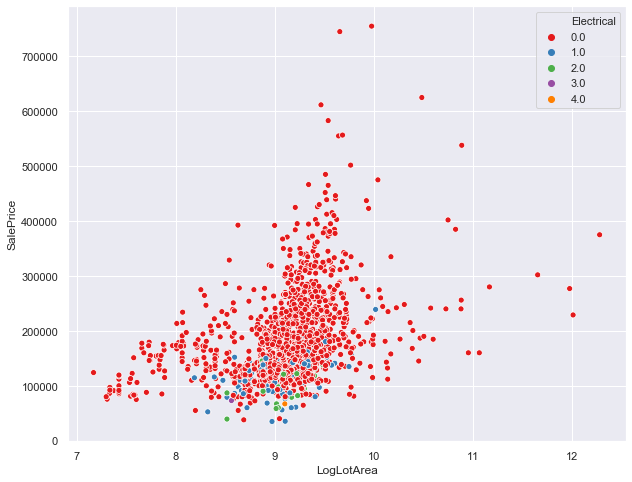

In [249]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['Electrical'],palette = 'Set1')

## 43) 1stFlrSF: First Floor square feet

In [250]:
df_train['1stFlrSF'].value_counts(dropna=False)

864     25
1040    16
912     14
848     12
894     12
        ..
1285     1
1287     1
1288     1
1297     1
2053     1
Name: 1stFlrSF, Length: 753, dtype: int64

In [251]:
df_train['1stFlrSF'].describe()

count    1460.000000
mean     1162.626712
std       386.587738
min       334.000000
25%       882.000000
50%      1087.000000
75%      1391.250000
max      4692.000000
Name: 1stFlrSF, dtype: float64

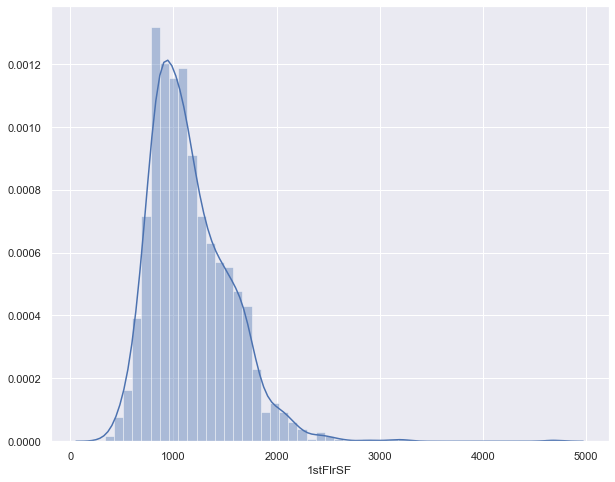

In [252]:
sns.distplot(df_train['1stFlrSF'])

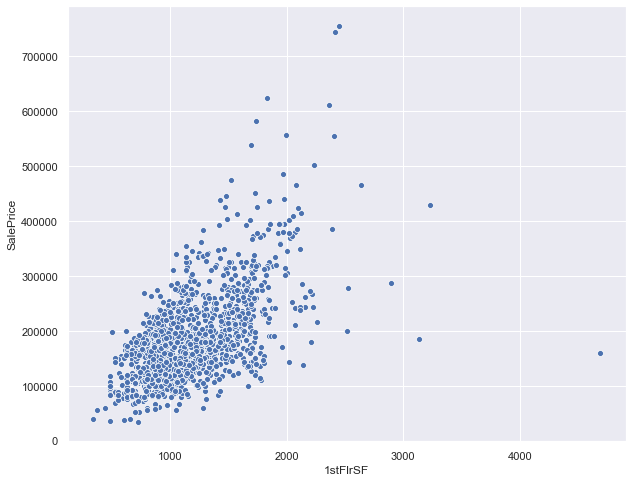

In [253]:
sns.scatterplot(df_train['1stFlrSF'],df_train['SalePrice'])

## 44) 2ndFlrSF: Second floor square feet

In [254]:
df_train['2ndFlrSF'].value_counts(dropna=False)

0       829
728      10
504       9
672       8
546       8
       ... 
788       1
1116      1
1112      1
1111      1
1872      1
Name: 2ndFlrSF, Length: 417, dtype: int64

In [255]:
df_train['2ndFlrSF'].describe()

count    1460.000000
mean      346.992466
std       436.528436
min         0.000000
25%         0.000000
50%         0.000000
75%       728.000000
max      2065.000000
Name: 2ndFlrSF, dtype: float64

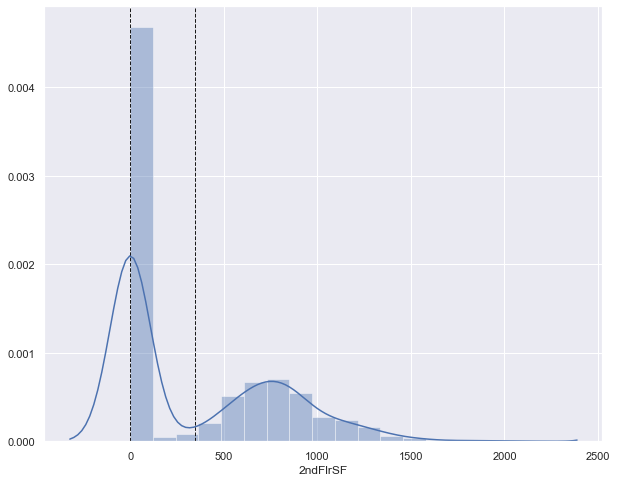

In [256]:
plt.axvline(df_train['2ndFlrSF'].mean(), color='k', linestyle='dashed', linewidth=1)
plt.axvline(df_train['2ndFlrSF'].median(), color='k', linestyle='dashed', linewidth=1)
sns.distplot(df_train['2ndFlrSF'])

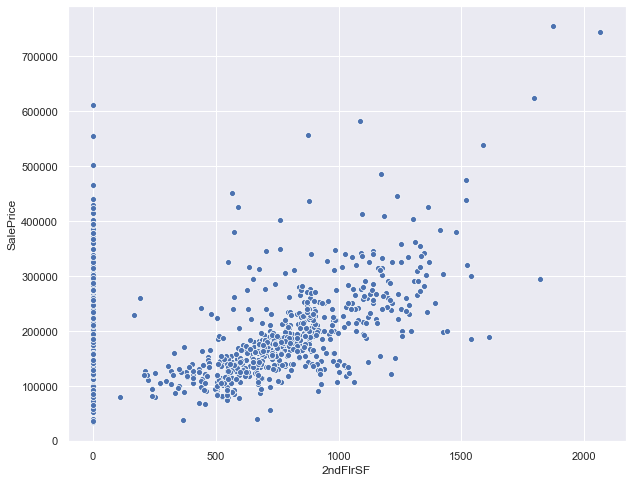

In [257]:
sns.scatterplot(df_train['2ndFlrSF'],df_train['SalePrice'])

## 45) LowQualFinSF: Low quality finished square feet (all floors)

In [258]:
df_train['LowQualFinSF'].value_counts(dropna=False)

0      1434
80        3
360       2
528       1
53        1
120       1
144       1
156       1
205       1
232       1
234       1
371       1
572       1
390       1
392       1
397       1
420       1
473       1
479       1
481       1
513       1
514       1
515       1
384       1
Name: LowQualFinSF, dtype: int64

In [259]:
df_train['LowQualFinSF'].describe()

count    1460.000000
mean        5.844521
std        48.623081
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       572.000000
Name: LowQualFinSF, dtype: float64

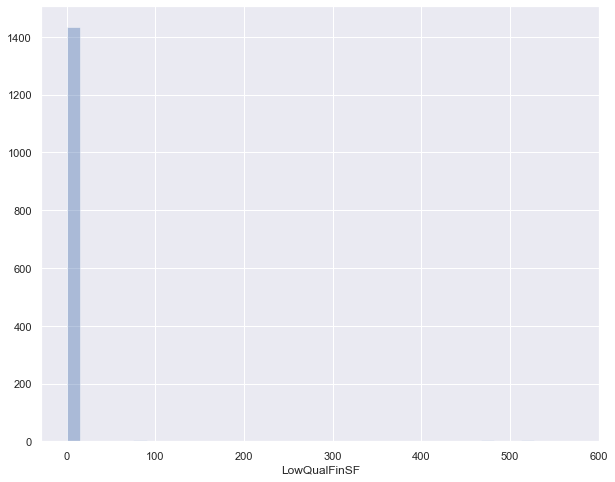

In [260]:
sns.distplot(df_train['LowQualFinSF'],kde=False)

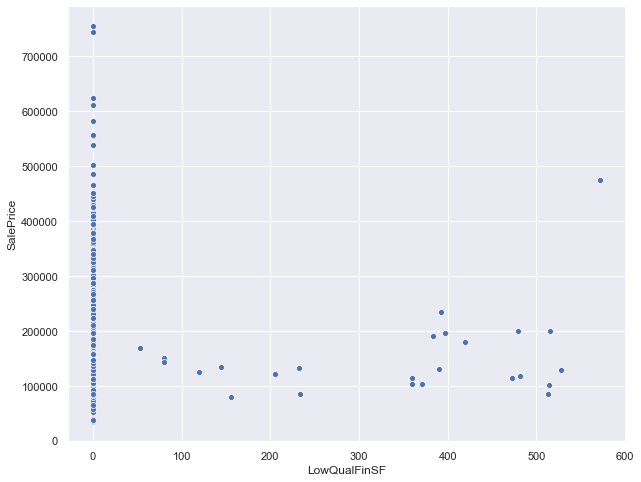

In [261]:
sns.scatterplot(df_train['LowQualFinSF'],df_train['SalePrice'])

## 46) GrLivArea: Above grade (ground) living area square feet

In [262]:
df_train['GrLivArea'].value_counts(dropna=False)

864     22
1040    14
894     11
848     10
1456    10
        ..
3447     1
1396     1
1395     1
1393     1
2054     1
Name: GrLivArea, Length: 861, dtype: int64

In [263]:
df_train['GrLivArea'].describe()

count    1460.000000
mean     1515.463699
std       525.480383
min       334.000000
25%      1129.500000
50%      1464.000000
75%      1776.750000
max      5642.000000
Name: GrLivArea, dtype: float64

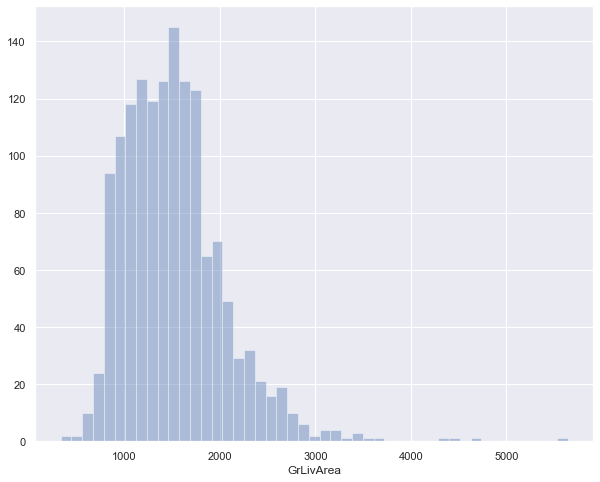

In [264]:
sns.distplot(df_train['GrLivArea'],kde = False)

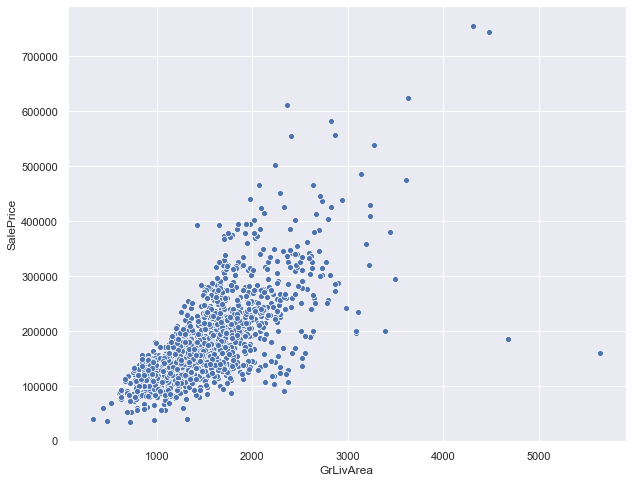

In [265]:
sns.scatterplot(df_train['GrLivArea'], df_train['SalePrice'])

## 47) BsmtFullBath: Basement full bathrooms

In [266]:
df_train['BsmtFullBath'].value_counts(dropna=False)

0    856
1    588
2     15
3      1
Name: BsmtFullBath, dtype: int64

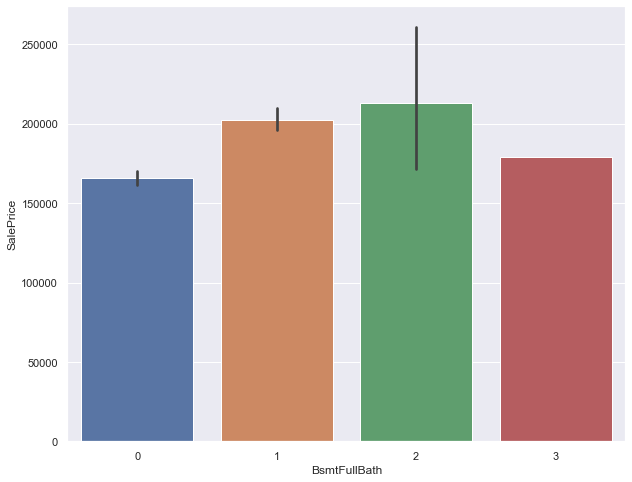

In [267]:
sns.barplot(df_train['BsmtFullBath'],df_train['SalePrice'])

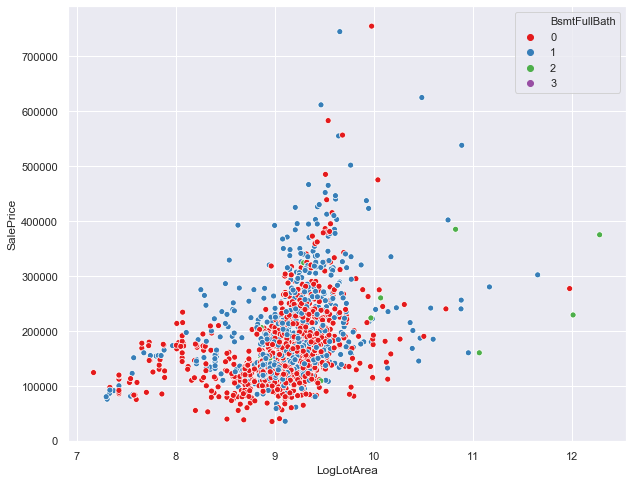

In [268]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['BsmtFullBath'],palette = 'Set1')

## 48) BsmtHalfBath: Basement half bathrooms

In [269]:
df_train['BsmtHalfBath'].value_counts(dropna=False)

0    1378
1      80
2       2
Name: BsmtHalfBath, dtype: int64

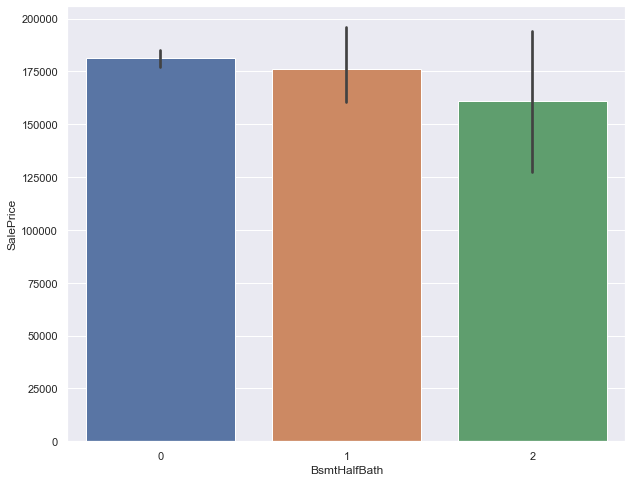

In [270]:
sns.barplot(df_train['BsmtHalfBath'],df_train['SalePrice'])

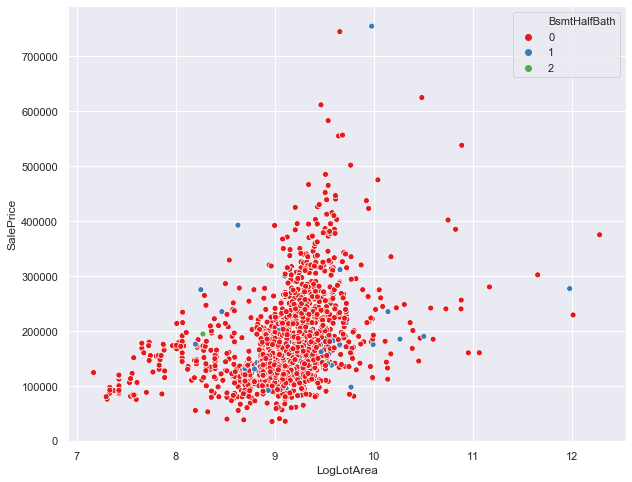

In [271]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['BsmtHalfBath'],palette = 'Set1')

## 49) HalfBath: Half baths above grade

In [272]:
df_train['HalfBath'].value_counts(dropna=False)

0    913
1    535
2     12
Name: HalfBath, dtype: int64

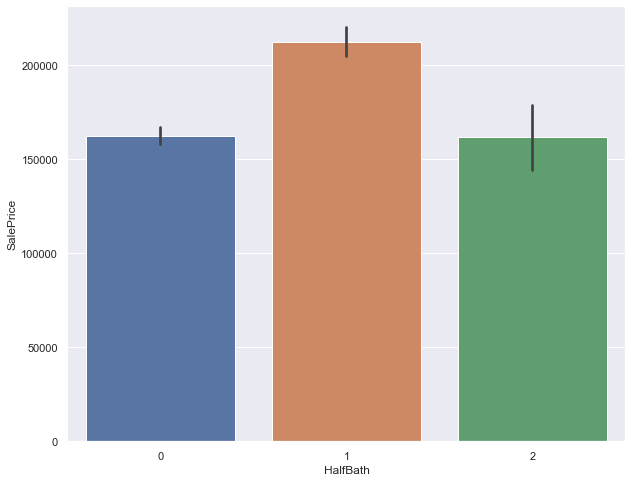

In [273]:
sns.barplot(df_train['HalfBath'],df_train['SalePrice'])

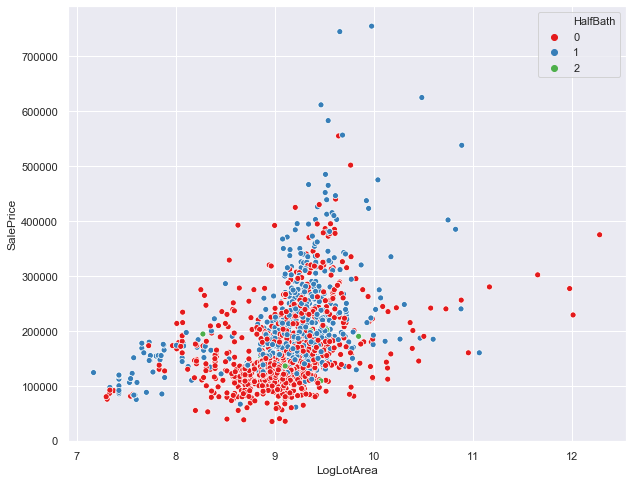

In [274]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['HalfBath'],palette = 'Set1')

## 50) FullBath: Full bathrooms above grade

In [275]:
df_train['FullBath'].value_counts(dropna=False)

2    768
1    650
3     33
0      9
Name: FullBath, dtype: int64

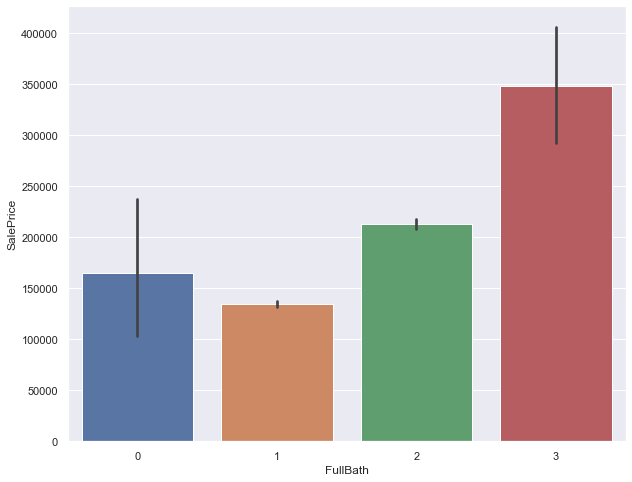

In [276]:
sns.barplot(df_train['FullBath'],df_train['SalePrice'])

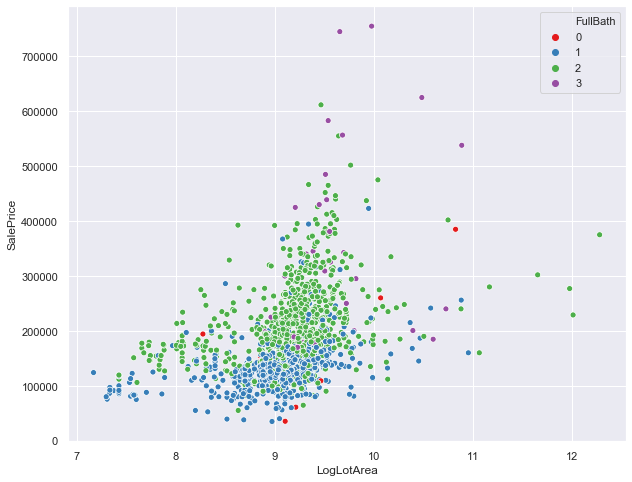

In [277]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['FullBath'],palette = 'Set1')

## 51) Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

In [278]:
df_train['BedroomAbvGr'].value_counts(dropna=False)

3    804
2    358
4    213
1     50
5     21
6      7
0      6
8      1
Name: BedroomAbvGr, dtype: int64

In [279]:
df_train['BedroomAbvGr'].describe()

count    1460.000000
mean        2.866438
std         0.815778
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         8.000000
Name: BedroomAbvGr, dtype: float64

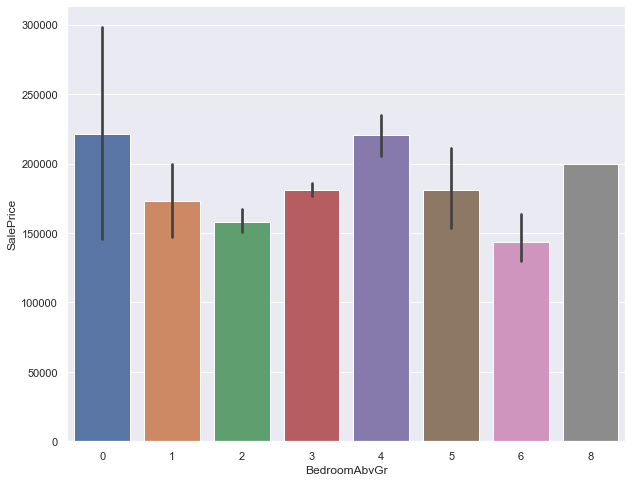

In [280]:
sns.barplot(df_train['BedroomAbvGr'],df_train['SalePrice'])

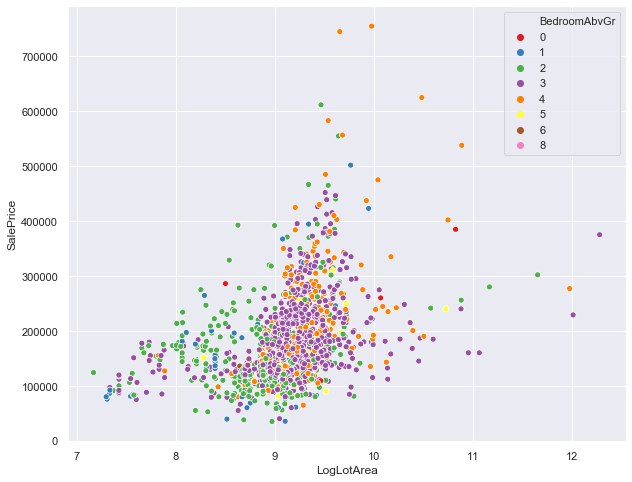

In [281]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['BedroomAbvGr'],palette = 'Set1')

## 52) Kitchen: Kitchens above grade

In [282]:
df_train['KitchenAbvGr'].value_counts(dropna=False)

1    1392
2      65
3       2
0       1
Name: KitchenAbvGr, dtype: int64

In [283]:
df_train['KitchenAbvGr'].describe()

count    1460.000000
mean        1.046575
std         0.220338
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: KitchenAbvGr, dtype: float64

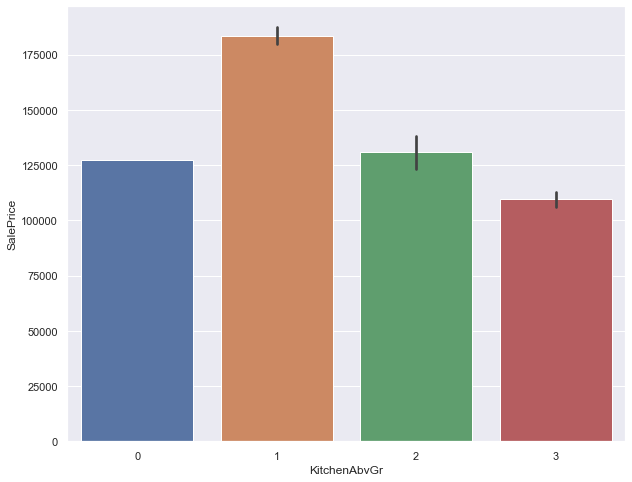

In [284]:
sns.barplot(df_train['KitchenAbvGr'],df_train['SalePrice'])

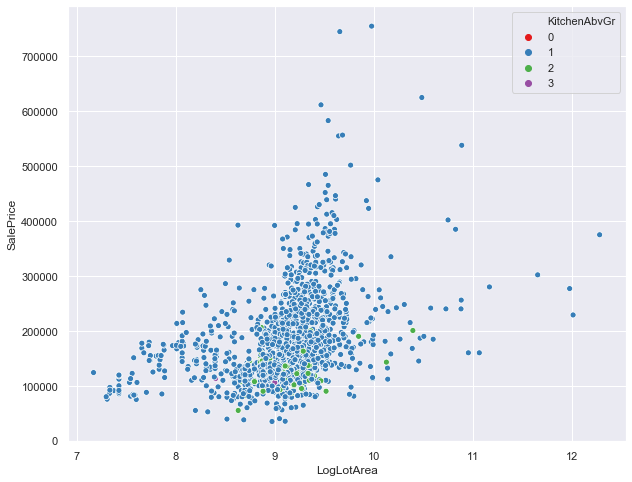

In [285]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['KitchenAbvGr'],palette = 'Set1')

## 53) KitchenQual: Kitchen quality

       Ex    Excellent = 0
       Gd    Good = 1
       TA    Typical/Average = 2
       Fa    Fair = 3
       Po    Poor = 4

In [286]:
df_train['KitchenQual'].value_counts(dropna=False)

TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dtype: int64

In [287]:
kq = {'Ex':0,'Gd':1,'TA':2,'Fa':3,'Po':4}
df_train['KitchenQual'] = df_train['KitchenQual'].map(kq)

In [288]:
df_train['KitchenQual'].value_counts(dropna=False)

2    735
1    586
0    100
3     39
Name: KitchenQual, dtype: int64

In [289]:
df_train['KitchenQual'].describe()

count    1460.000000
mean        1.488356
std         0.663760
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: KitchenQual, dtype: float64

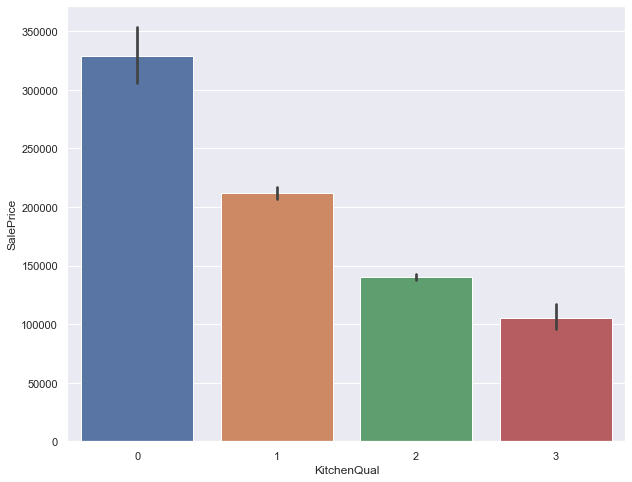

In [290]:
sns.barplot(df_train['KitchenQual'],df_train['SalePrice'])

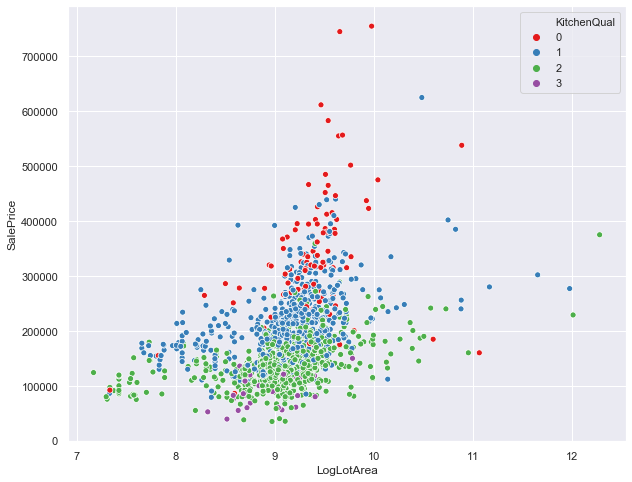

In [291]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['KitchenQual'],palette = 'Set1')

## 54) TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

In [292]:
df_train['TotRmsAbvGrd'].value_counts(dropna=False)

6     402
7     329
5     275
8     187
4      97
9      75
10     47
11     18
3      17
12     11
14      1
2       1
Name: TotRmsAbvGrd, dtype: int64

In [293]:
df_train['TotRmsAbvGrd'].describe()

count    1460.000000
mean        6.517808
std         1.625393
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        14.000000
Name: TotRmsAbvGrd, dtype: float64

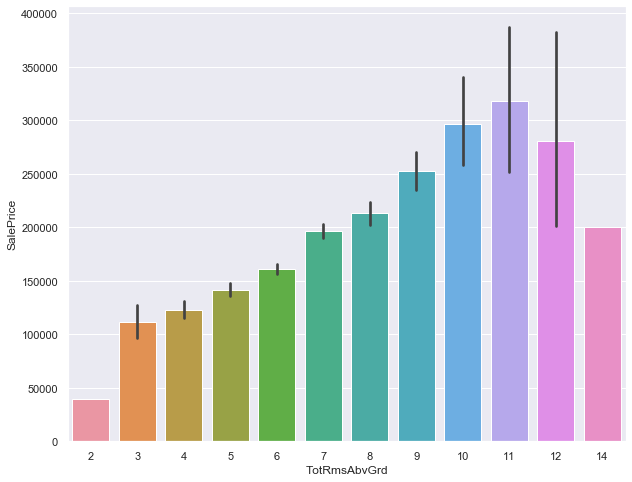

In [294]:
sns.barplot(df_train['TotRmsAbvGrd'],df_train['SalePrice'])

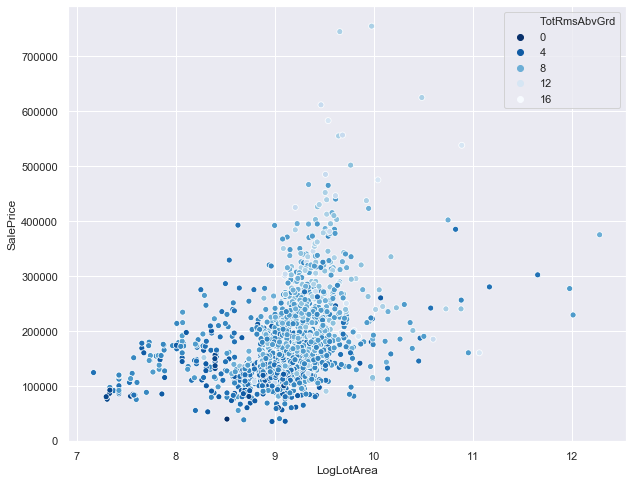

In [295]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['TotRmsAbvGrd'],palette = 'Blues_r')

## 55) Functional: Home functionality (Assume typical unless deductions are warranted)

       Typ	Typical Functionality = 0
       Min1	Minor Deductions 1 = 1
       Min2	Minor Deductions 2 = 2
       Mod	Moderate Deductions = 3
       Maj1	Major Deductions 1 = 4
       Maj2	Major Deductions 2 = 5
       Sev	Severely Damaged = 6
       Sal	Salvage only = 7
		


In [296]:
df_train['Functional'].value_counts(dropna=False)

Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: Functional, dtype: int64

In [297]:
fun = {'Typ':0,'Min1':1,'Min2':2,'Mod':3,'Maj1':4, 'Maj2':5,'Sev':6,'Sal':7}
df_train['Functional'] = df_train['Functional'].map(fun)

In [298]:
df_train['Functional'].value_counts(dropna=False)

0    1360
2      34
1      31
3      15
4      14
5       5
6       1
Name: Functional, dtype: int64

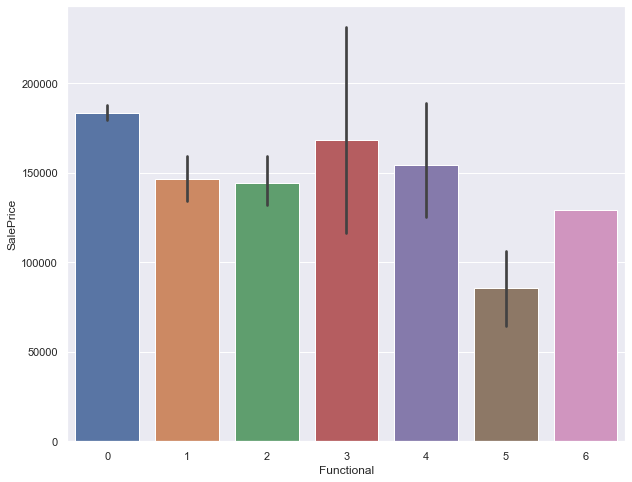

In [299]:
sns.barplot(df_train['Functional'], df_train['SalePrice'])

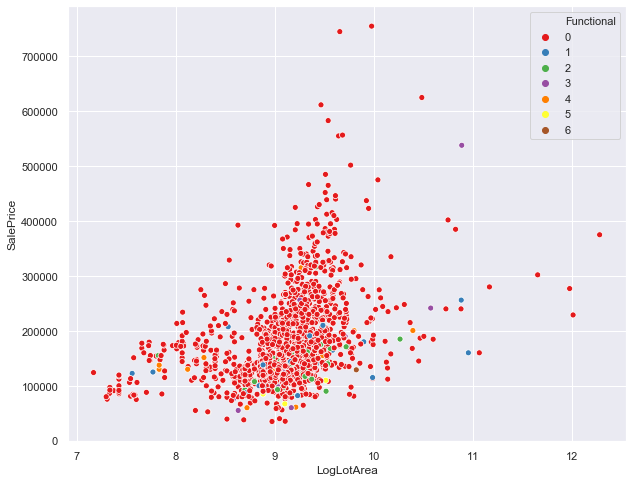

In [300]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['Functional'],palette = 'Set1')

## 56) Fireplaces: Number of fireplaces

In [301]:
df_train['Fireplaces'].value_counts(dropna=False)

0    690
1    650
2    115
3      5
Name: Fireplaces, dtype: int64

In [302]:
df_train['Fireplaces'].describe()

count    1460.000000
mean        0.613014
std         0.644666
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: Fireplaces, dtype: float64

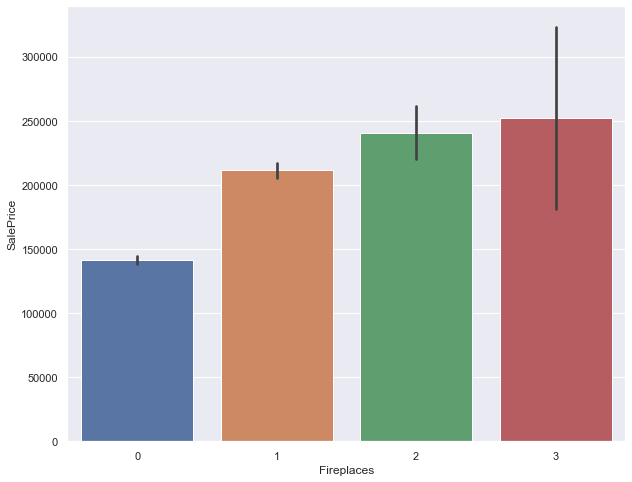

In [303]:
sns.barplot(df_train['Fireplaces'],df_train['SalePrice'])

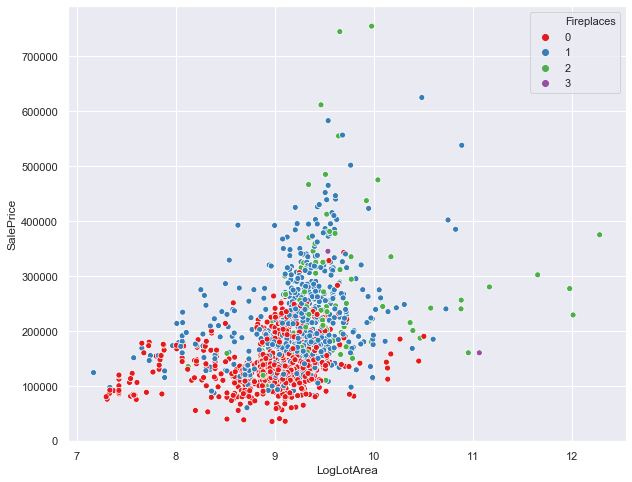

In [304]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['Fireplaces'],palette = 'Set1')

## 57) FireplaceQu: Fireplace quality

       Ex    Excellent - Exceptional Masonry Fireplace = 0
       Gd    Good - Masonry Fireplace in main level = 1
       TA    Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement = 2
       Fa    Fair - Prefabricated Fireplace in basement = 3
       Po    Poor - Ben Franklin Stove = 4
       NA    No Fireplace = 5

In [305]:
df_train['FireplaceQu'].value_counts(dropna=False)

NaN    690
Gd     380
TA     313
Fa      33
Ex      24
Po      20
Name: FireplaceQu, dtype: int64

In [306]:
fpq = {'NaN':5,'Ex':1,'Gd':2, 'TA':3, 'Fa':4,'Po':6} 
df_train['FireplaceQu'] = df_train['FireplaceQu'].map(fpq)

In [307]:
df_train['FireplaceQu'].value_counts(dropna=False)

NaN    690
2.0    380
3.0    313
4.0     33
1.0     24
6.0     20
Name: FireplaceQu, dtype: int64

In [308]:
df_train['FireplaceQu'] = df_train['FireplaceQu'].fillna(5)

In [309]:
df_train['FireplaceQu'].value_counts(dropna=False)

5.0    690
2.0    380
3.0    313
4.0     33
1.0     24
6.0     20
Name: FireplaceQu, dtype: int64

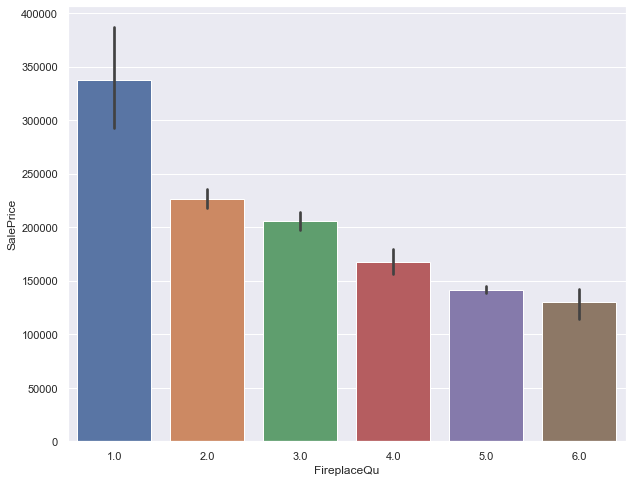

In [310]:
sns.barplot(df_train['FireplaceQu'],df_train['SalePrice'])

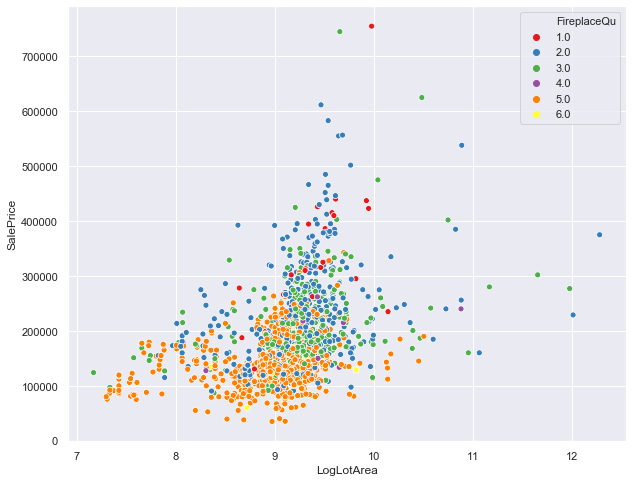

In [311]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['FireplaceQu'],palette = 'Set1')

## 58) GarageType: Garage location

       2Types    More than one type of garage = 0
       Attchd    Attached to home = 1
       Basment    Basement Garage = 2
       BuiltIn    Built-In (Garage part of house - typically has room above garage) = 3
       CarPort    Car Port = 4
       Detchd    Detached from home = 5
       NA    No Garage = 6

In [312]:
df_train['GarageType'].value_counts(dropna=False)

Attchd     870
Detchd     387
BuiltIn     88
NaN         81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [313]:
gt = {'2Types':0,'Attchd':1,'Basment':2,'BuiltIn':3,'CarPort':4,'Detchd':5, 'NaN':6}
df_train['GarageType'] = df_train['GarageType'].map(gt)

In [314]:
df_train['GarageType'].value_counts(dropna=False)

1.0    870
5.0    387
3.0     88
NaN     81
2.0     19
4.0      9
0.0      6
Name: GarageType, dtype: int64

In [315]:
df_train['GarageType'] = df_train['GarageType'].fillna(6)

In [316]:
df_train['GarageType'].value_counts(dropna=False)

1.0    870
5.0    387
3.0     88
6.0     81
2.0     19
4.0      9
0.0      6
Name: GarageType, dtype: int64

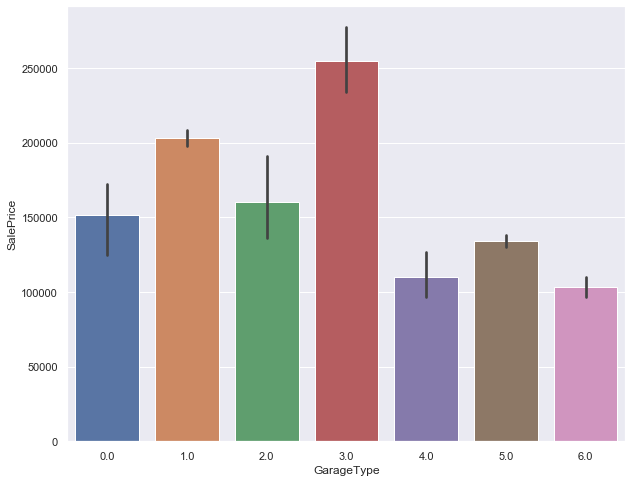

In [317]:
sns.barplot(df_train['GarageType'],df_train['SalePrice'])

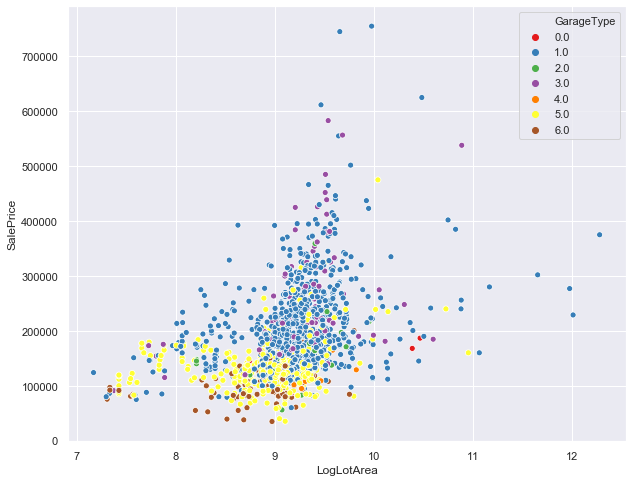

In [318]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['GarageType'],palette = 'Set1')

## 59) GarageYrBlt: Year garage was built

In [319]:
df_train['GarageYrBlt'].value_counts(dropna=False)

NaN       81
2005.0    65
2006.0    59
2004.0    53
2003.0    50
          ..
1906.0     1
1927.0     1
1900.0     1
1908.0     1
1933.0     1
Name: GarageYrBlt, Length: 98, dtype: int64

In [320]:
df_train['GarageYrBlt'].describe()

count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64

In [321]:
df_train['GarageYrBlt']=df_train['GarageYrBlt'].fillna(1980)

In [322]:
df_train[df_train['GarageType']==6]['GarageYrBlt']

39      1980.0
48      1980.0
78      1980.0
88      1980.0
89      1980.0
         ...  
1349    1980.0
1407    1980.0
1449    1980.0
1450    1980.0
1453    1980.0
Name: GarageYrBlt, Length: 81, dtype: float64

In [323]:
df_train['GarageYrBlt'].value_counts(dropna=False)

1980.0    96
2005.0    65
2006.0    59
2004.0    53
2003.0    50
          ..
1900.0     1
1906.0     1
1933.0     1
1908.0     1
1927.0     1
Name: GarageYrBlt, Length: 97, dtype: int64

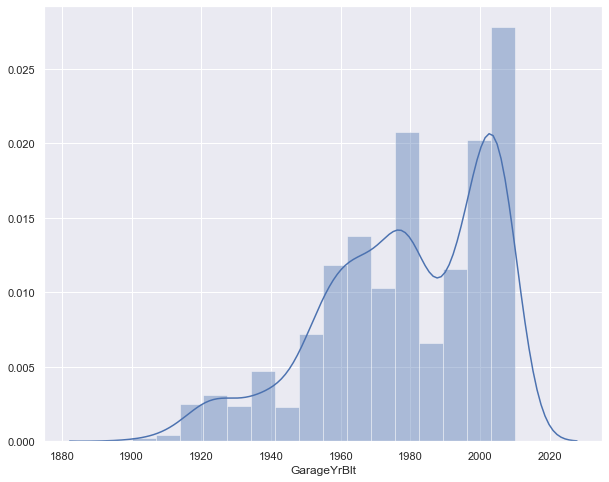

In [324]:
sns.distplot(df_train['GarageYrBlt'])

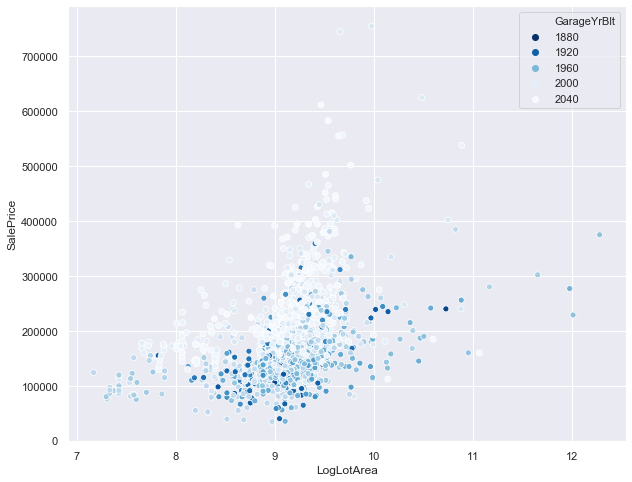

In [325]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['GarageYrBlt'],palette = 'Blues_r')

## 60) GarageFinish: Interior finish of the garage

       Fin    Finished = 1
       RFn    Rough Finished = 2    
       Unf    Unfinished = 3
       NA    No Garage = 0

In [326]:
df_train['GarageFinish'].value_counts(dropna=False)

Unf    605
RFn    422
Fin    352
NaN     81
Name: GarageFinish, dtype: int64

In [327]:
gf = {'Fin':1, 'RFn':2, 'Unf':3,'NaN':0}
df_train['GarageFinish']=df_train['GarageFinish'].map(gf)

In [328]:
df_train['GarageFinish'].value_counts(dropna=False)

3.0    605
2.0    422
1.0    352
NaN     81
Name: GarageFinish, dtype: int64

In [329]:
df_train['GarageFinish']=df_train['GarageFinish'].fillna(0)

In [330]:
df_train['GarageFinish'].value_counts(dropna=False)

3.0    605
2.0    422
1.0    352
0.0     81
Name: GarageFinish, dtype: int64

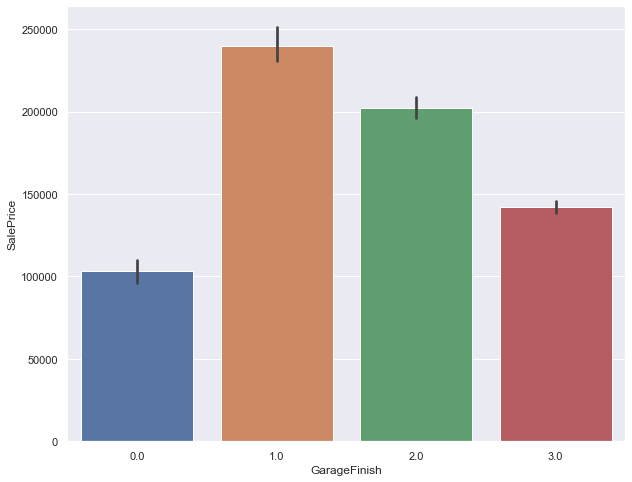

In [331]:
sns.barplot(df_train['GarageFinish'],df_train['SalePrice'])

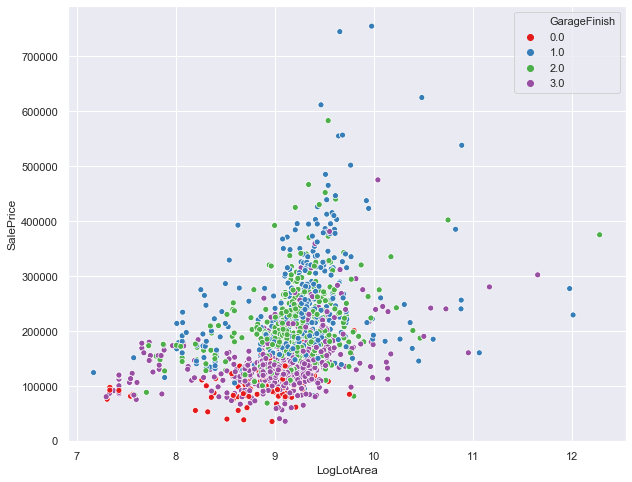

In [332]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['GarageFinish'],palette = 'Set1')

## 61) GarageCars: Size of garage in car capacity

In [333]:
df_train['GarageCars'].value_counts(dropna=False)

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64

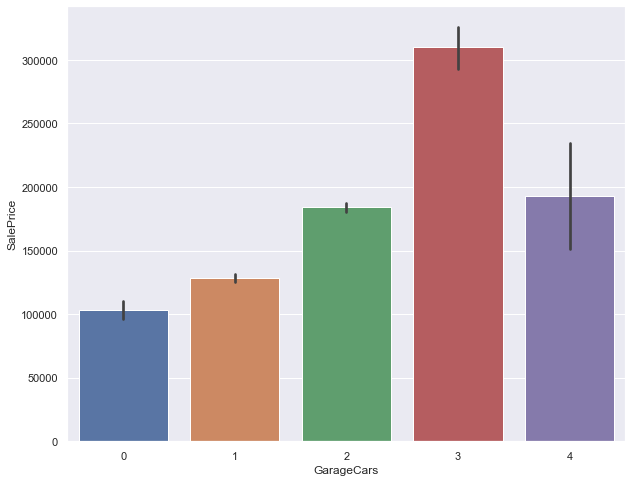

In [334]:
sns.barplot(df_train['GarageCars'], df_train['SalePrice'])

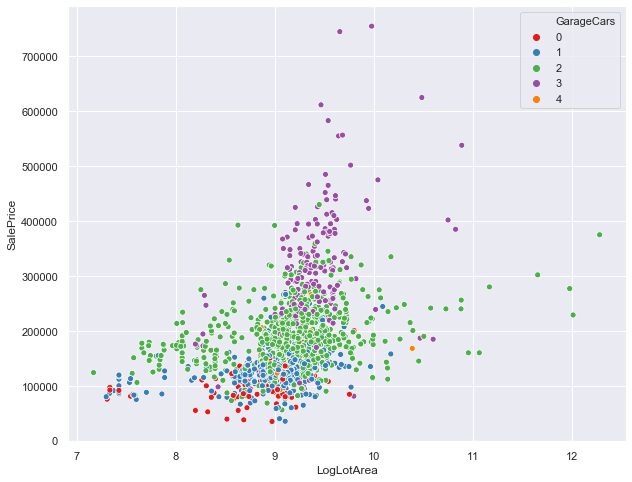

In [335]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['GarageCars'],palette = 'Set1')

## 62) GarageArea: Size of garage in square feet

In [336]:
df_train['GarageArea'].value_counts(dropna=False)

0       81
440     49
576     47
240     38
484     34
        ..
754      1
459      1
458      1
756      1
1418     1
Name: GarageArea, Length: 441, dtype: int64

In [337]:
df_train['GarageArea'].describe()

count    1460.000000
mean      472.980137
std       213.804841
min         0.000000
25%       334.500000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64

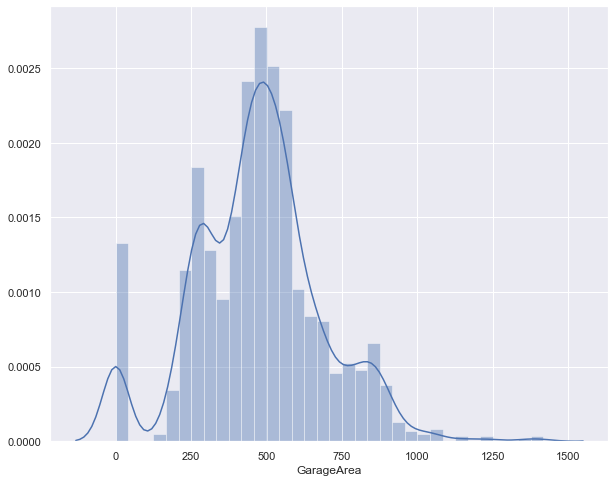

In [338]:
sns.distplot(df_train['GarageArea'])

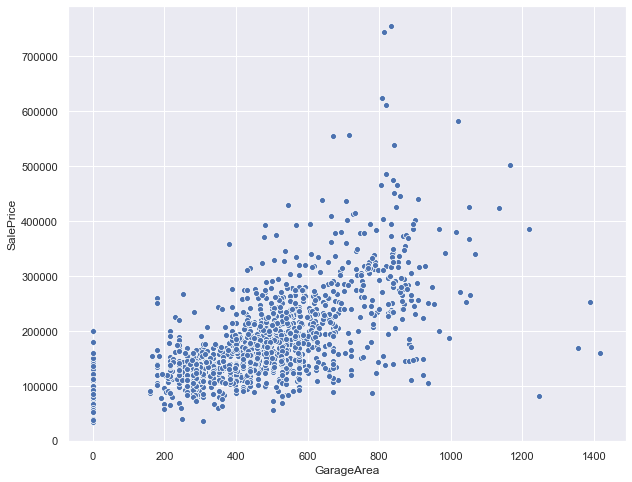

In [339]:
sns.scatterplot(df_train['GarageArea'],df_train['SalePrice'])

## 63) GarageQual: Garage quality
    
      Ex	Excellent = 1
      Gd	Good = 2
      TA	Typical/Average = 3
      Fa	Fair = 4
      Po	Poor = 5
      NA	No Garage = 0

In [340]:
df_train['GarageQual'].value_counts(dropna=False)

TA     1311
NaN      81
Fa       48
Gd       14
Ex        3
Po        3
Name: GarageQual, dtype: int64

In [341]:
gq = {'NaN':0,'Ex':1,'Gd':2,'TA':3,'Fa':4,'Po':5}
df_train['GarageQual'] = df_train['GarageQual'].map(gq)

In [342]:
df_train['GarageQual'].value_counts(dropna=False)

3.0    1311
NaN      81
4.0      48
2.0      14
5.0       3
1.0       3
Name: GarageQual, dtype: int64

In [343]:
df_train['GarageQual'] = df_train['GarageQual'].fillna(0)

In [344]:
df_train['GarageQual'].value_counts(dropna=False)

3.0    1311
0.0      81
4.0      48
2.0      14
5.0       3
1.0       3
Name: GarageQual, dtype: int64

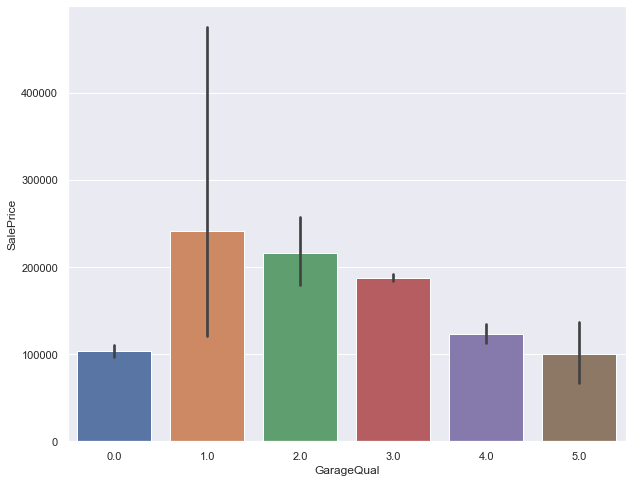

In [345]:
sns.barplot(df_train['GarageQual'],df_train['SalePrice'])

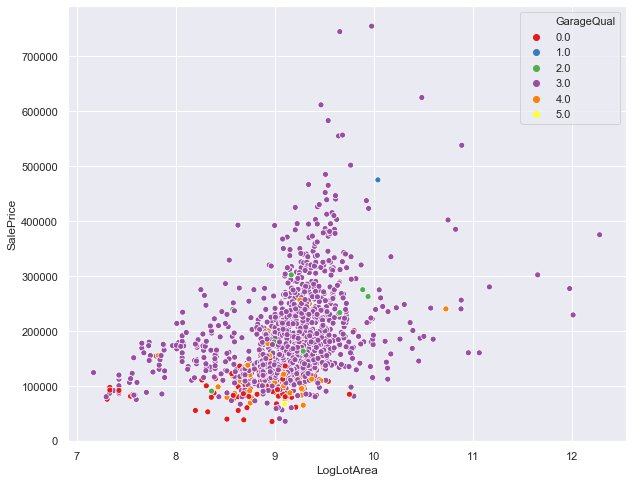

In [346]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['GarageQual'],palette = 'Set1')

## 64) GarageCond: Garage condition

       Ex    Excellent = 1
       Gd    Good = 2
       TA    Typical/Average = 3
       Fa    Fair = 4
       Po    Poor = 5
       NA    No Garage = 0

In [347]:
df_train['GarageCond'].value_counts(dropna=False)

TA     1326
NaN      81
Fa       35
Gd        9
Po        7
Ex        2
Name: GarageCond, dtype: int64

In [348]:
gc = {'NaN':0,'Ex':1,'Gd':2,'TA':3,'Fa':4,'Po':5}
df_train['GarageCond'] = df_train['GarageCond'].map(gc)

In [349]:
df_train['GarageCond'] = df_train['GarageCond'].fillna(0)

In [350]:
df_train['GarageCond'].value_counts(dropna=False)

3.0    1326
0.0      81
4.0      35
2.0       9
5.0       7
1.0       2
Name: GarageCond, dtype: int64

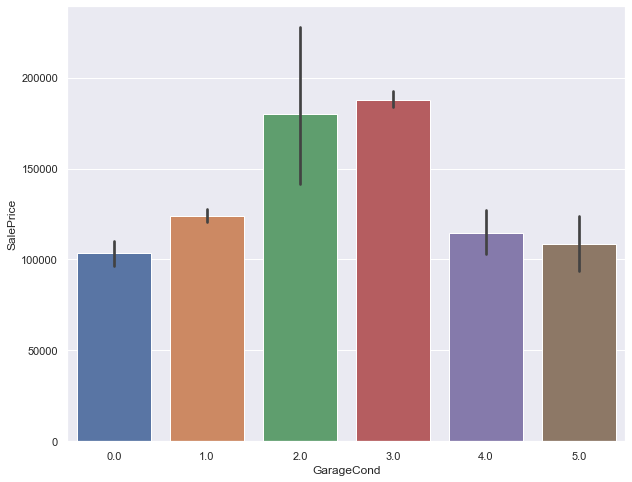

In [351]:
sns.barplot(df_train['GarageCond'],df_train['SalePrice'])

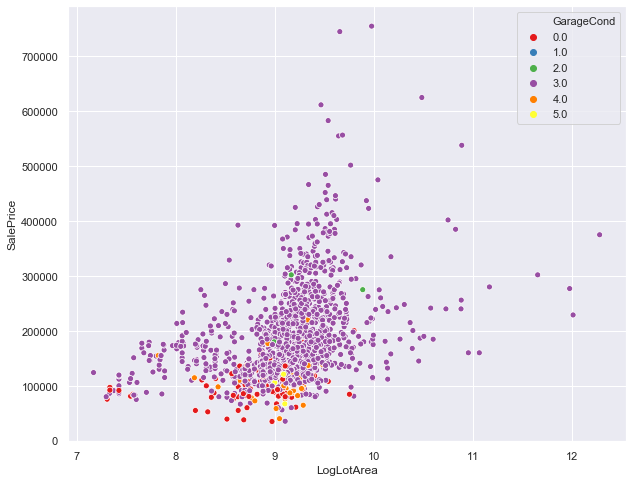

In [352]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['GarageCond'],palette = 'Set1')

## 65) PavedDrive: Paved driveway

       Y    Paved = 1
       P    Partial Pavement = 2
       N    Dirt/Gravel = 0

In [353]:
df_train['PavedDrive'].value_counts(dropna=False)

Y    1340
N      90
P      30
Name: PavedDrive, dtype: int64

In [354]:
Pd = {'Y':1,'P':2,'N':0}
df_train['PavedDrive'] =df_train['PavedDrive'].map(Pd)

In [355]:
df_train['PavedDrive'].value_counts(dropna=False)

1    1340
0      90
2      30
Name: PavedDrive, dtype: int64

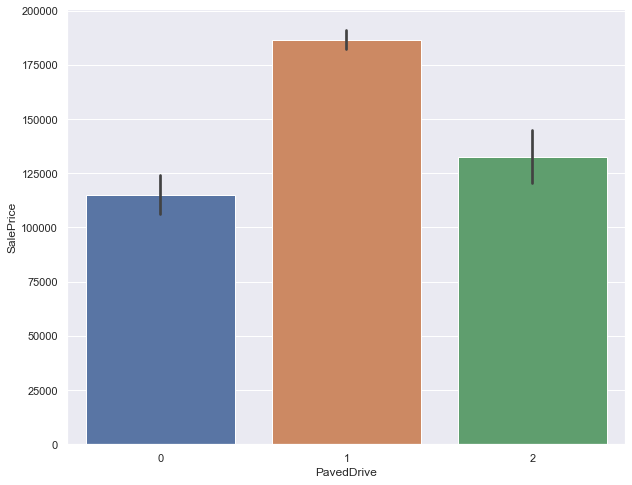

In [356]:
sns.barplot(df_train['PavedDrive'],df_train['SalePrice'])

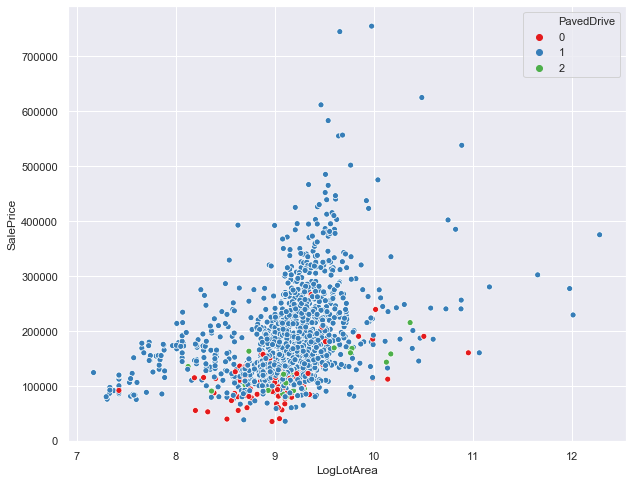

In [357]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['PavedDrive'],palette = 'Set1')

## 66) WoodDeckSF: Wood deck area in square feet

In [358]:
df_train['WoodDeckSF'].value_counts(dropna=False)

0      761
192     38
100     36
144     33
120     31
      ... 
269      1
265      1
263      1
260      1
215      1
Name: WoodDeckSF, Length: 274, dtype: int64

In [359]:
df_train['WoodDeckSF'].describe()

count    1460.000000
mean       94.244521
std       125.338794
min         0.000000
25%         0.000000
50%         0.000000
75%       168.000000
max       857.000000
Name: WoodDeckSF, dtype: float64

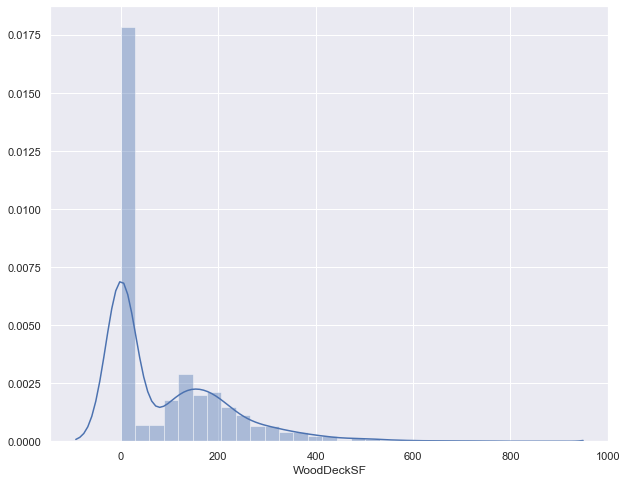

In [360]:
sns.distplot(df_train['WoodDeckSF'])

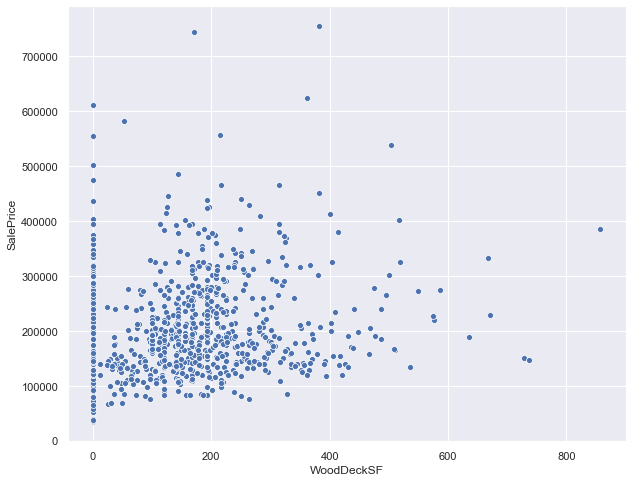

In [361]:
sns.scatterplot(df_train['WoodDeckSF'],df_train['SalePrice'])

## 67) OpenPorchSF: Open porch area in square feet

In [362]:
df_train['OpenPorchSF'].value_counts(dropna=False)

0      656
36      29
48      22
20      21
40      19
      ... 
159      1
156      1
148      1
142      1
119      1
Name: OpenPorchSF, Length: 202, dtype: int64

In [363]:
df_train['OpenPorchSF'].describe()

count    1460.000000
mean       46.660274
std        66.256028
min         0.000000
25%         0.000000
50%        25.000000
75%        68.000000
max       547.000000
Name: OpenPorchSF, dtype: float64

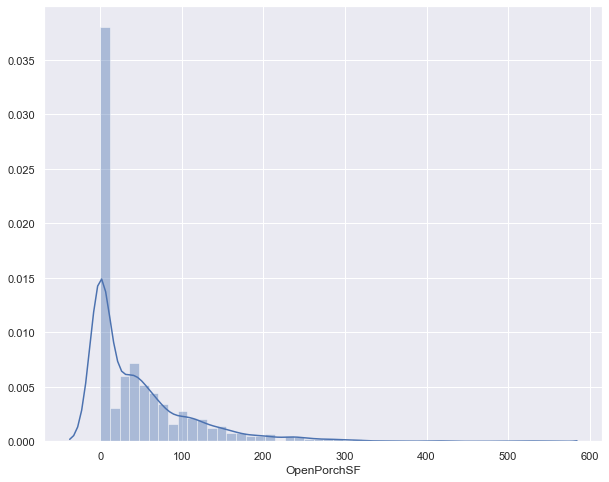

In [364]:
sns.distplot(df_train['OpenPorchSF'])

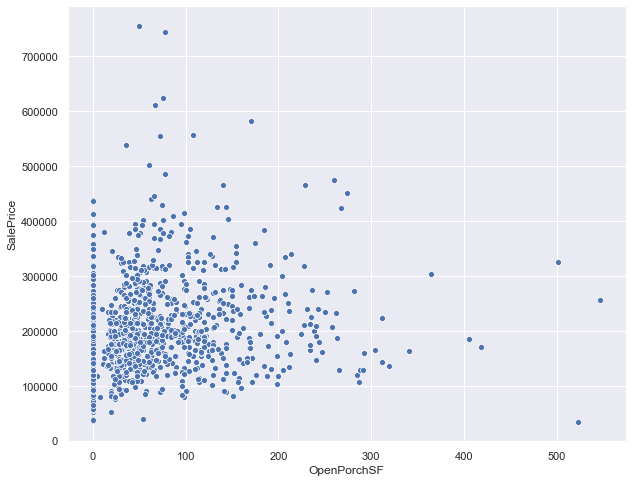

In [365]:
sns.scatterplot(df_train['OpenPorchSF'],df_train['SalePrice'])

## 68) EnclosedPorch: Enclosed porch area in square feet

In [366]:
df_train['EnclosedPorch'].value_counts(dropna=False)

0      1252
112      15
96        6
120       5
144       5
       ... 
174       1
177       1
183       1
189       1
552       1
Name: EnclosedPorch, Length: 120, dtype: int64

In [367]:
df_train['EnclosedPorch'].describe()

count    1460.000000
mean       21.954110
std        61.119149
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       552.000000
Name: EnclosedPorch, dtype: float64

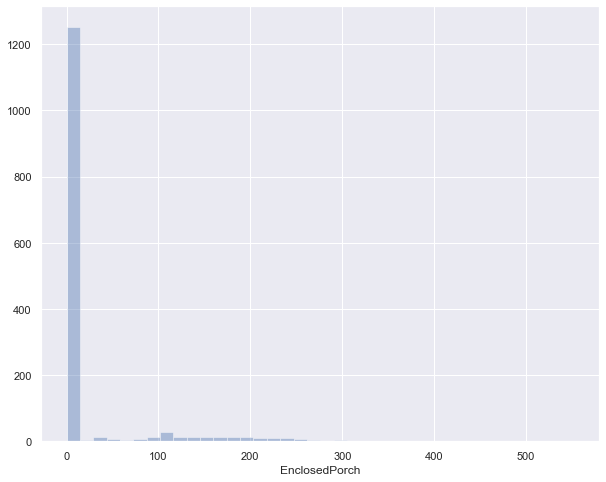

In [368]:
sns.distplot(df_train['EnclosedPorch'],kde=False)

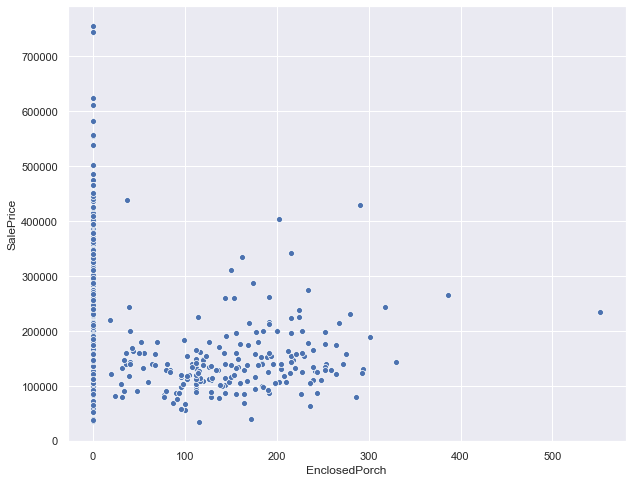

In [369]:
sns.scatterplot(df_train['EnclosedPorch'],df_train['SalePrice'])

## 69) 3SsnPorch: Three season porch area in square feet

In [370]:
df_train['3SsnPorch'].value_counts(dropna=False)

0      1436
168       3
216       2
144       2
180       2
245       1
238       1
290       1
196       1
182       1
407       1
304       1
162       1
153       1
320       1
140       1
130       1
96        1
23        1
508       1
Name: 3SsnPorch, dtype: int64

In [371]:
df_train['3SsnPorch'].describe()

count    1460.000000
mean        3.409589
std        29.317331
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       508.000000
Name: 3SsnPorch, dtype: float64

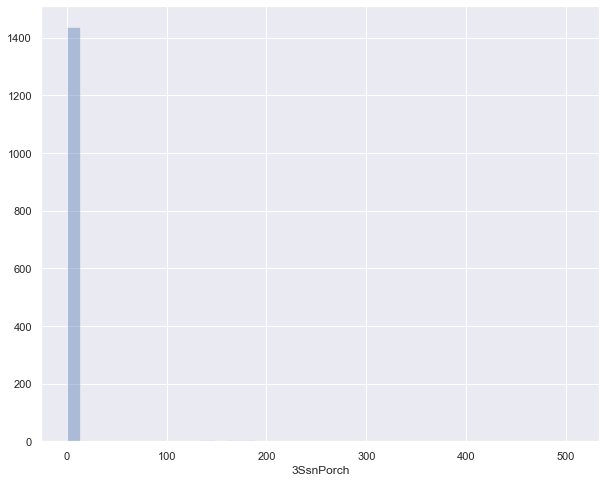

In [372]:
sns.distplot(df_train['3SsnPorch'],kde=False)

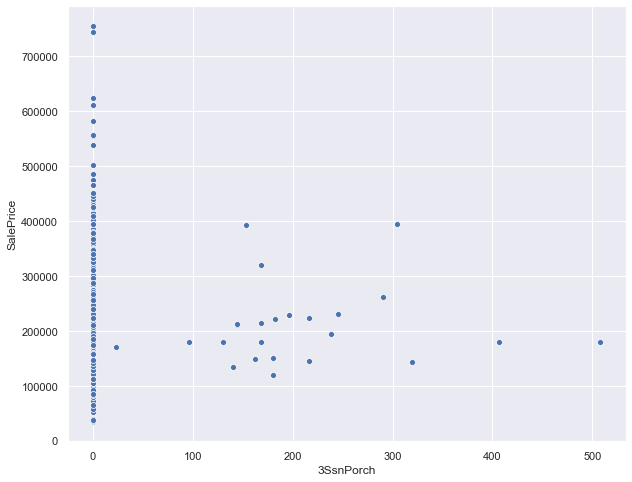

In [373]:
sns.scatterplot(df_train['3SsnPorch'],df_train['SalePrice'])

## 70) ScreenPorch: Screen porch area in square feet

In [374]:
df_train['ScreenPorch'].value_counts(dropna=False)

0      1344
192       6
224       5
120       5
189       4
       ... 
182       1
440       1
178       1
312       1
480       1
Name: ScreenPorch, Length: 76, dtype: int64

In [375]:
df_train['ScreenPorch'].describe()

count    1460.000000
mean       15.060959
std        55.757415
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       480.000000
Name: ScreenPorch, dtype: float64

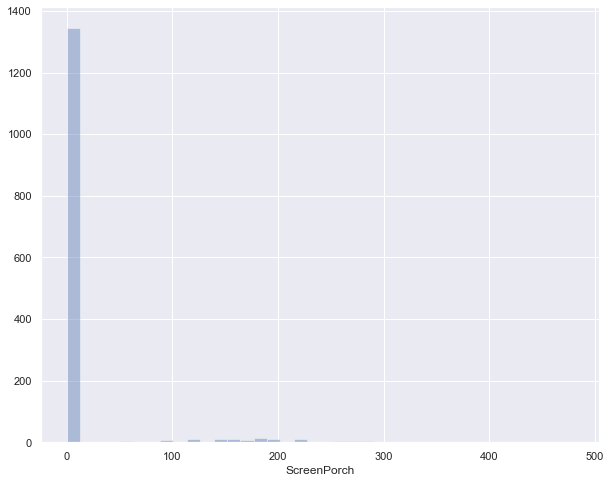

In [376]:
sns.distplot(df_train['ScreenPorch'],kde=False)

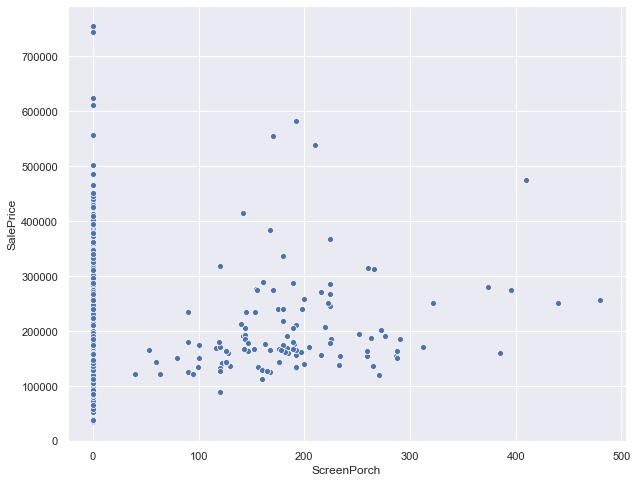

In [377]:
sns.scatterplot(df_train['ScreenPorch'],df_train['SalePrice'])

## 71) PoolArea: Pool area in square feet

In [378]:
df_train['PoolArea'].value_counts(dropna=False)

0      1453
738       1
648       1
576       1
555       1
519       1
512       1
480       1
Name: PoolArea, dtype: int64

In [379]:
df_train['PoolArea'].describe()

count    1460.000000
mean        2.758904
std        40.177307
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       738.000000
Name: PoolArea, dtype: float64

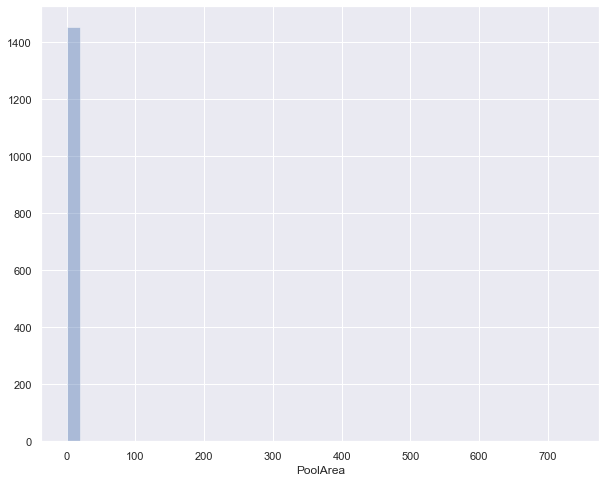

In [380]:
sns.distplot(df_train['PoolArea'],kde=False)

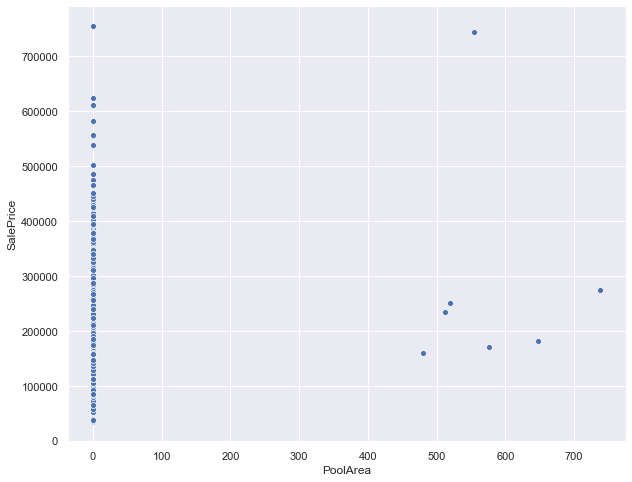

In [381]:
sns.scatterplot(df_train['PoolArea'],df_train['SalePrice'])

## 72) PoolQC: Pool quality

       Ex    Excellent = 1
       Gd    Good = 2
       TA    Average/Typical = 3
       Fa    Fair = 4
       NA    No Pool = 0

In [382]:
df_train['PoolQC'].value_counts(dropna=False)

NaN    1453
Gd        3
Fa        2
Ex        2
Name: PoolQC, dtype: int64

In [383]:
pqc = {'NaN':0,'Ex':1,'Gd':2,'TA':3,'Fa':4}
df_train['PoolQC'] = df_train['PoolQC'].map(pqc)

In [384]:
df_train['PoolQC'] = df_train['PoolQC'].fillna(0)

In [385]:
df_train['PoolQC'].value_counts(dropna=False)

0.0    1453
2.0       3
4.0       2
1.0       2
Name: PoolQC, dtype: int64

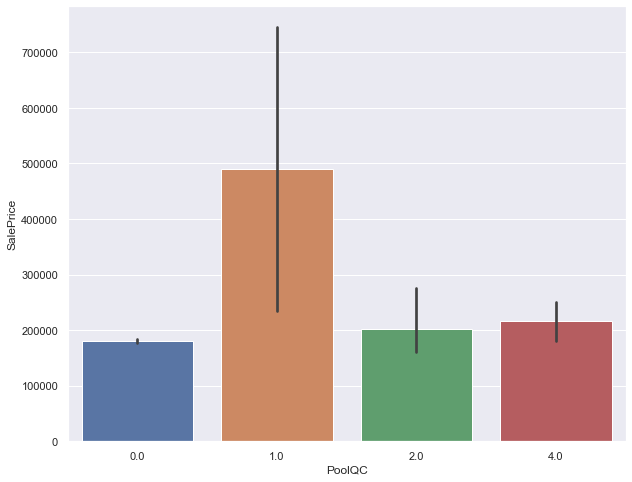

In [386]:
sns.barplot(df_train['PoolQC'],df_train['SalePrice'])

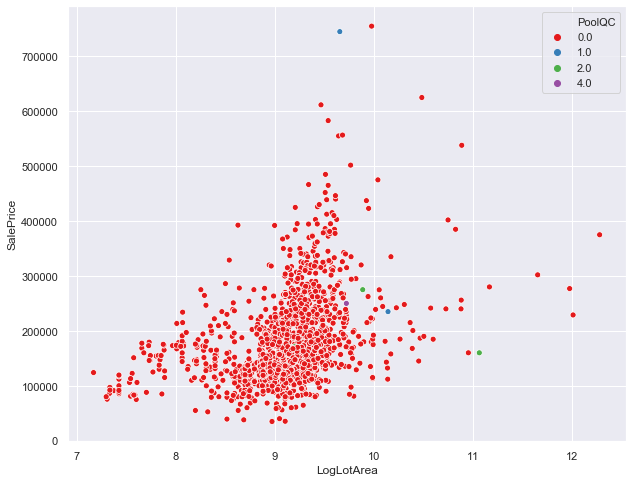

In [387]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['PoolQC'],palette = 'Set1')

## 73) Fence: Fence quality

       GdPrv    Good Privacy = 1
       MnPrv    Minimum Privacy = 2
       GdWo    Good Wood = 3
       MnWw    Minimum Wood/Wire = 4
       NA    No Fence = 0

In [388]:
df_train['Fence'].value_counts(dropna=False)

NaN      1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64

In [389]:
f = {'NaN':0,'GdPrv':1,'MnPrv':2,'GdWo':3,'MnWw':4}
df_train['Fence'] = df_train['Fence'].map(f)

In [390]:
df_train['Fence'] = df_train['Fence'].fillna(0)

In [391]:
df_train['Fence'].value_counts(dropna=False)

0.0    1179
2.0     157
1.0      59
3.0      54
4.0      11
Name: Fence, dtype: int64

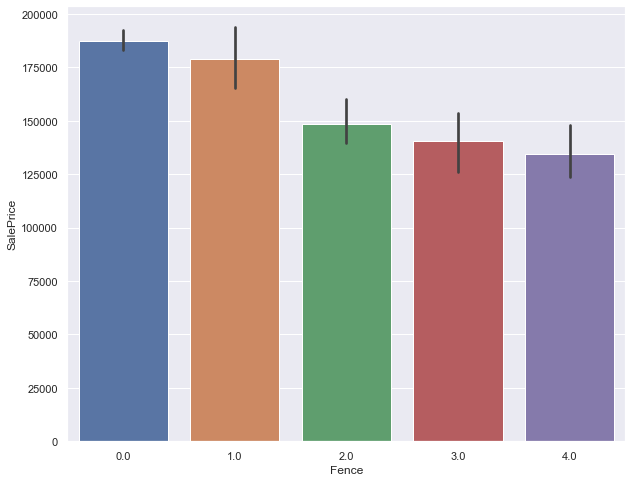

In [392]:
sns.barplot(df_train['Fence'],df_train['SalePrice'])

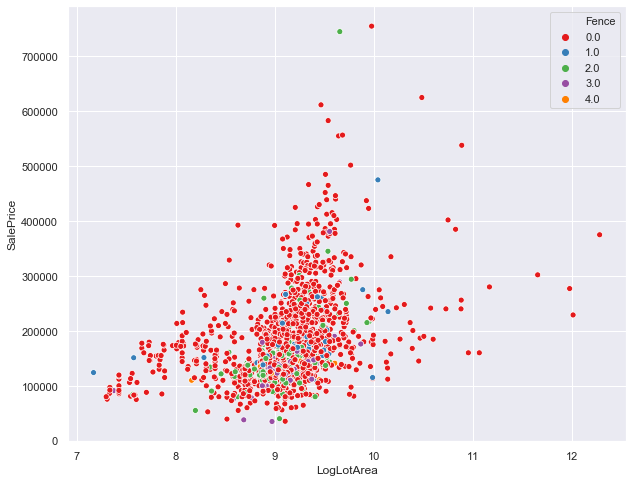

In [393]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['Fence'],palette = 'Set1')

## 74) MiscFeature: Miscellaneous feature not covered in other categories

       Elev    Elevator - 1
       Gar2    2nd Garage (if not described in garage section) = 2
       Othr    Other = 3
       Shed    Shed (over 100 SF) = 4
       TenC    Tennis Court = 5
        NA    None = 0

In [394]:
df_train['MiscFeature'].value_counts(dropna=False)

NaN     1406
Shed      49
Othr       2
Gar2       2
TenC       1
Name: MiscFeature, dtype: int64

In [395]:
mf = {'NaN':0,'Elev':1,'Gar2':2,'Othr':3,'Shed':4,'TenC':5}
df_train['MiscFeature']=df_train['MiscFeature'].map(mf)

In [396]:
df_train['MiscFeature']=df_train['MiscFeature'].fillna(0)

In [397]:
df_train['MiscFeature'].value_counts(dropna=False)

0.0    1406
4.0      49
3.0       2
2.0       2
5.0       1
Name: MiscFeature, dtype: int64

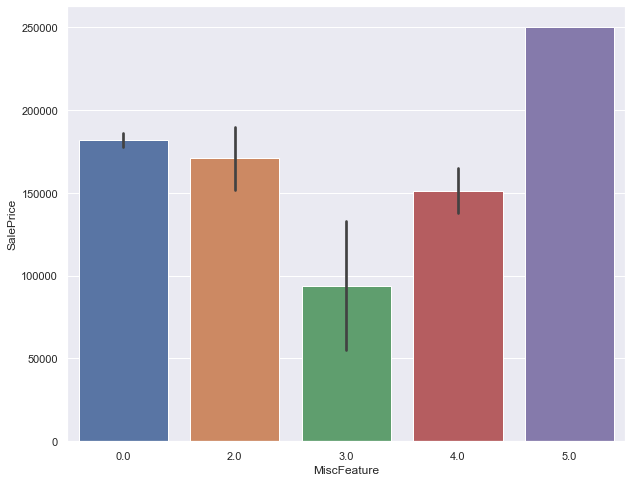

In [398]:
sns.barplot(df_train['MiscFeature'],df_train['SalePrice'])

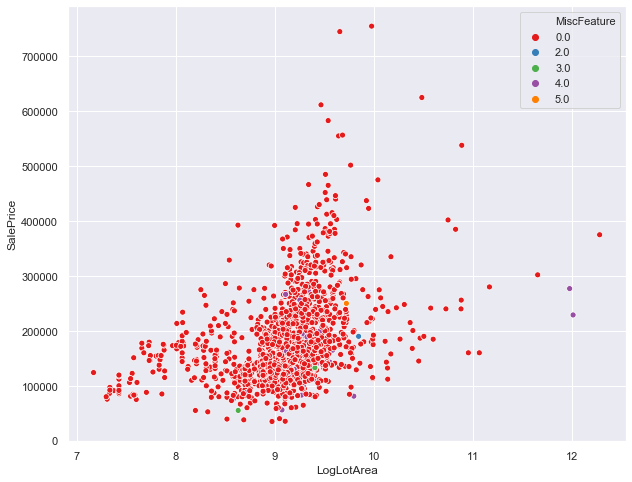

In [399]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['MiscFeature'],palette = 'Set1')

## 75) MiscVal:$Value of miscellaneous feature

In [400]:
df_train['MiscVal'].value_counts(dropna=False)

0        1408
400        11
500         8
700         5
450         4
2000        4
600         4
1200        2
480         2
1150        1
800         1
15500       1
620         1
3500        1
560         1
2500        1
1300        1
1400        1
350         1
8300        1
54          1
Name: MiscVal, dtype: int64

In [401]:
df_train['MiscVal'].describe()

count     1460.000000
mean        43.489041
std        496.123024
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      15500.000000
Name: MiscVal, dtype: float64

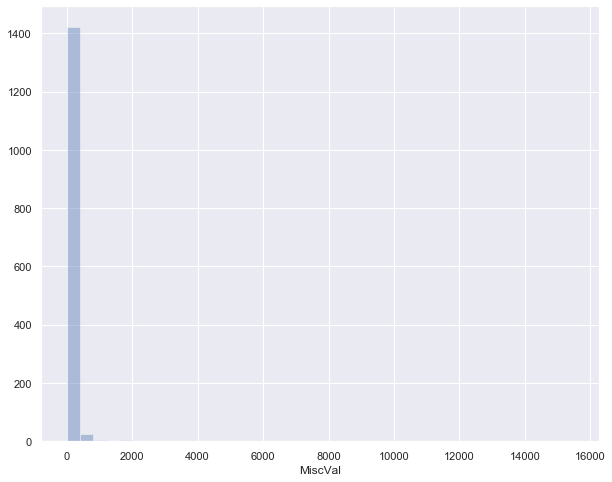

In [402]:
sns.distplot(df_train['MiscVal'],kde=False)

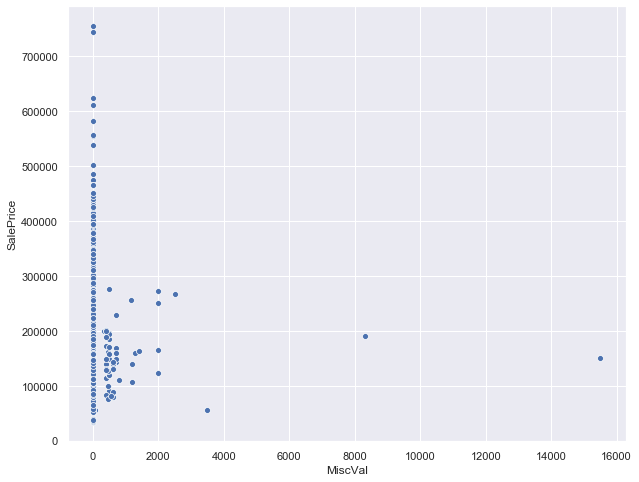

In [403]:
sns.scatterplot(df_train['MiscVal'],df_train['SalePrice'])

## 76) MoSold: Month Sold (MM)

In [404]:
df_train['MoSold'].value_counts(dropna=False)

6     253
7     234
5     204
4     141
8     122
3     106
10     89
11     79
9      63
12     59
1      58
2      52
Name: MoSold, dtype: int64

In [405]:
df_train['MoSold'].describe()

count    1460.000000
mean        6.321918
std         2.703626
min         1.000000
25%         5.000000
50%         6.000000
75%         8.000000
max        12.000000
Name: MoSold, dtype: float64

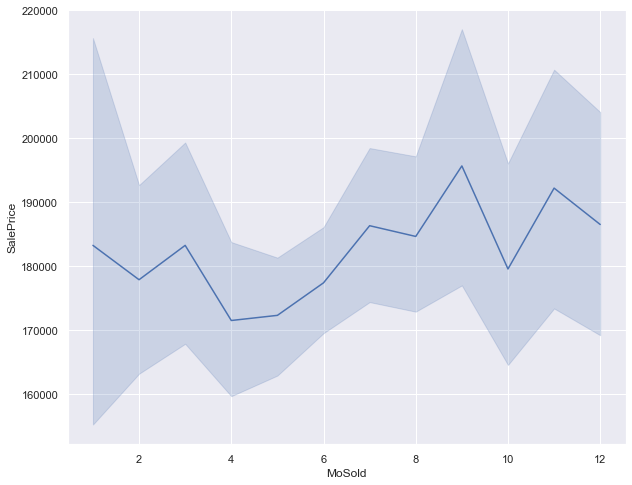

In [406]:
sns.lineplot(df_train['MoSold'],df_train['SalePrice'])

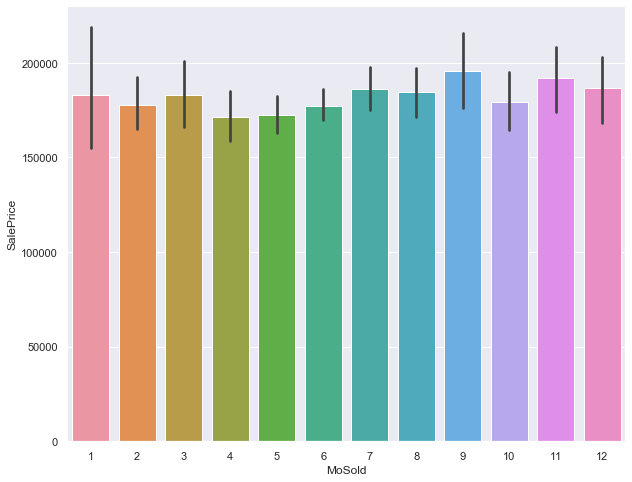

In [407]:
sns.barplot(df_train['MoSold'],df_train['SalePrice'])

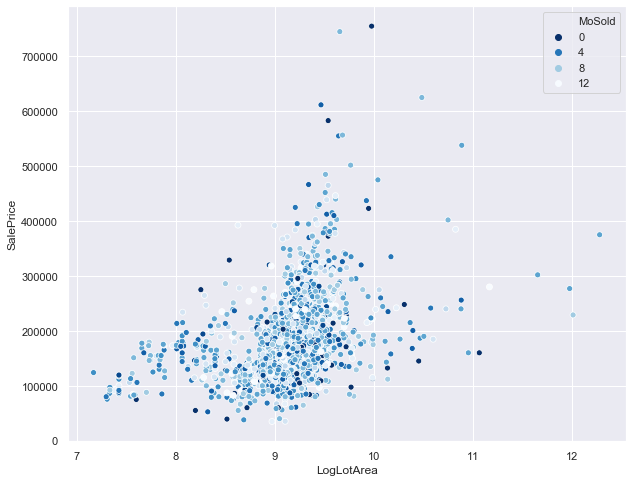

In [408]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['MoSold'],palette = 'Blues_r')

## 77) YrSold: Year Sold (YYYY)

In [409]:
df_train['YrSold'].value_counts(dropna=False)

2009    338
2007    329
2006    314
2008    304
2010    175
Name: YrSold, dtype: int64

In [410]:
df_train['YrSold'].describe()

count    1460.000000
mean     2007.815753
std         1.328095
min      2006.000000
25%      2007.000000
50%      2008.000000
75%      2009.000000
max      2010.000000
Name: YrSold, dtype: float64

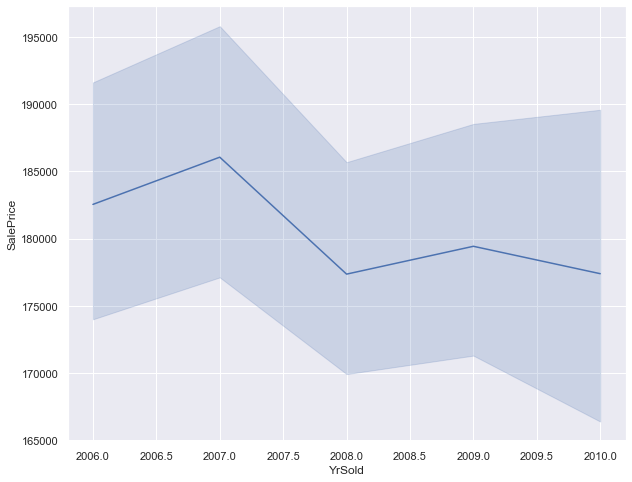

In [411]:
sns.lineplot(df_train['YrSold'],df_train['SalePrice'])

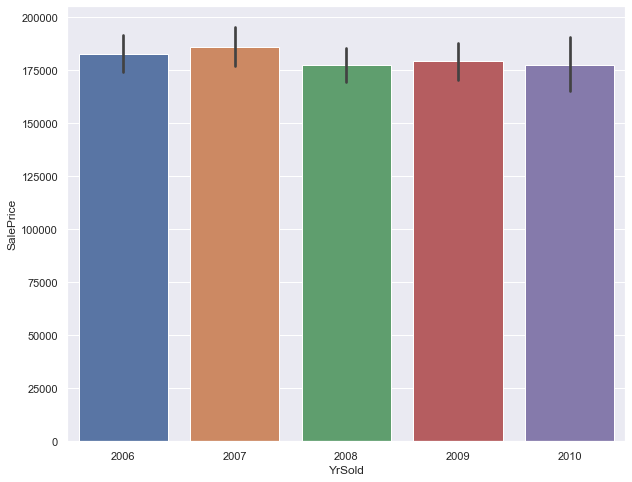

In [412]:
sns.barplot(df_train['YrSold'],df_train['SalePrice'])

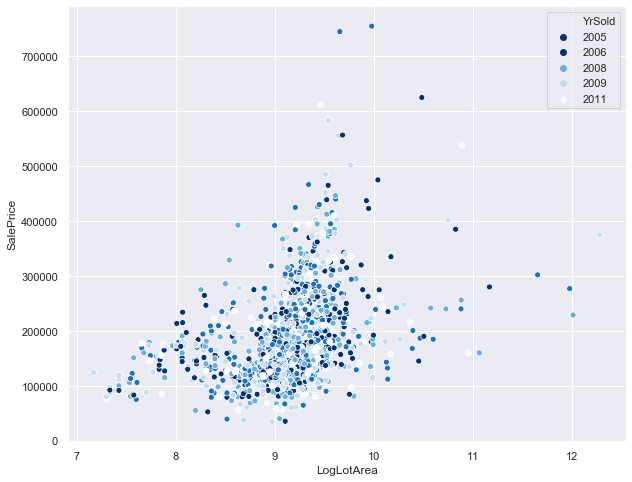

In [413]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['YrSold'],palette = 'Blues_r')

## 78) SaleType: Type of sale
		
       WD 	Warranty Deed - Conventional = 0
       CWD	Warranty Deed - Cash = 1
       VWD	Warranty Deed - VA Loan = 2
       New	Home just constructed and sold = 3
       COD	Court Officer Deed/Estate = 4
       Con	Contract 15% Down payment regular terms = 5
       ConLw	Contract Low Down payment and low interest = 6
       ConLI	Contract Low Interest = 7
       ConLD	Contract Low Down = 8
       Oth	Other = 9

In [414]:
df_train['SaleType'].value_counts(dropna=False)

WD       1267
New       122
COD        43
ConLD       9
ConLw       5
ConLI       5
CWD         4
Oth         3
Con         2
Name: SaleType, dtype: int64

In [415]:
st = {'WD':0,'CWD':1,'VWD':2,'New':3,'COD':4,'Con':5,'ConLw':6,'ConLI':7,'ConLD':8,'Oth':9}
df_train['SaleType']=df_train['SaleType'].map(st)

In [416]:
df_train['SaleType'].value_counts(dropna=False)

0    1267
3     122
4      43
8       9
7       5
6       5
1       4
9       3
5       2
Name: SaleType, dtype: int64

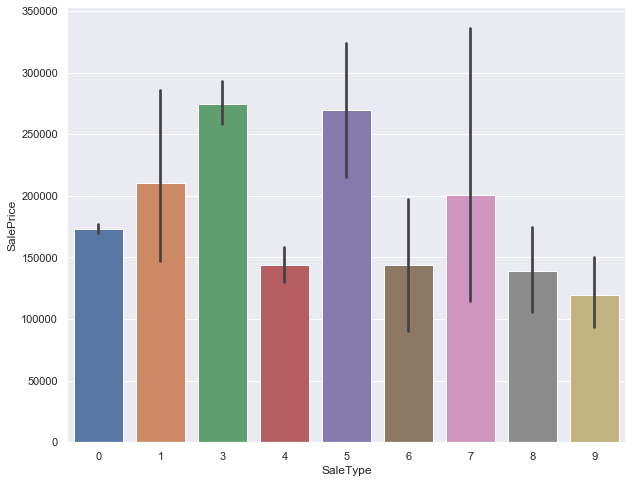

In [417]:
sns.barplot(df_train['SaleType'],df_train['SalePrice'])

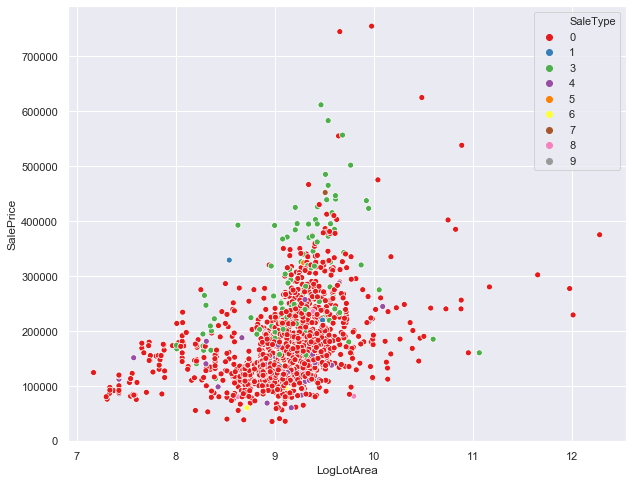

In [418]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['SaleType'],palette = 'Set1')

## 79) SaleCondition: Condition of sale

       Normal	Normal Sale = 0
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale = 1
       AdjLand	Adjoining Land Purchase = 2
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit = 3	
       Family	Sale between family members = 4
       Partial	Home was not completed when last assessed (associated with New Homes) = 5


In [419]:
df_train['SaleCondition'].value_counts(dropna=False)

Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: SaleCondition, dtype: int64

In [420]:
sc = {'Normal':0,'Abnorml':1,'AdjLand':2,'Alloca':3,'Family':4,'Partial':5}
df_train['SaleCondition']=df_train['SaleCondition'].map(sc)

In [421]:
df_train['SaleCondition'].value_counts(dropna=False)

0    1198
5     125
1     101
4      20
3      12
2       4
Name: SaleCondition, dtype: int64

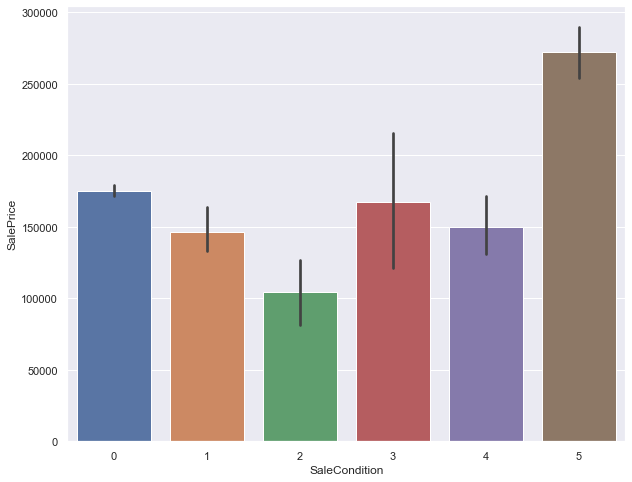

In [422]:
sns.barplot(df_train['SaleCondition'],df_train['SalePrice'])

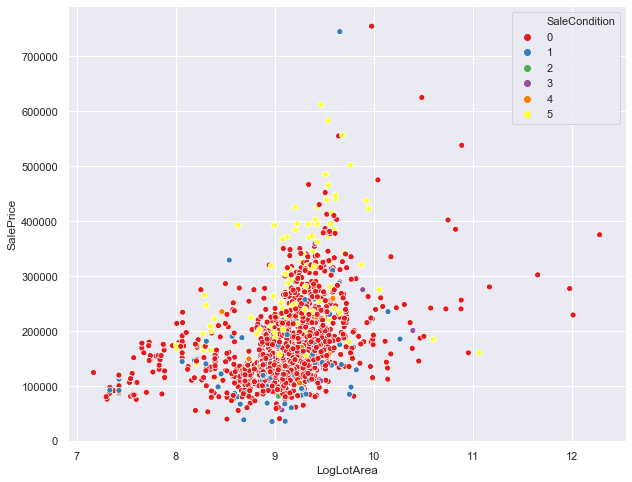

In [423]:
sns.scatterplot(df_train['LogLotArea'],df_train['SalePrice'], hue = df_train['SaleCondition'],palette = 'Set1')

## 80) SalePrice

In [424]:
df_train['SalePrice'].value_counts(dropna=False)

140000    20
135000    17
145000    14
155000    14
190000    13
          ..
84900      1
424870     1
415298     1
62383      1
34900      1
Name: SalePrice, Length: 663, dtype: int64

In [425]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

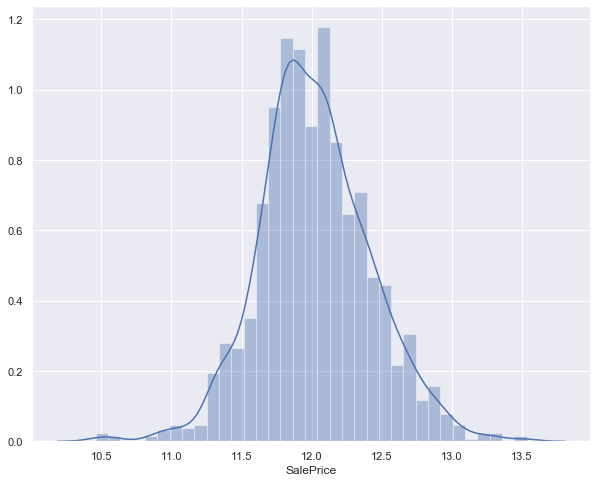

In [426]:
sns.distplot(np.log(df_train['SalePrice']))

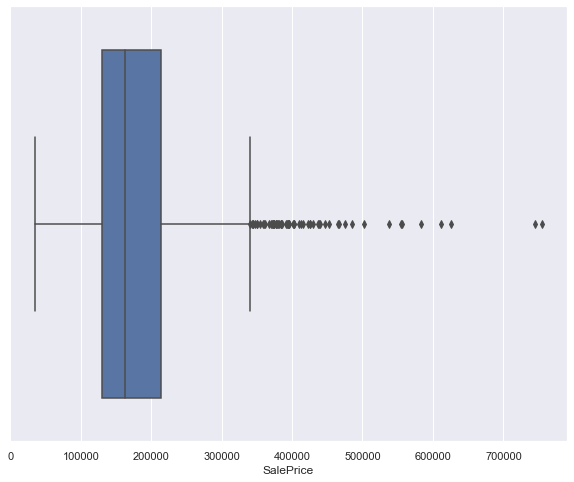

In [427]:
sns.boxplot(df_train['SalePrice'])

In [428]:
df_train['SalePrice_log'] = np.log(df_train['SalePrice'])

In [429]:
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,LogLotArea,ext_no,SalePrice_log
0,1,60,0,65.0,8450,1,0.0,0,0,0,...,0.0,0,2,2008,0,0,208500,9.041922,1,12.247694
1,2,20,0,80.0,9600,1,0.0,0,0,0,...,0.0,0,5,2007,0,0,181500,9.169518,1,12.109011
2,3,60,0,68.0,11250,1,0.0,1,0,0,...,0.0,0,9,2008,0,0,223500,9.328123,1,12.317167
3,4,70,0,60.0,9550,1,0.0,1,0,0,...,0.0,0,2,2006,0,1,140000,9.164296,1,11.849398
4,5,60,0,84.0,14260,1,0.0,1,0,0,...,0.0,0,12,2008,0,0,250000,9.565214,1,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,0,62.0,7917,1,0.0,0,0,0,...,0.0,0,8,2007,0,0,175000,8.976768,1,12.072541
1456,1457,20,0,85.0,13175,1,0.0,0,0,0,...,0.0,0,2,2010,0,0,210000,9.486076,1,12.254863
1457,1458,70,0,66.0,9042,1,0.0,0,0,0,...,4.0,2500,5,2010,0,0,266500,9.109636,2,12.493130
1458,1459,20,0,68.0,9717,1,0.0,0,0,0,...,0.0,0,4,2010,0,0,142125,9.181632,1,11.864462


In [430]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 84 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   int64  
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   int64  
 6   Alley          1460 non-null   float64
 7   LotShape       1460 non-null   int64  
 8   LandContour    1460 non-null   int64  
 9   Utilities      1460 non-null   int64  
 10  LotConfig      1460 non-null   int64  
 11  LandSlope      1460 non-null   int64  
 12  Neighborhood   1235 non-null   float64
 13  Condition1     1460 non-null   int64  
 14  Condition2     1460 non-null   int64  
 15  BldgType       1460 non-null   int64  
 16  HouseStyle     1460 non-null   int64  
 17  OverallQual    1460 non-null   int64  
 18  OverallC

# Remove Outliers 

## Z-score Technique for Finding Outliers

- The Z-score is the signed number of standard deviations by which the value of an observation or data point is above the mean value of what is being observed or measured.

- if the Z-score value is greater than or less than 3 or -3 respectively, that data point will be identified as outliers

- replace Outliers which greater than 3Q with 3Q value and replace outliers which less than 1Q with 1Q value

In [431]:
def det_outlier(data):
    outlier=[]
    threshold=3
    th= -3
    mean=np.mean(data)
    std=np.std(data)
    
    for i in data:
        Zscore=(i-mean)/std
        if np.abs(Zscore)>threshold:
            outlier.append(i)
        elif np.abs(Zscore)<th:
            outlier.append(i)
    return outlier

## 3) LotFrontAge

In [432]:
det_outlier(df_train['LotFrontage'])

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---']

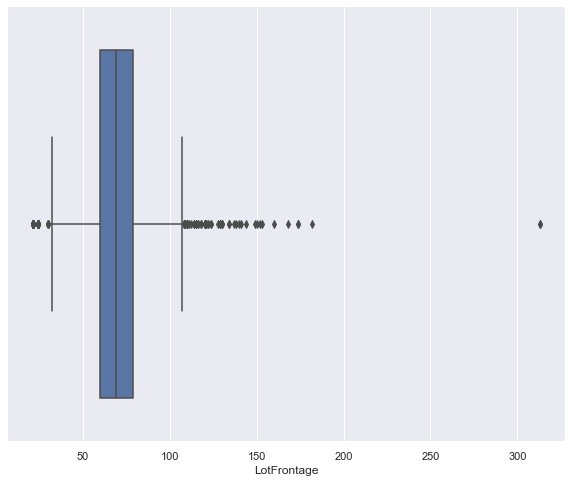

In [433]:
sns.boxplot(df_train['LotFrontage'])

In [434]:
np.quantile(df_train['LotFrontage'],0.75)

79.0

In [435]:
np.quantile(df_train['LotFrontage'],0.25)

60.0

In [436]:
df_train['LotFrontage'].describe()

count    1460.000000
mean       69.863699
std        22.027677
min        21.000000
25%        60.000000
50%        69.000000
75%        79.000000
max       313.000000
Name: LotFrontage, dtype: float64

In [437]:
for i in df_train.LotFrontage:
    if i >= 137:
        df_train['LotFrontage'].replace(i,79,inplace=True)

In [438]:
df_train['LotFrontage'].describe()

count    1460.000000
mean       68.819863
std        18.259827
min        21.000000
25%        60.000000
50%        69.000000
75%        79.000000
max       134.000000
Name: LotFrontage, dtype: float64

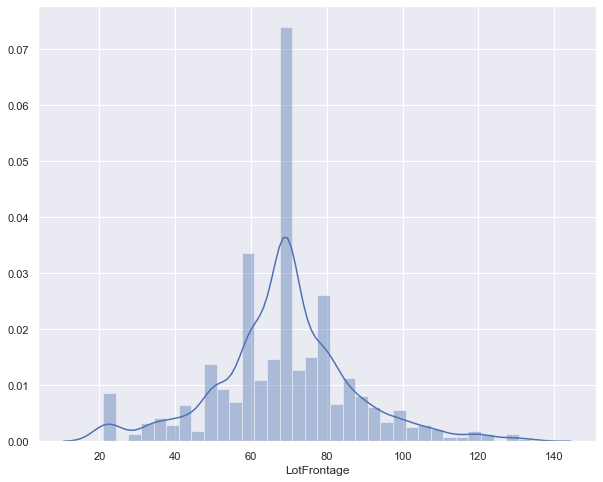

In [439]:
sns.distplot(df_train['LotFrontage'])

In [440]:
def rep(data,num,Q):
    for i in data:
        if i >= num:
             data.replace(i,Q,inplace=True)
    return data

## 4) LotArea

In [441]:
det_outlier(df_train.LotArea)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---']

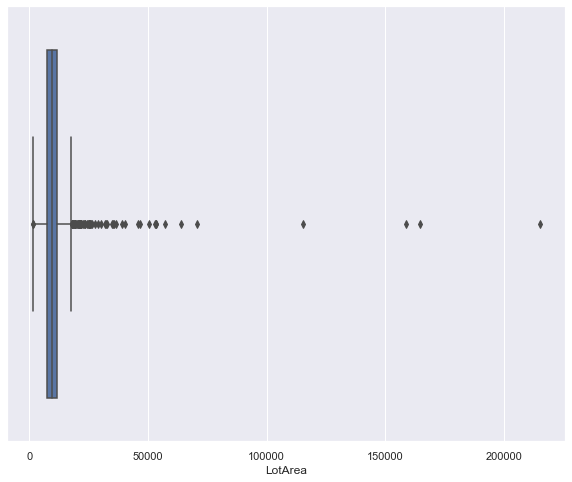

In [442]:
sns.boxplot(df_train.LotArea)

In [443]:
np.quantile(df_train.LotArea, 0.75)

11601.5

In [444]:
rep(df_train.LotArea,45600,11601.5)

0        8450.0
1        9600.0
2       11250.0
3        9550.0
4       14260.0
         ...   
1455     7917.0
1456    13175.0
1457     9042.0
1458     9717.0
1459     9937.0
Name: LotArea, Length: 1460, dtype: float64

In [445]:
df_train.LotArea.describe()

count     1460.000000
mean      9833.690753
std       4362.233304
min       1300.000000
25%       7553.500000
50%       9478.500000
75%      11600.375000
max      40094.000000
Name: LotArea, dtype: float64

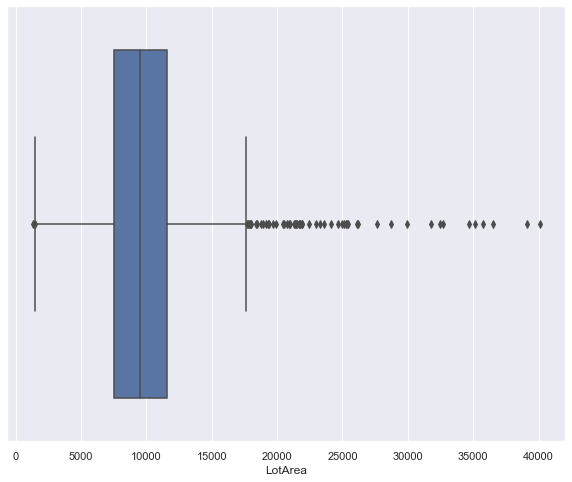

In [446]:
sns.boxplot(df_train.LotArea)

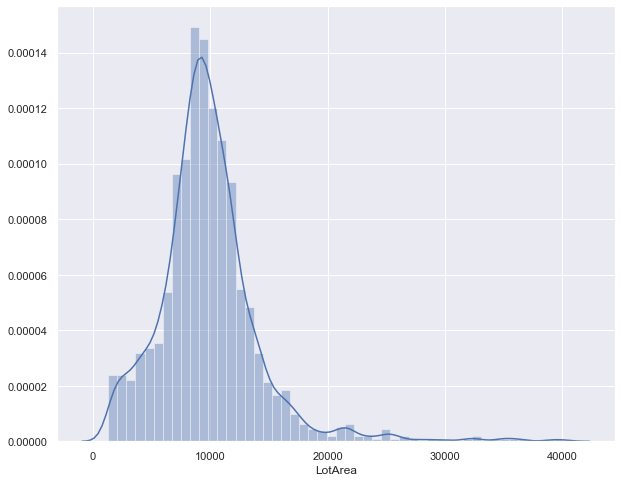

In [447]:
sns.distplot(df_train.LotArea)

## 26) MasVnrArea: Masonry veneer area in square feet

In [448]:
det_outlier(df_train.MasVnrArea)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---']

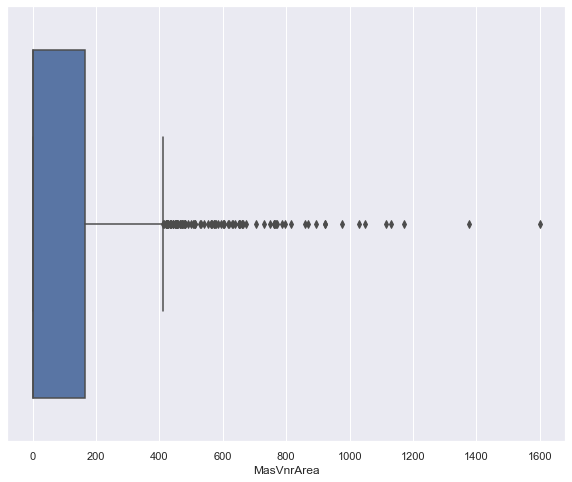

In [449]:
sns.boxplot(df_train.MasVnrArea)

In [450]:
np.quantile(df_train.MasVnrArea, 0.75)

164.25

In [451]:
rep(df_train.MasVnrArea,650.0,164.25)

0       196.0
1         0.0
2       162.0
3         0.0
4       350.0
        ...  
1455      0.0
1456    119.0
1457      0.0
1458      0.0
1459      0.0
Name: MasVnrArea, Length: 1460, dtype: float64

In [452]:
df_train.MasVnrArea.describe()

count    1460.000000
mean       87.823288
std       137.118787
min         0.000000
25%         0.000000
50%         0.000000
75%       164.062500
max       640.000000
Name: MasVnrArea, dtype: float64

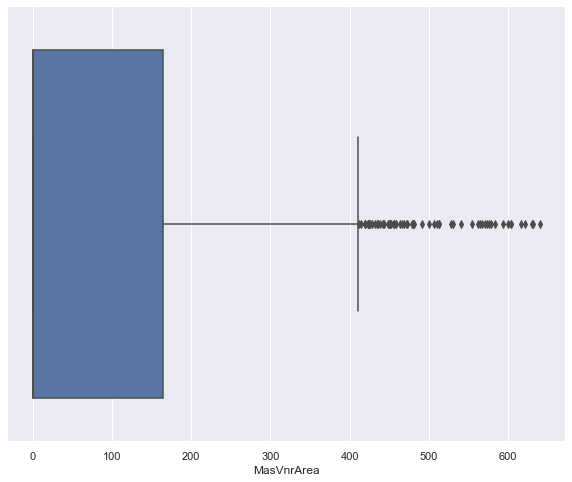

In [453]:
sns.boxplot(df_train.MasVnrArea)

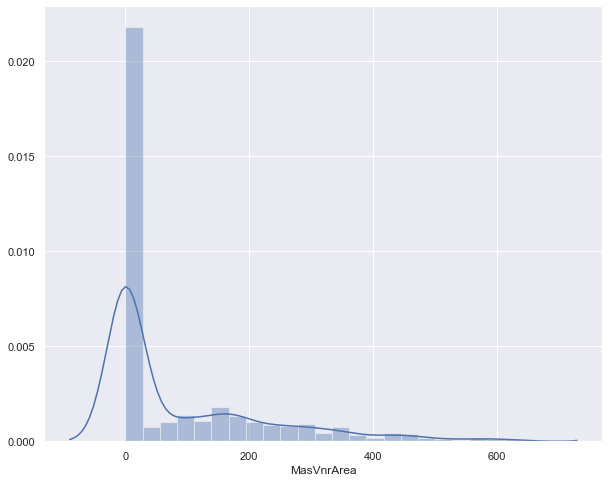

In [454]:
sns.distplot(df_train.MasVnrArea)

## 34) BsmtFinSF1: Type 1 finished square feet

In [455]:
det_outlier(df_train.BsmtFinSF1)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---']

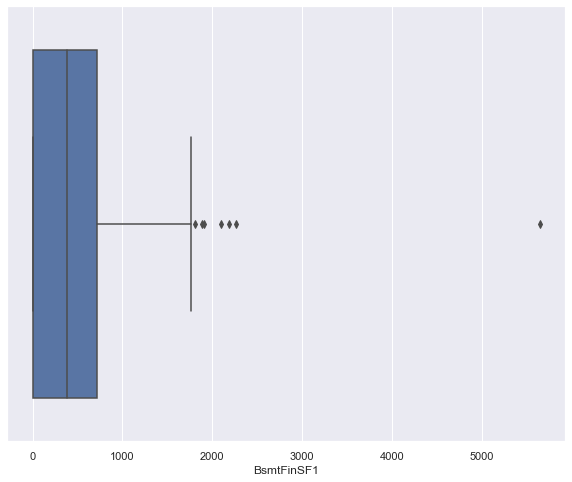

In [456]:
sns.boxplot(df_train.BsmtFinSF1)

In [457]:
np.quantile(df_train.BsmtFinSF1, 0.75)

712.25

In [458]:
rep(df_train.BsmtFinSF1,1880,712.25)

0       706.0
1       978.0
2       486.0
3       216.0
4       655.0
        ...  
1455      0.0
1456    790.0
1457    275.0
1458     49.0
1459    830.0
Name: BsmtFinSF1, Length: 1460, dtype: float64

In [459]:
df_train.BsmtFinSF1.describe()

count    1460.000000
mean      435.627055
std       425.003769
min         0.000000
25%         0.000000
50%       383.500000
75%       712.062500
max      1810.000000
Name: BsmtFinSF1, dtype: float64

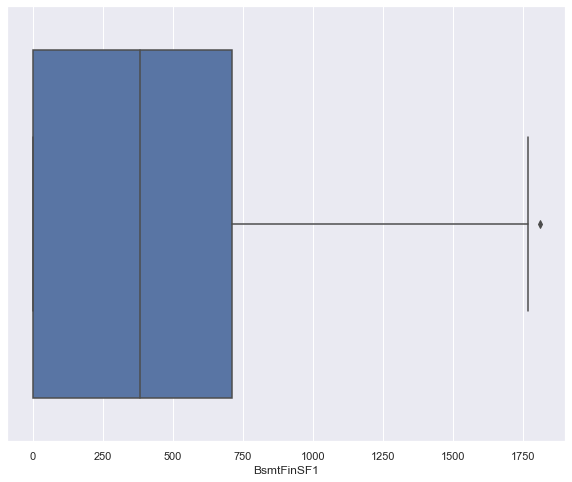

In [460]:
sns.boxplot(df_train.BsmtFinSF1)

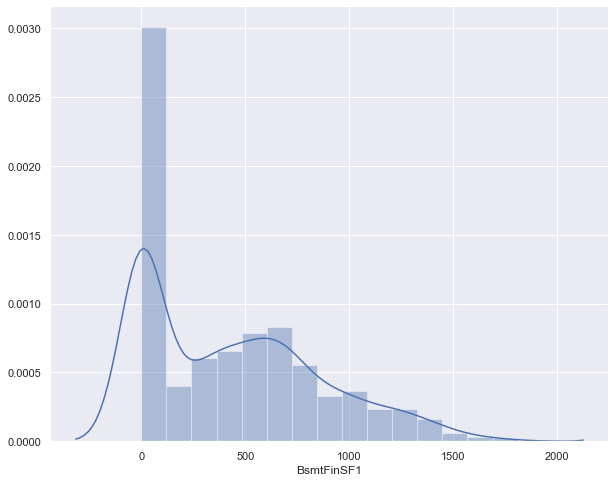

In [461]:
sns.distplot(df_train.BsmtFinSF1)

## 38) TotalBsmtSF: Total square feet of basement area

In [462]:
det_outlier(df_train.TotalBsmtSF)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---',
 2392,
 3206,
 3094,
 3200,
 3138,
 2444,
 2524,
 2396,
 6110,
 2633,
 '---/---']

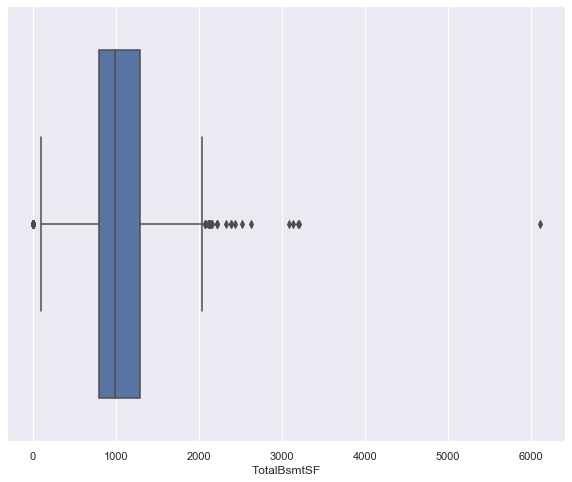

In [463]:
sns.boxplot(df_train.TotalBsmtSF)

In [464]:
np.quantile(df_train.TotalBsmtSF, 0.75)

1298.25

In [465]:
rep(df_train.TotalBsmtSF,2392,1298.25)

0        856.0
1       1262.0
2        920.0
3        756.0
4       1145.0
         ...  
1455     953.0
1456    1542.0
1457    1152.0
1458    1078.0
1459    1256.0
Name: TotalBsmtSF, Length: 1460, dtype: float64

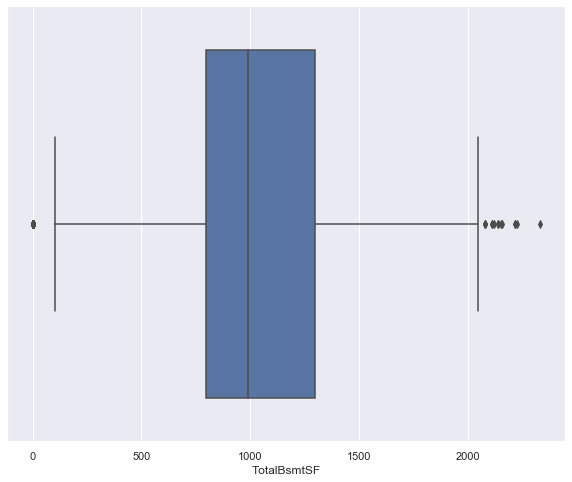

In [466]:
sns.boxplot(df_train.TotalBsmtSF)

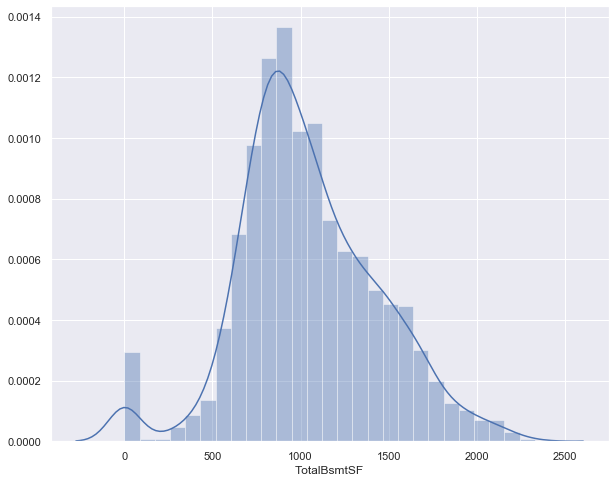

In [467]:
sns.distplot(df_train.TotalBsmtSF)

## 43) 1stFlrSF: First Floor square feet

In [468]:
det_outlier(df_train['1stFlrSF'])

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---',
 2392,
 3206,
 3094,
 3200,
 3138,
 2444,
 2524,
 2396,
 6110,
 2633,
 '---/---',
 2392,
 2402,
 3228,
 3138,
 2515,
 2444,
 2364,
 2898,
 2524,
 2411,
 4692,
 2633,
 '---/---']

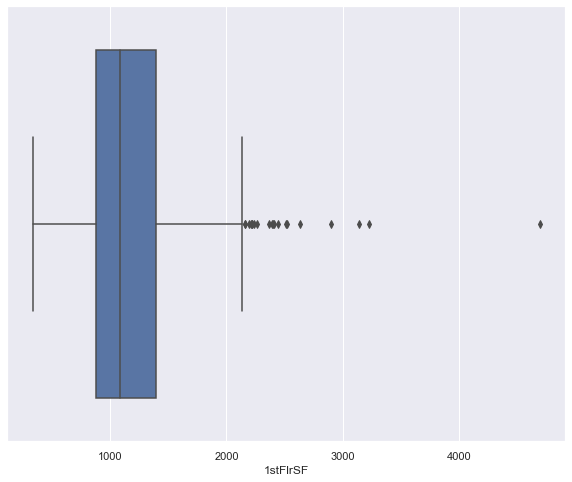

In [469]:
sns.boxplot(df_train['1stFlrSF'])

In [470]:
np.quantile(df_train['1stFlrSF'], 0.75)

1391.25

In [471]:
rep(df_train['1stFlrSF'],2364,1391.25)

0        856.0
1       1262.0
2        920.0
3        961.0
4       1145.0
         ...  
1455     953.0
1456    2073.0
1457    1188.0
1458    1078.0
1459    1256.0
Name: 1stFlrSF, Length: 1460, dtype: float64

In [472]:
df_train['1stFlrSF'].describe()

count    1460.000000
mean     1151.019863
std       352.516686
min       334.000000
25%       882.000000
50%      1087.000000
75%      1391.062500
max      2259.000000
Name: 1stFlrSF, dtype: float64

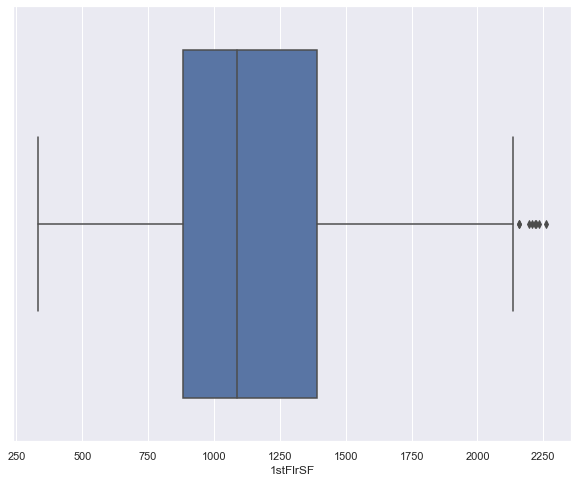

In [473]:
sns.boxplot(df_train['1stFlrSF'])

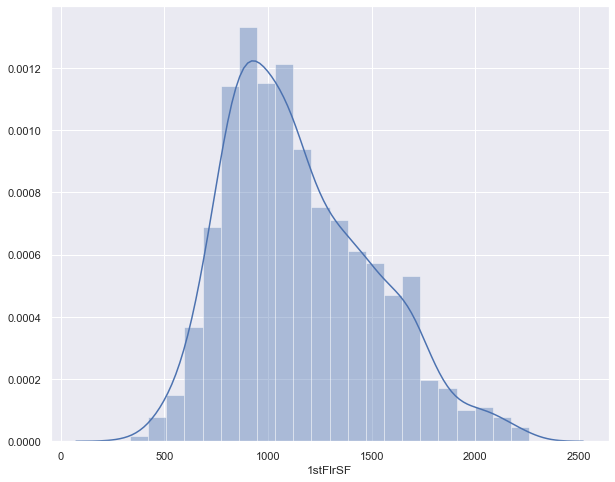

In [474]:
sns.distplot(df_train['1stFlrSF'])

## 44) 2ndFlrSF: Second floor square feet

In [475]:
det_outlier(df_train['2ndFlrSF'])

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---',
 2392,
 3206,
 3094,
 3200,
 3138,
 2444,
 2524,
 2396,
 6110,
 2633,
 '---/---',
 2392,
 2402,
 3228,
 3138,
 2515,
 2444,
 2364,
 2898,
 2524,
 2411,
 4692,
 2633,
 '---/---',
 1818,
 1872,
 1796,
 2065,
 '---/---']

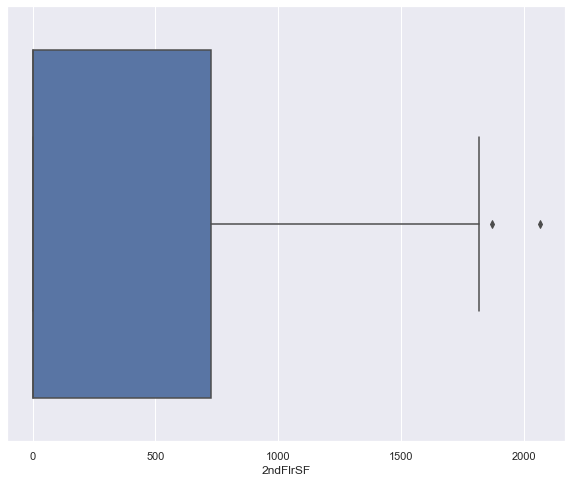

In [476]:
sns.boxplot(df_train['2ndFlrSF'])

In [477]:
np.quantile(df_train['2ndFlrSF'], 0.75)

728.0

In [478]:
rep(df_train['2ndFlrSF'],1796,728.0)

0        854
1          0
2        866
3        756
4       1053
        ... 
1455     694
1456       0
1457    1152
1458       0
1459       0
Name: 2ndFlrSF, Length: 1460, dtype: int64

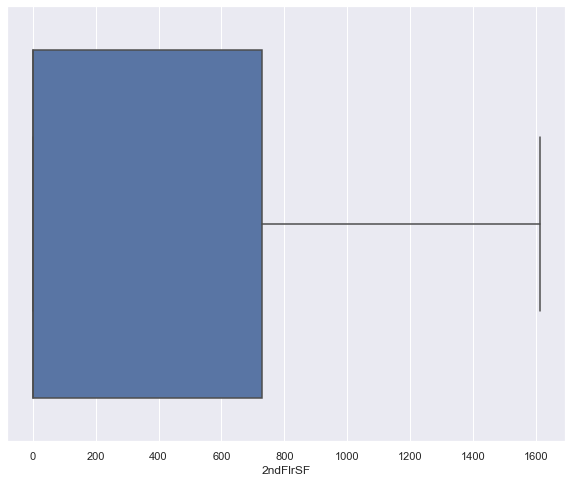

In [479]:
sns.boxplot(df_train['2ndFlrSF'])

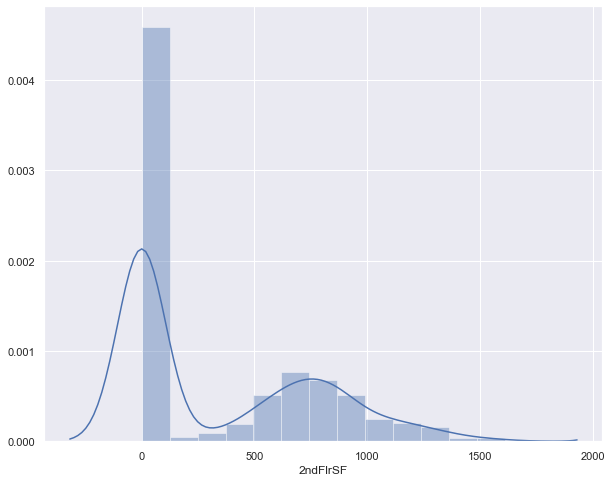

In [480]:
sns.distplot(df_train['2ndFlrSF'])

## 46) GrLivArea: Above grade (ground) living area square feet¶

In [481]:
det_outlier(df_train.GrLivArea)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---',
 2392,
 3206,
 3094,
 3200,
 3138,
 2444,
 2524,
 2396,
 6110,
 2633,
 '---/---',
 2392,
 2402,
 3228,
 3138,
 2515,
 2444,
 2364,
 2898,
 2524,
 2411,
 4692,
 2633,
 '---/---',
 1818,
 1872,
 1796,
 2065,
 '---/---',
 3222,
 3608,
 3112,
 3493,
 3228,
 4676,
 3194,
 3395,
 4316,
 3279,
 3140,
 3627,
 4476,
 3447,
 5642,
 3238,
 '---/---']

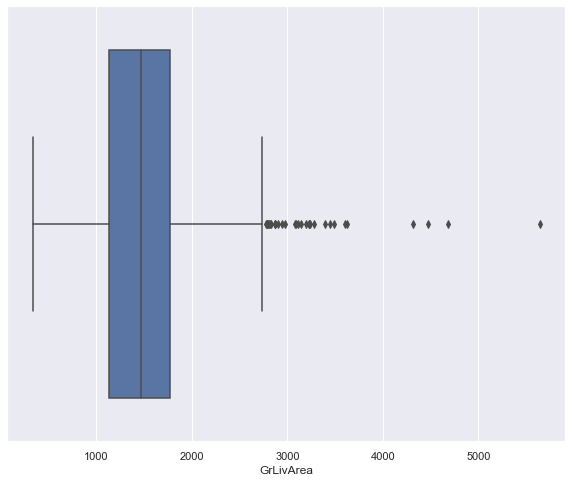

In [482]:
sns.boxplot(df_train.GrLivArea)

In [483]:
np.quantile(df_train.GrLivArea, 0.75)

1776.75

In [484]:
rep(df_train.GrLivArea,3112,1776.75)

0       1710.0
1       1262.0
2       1786.0
3       1717.0
4       2198.0
         ...  
1455    1647.0
1456    2073.0
1457    2340.0
1458    1078.0
1459    1256.0
Name: GrLivArea, Length: 1460, dtype: float64

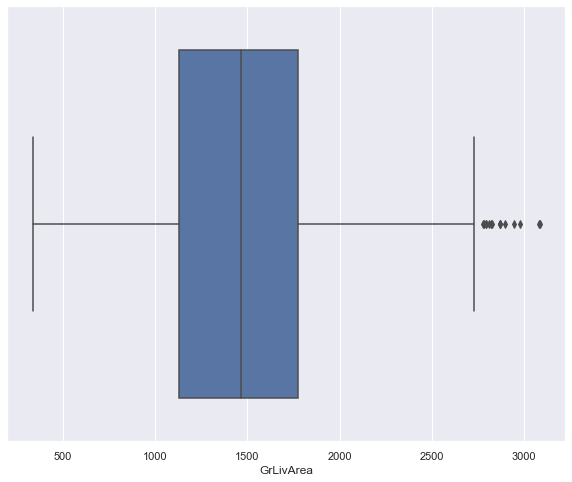

In [485]:
sns.boxplot(df_train.GrLivArea)

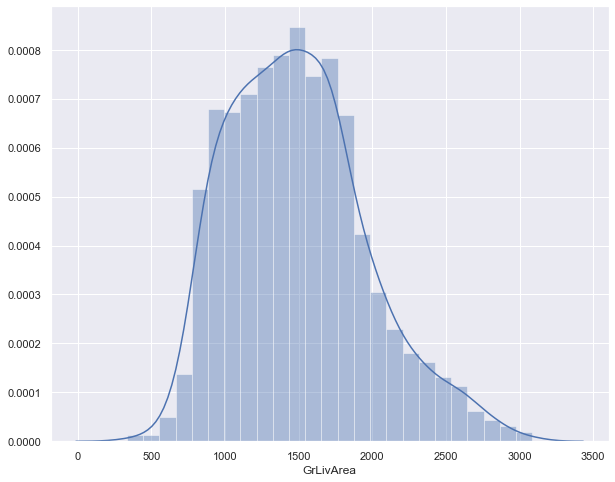

In [486]:
sns.distplot(df_train.GrLivArea)

## 62) GarageArea: Size of garage in square feet

In [487]:
det_outlier(df_train.GarageArea)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---',
 2392,
 3206,
 3094,
 3200,
 3138,
 2444,
 2524,
 2396,
 6110,
 2633,
 '---/---',
 2392,
 2402,
 3228,
 3138,
 2515,
 2444,
 2364,
 2898,
 2524,
 2411,
 4692,
 2633,
 '---/---',
 1818,
 1872,
 1796,
 2065,
 '---/---',
 3222,
 3608,
 3112,
 3493,
 3228,
 4676,
 3194,
 3395,
 4316,
 3279,
 3140,
 3627,
 4476,
 3447,
 5642,
 3238,
 '---/---',
 1166,
 1390,
 1134,
 1220,
 1248,
 1356,
 1418,
 '---/---']

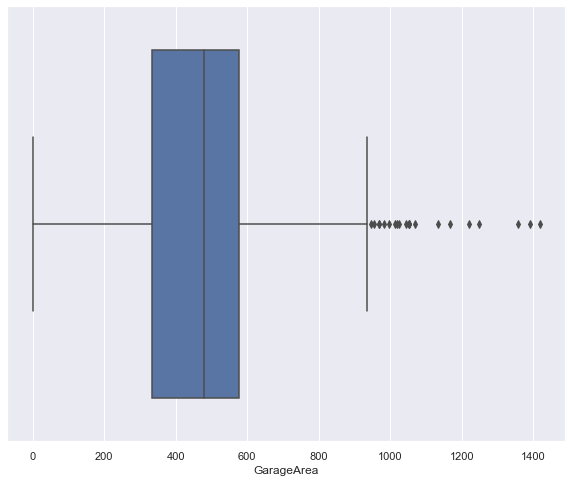

In [488]:
sns.boxplot(df_train.GarageArea)

In [489]:
np.quantile(df_train.GarageArea, 0.75)

576.0

In [490]:
rep(df_train.GarageArea,1134,576)

0       548
1       460
2       608
3       642
4       836
       ... 
1455    460
1456    500
1457    252
1458    240
1459    276
Name: GarageArea, Length: 1460, dtype: int64

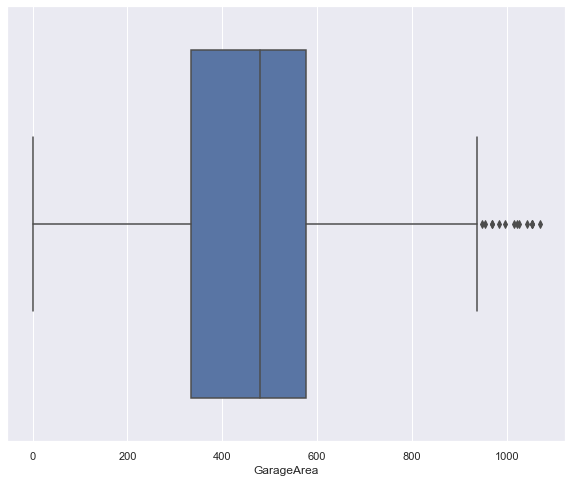

In [491]:
sns.boxplot(df_train.GarageArea)

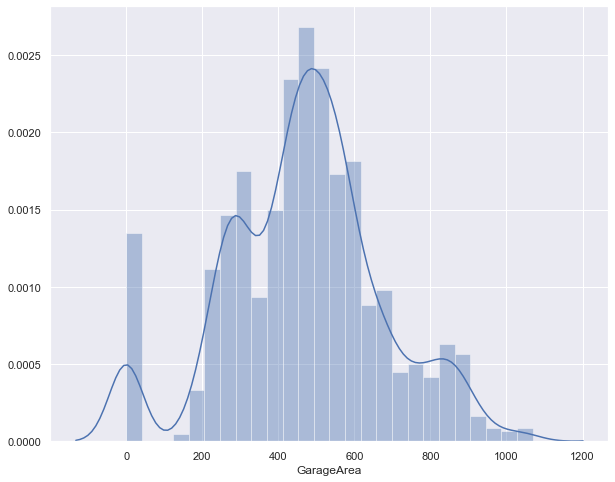

In [492]:
sns.distplot(df_train.GarageArea)

## 66) WoodDeckSF: Wood deck area in square feet

In [493]:
det_outlier(df_train.WoodDeckSF)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---',
 2392,
 3206,
 3094,
 3200,
 3138,
 2444,
 2524,
 2396,
 6110,
 2633,
 '---/---',
 2392,
 2402,
 3228,
 3138,
 2515,
 2444,
 2364,
 2898,
 2524,
 2411,
 4692,
 2633,
 '---/---',
 1818,
 1872,
 1796,
 2065,
 '---/---',
 3222,
 3608,
 3112,
 3493,
 3228,
 4676,
 3194,
 3395,
 4316,
 3279,
 3140,
 3627,
 4476,
 3447,
 5642,
 3238,
 '---/---',
 1166,
 1390,
 1134,
 1220,
 1248,
 1356,
 1418,
 '---/---',
 857,
 5

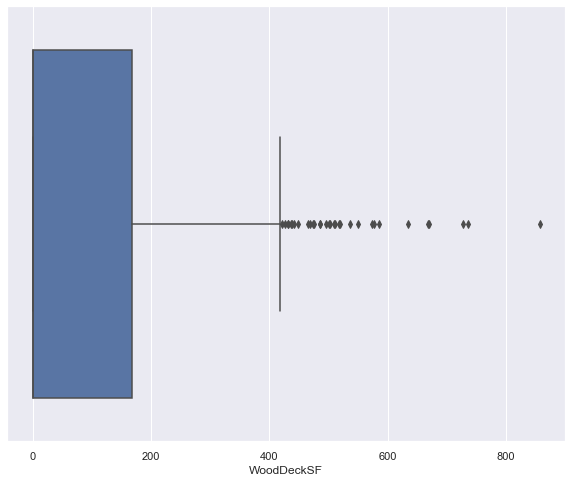

In [494]:
sns.boxplot(df_train.WoodDeckSF)

In [495]:
np.quantile(df_train.WoodDeckSF, 0.75)

168.0

In [496]:
rep(df_train.WoodDeckSF,474,168)

0         0
1       298
2         0
3         0
4       192
       ... 
1455      0
1456    349
1457      0
1458    366
1459    168
Name: WoodDeckSF, Length: 1460, dtype: int64

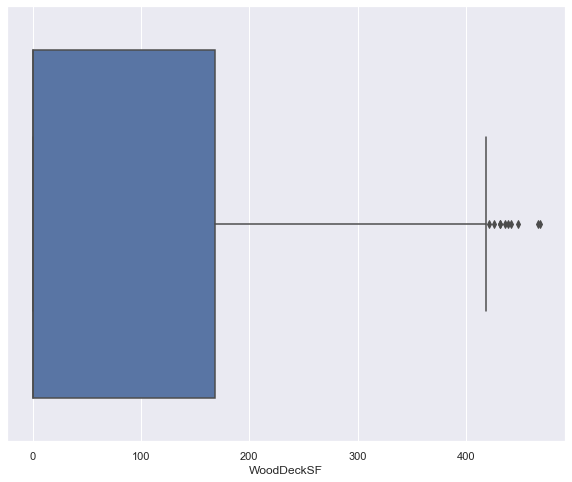

In [497]:
sns.boxplot(df_train.WoodDeckSF)

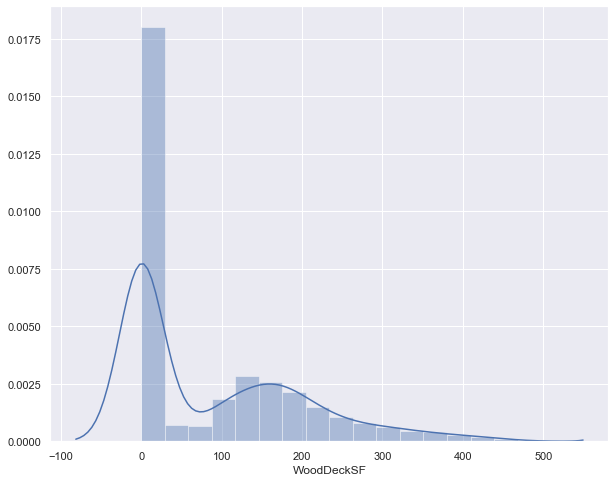

In [498]:
sns.distplot(df_train.WoodDeckSF)

## 67) OpenPorchSF: Open porch area in square feet

In [499]:
det_outlier(df_train.OpenPorchSF)

[141.0,
 174.0,
 174.0,
 140.0,
 150.0,
 137.0,
 144.0,
 149.0,
 313.0,
 168.0,
 182.0,
 138.0,
 160.0,
 152.0,
 313.0,
 153.0,
 '---/---',
 50271,
 159000,
 215245,
 164660,
 53107,
 70761,
 53227,
 46589,
 115149,
 53504,
 45600,
 63887,
 57200,
 '---/---',
 650.0,
 1031.0,
 1115.0,
 768.0,
 1129.0,
 664.0,
 653.0,
 748.0,
 922.0,
 1600.0,
 870.0,
 650.0,
 772.0,
 921.0,
 762.0,
 660.0,
 1170.0,
 651.0,
 894.0,
 673.0,
 860.0,
 1047.0,
 816.0,
 760.0,
 975.0,
 660.0,
 1378.0,
 766.0,
 788.0,
 796.0,
 705.0,
 731.0,
 '---/---',
 1880,
 1904,
 2260,
 2188,
 2096,
 5644,
 '---/---',
 2392,
 3206,
 3094,
 3200,
 3138,
 2444,
 2524,
 2396,
 6110,
 2633,
 '---/---',
 2392,
 2402,
 3228,
 3138,
 2515,
 2444,
 2364,
 2898,
 2524,
 2411,
 4692,
 2633,
 '---/---',
 1818,
 1872,
 1796,
 2065,
 '---/---',
 3222,
 3608,
 3112,
 3493,
 3228,
 4676,
 3194,
 3395,
 4316,
 3279,
 3140,
 3627,
 4476,
 3447,
 5642,
 3238,
 '---/---',
 1166,
 1390,
 1134,
 1220,
 1248,
 1356,
 1418,
 '---/---',
 857,
 5

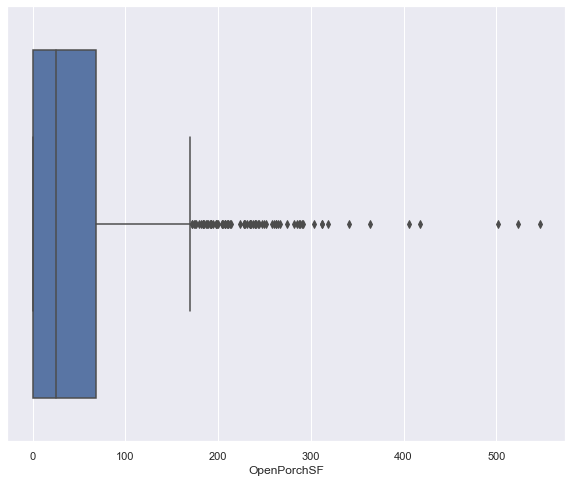

In [500]:
sns.boxplot(df_train.OpenPorchSF)

In [501]:
np.quantile(df_train.OpenPorchSF,0.75)

68.0

In [502]:
rep(df_train.OpenPorchSF,247,68)

0       61
1        0
2       42
3       35
4       84
        ..
1455    40
1456     0
1457    60
1458     0
1459    68
Name: OpenPorchSF, Length: 1460, dtype: int64

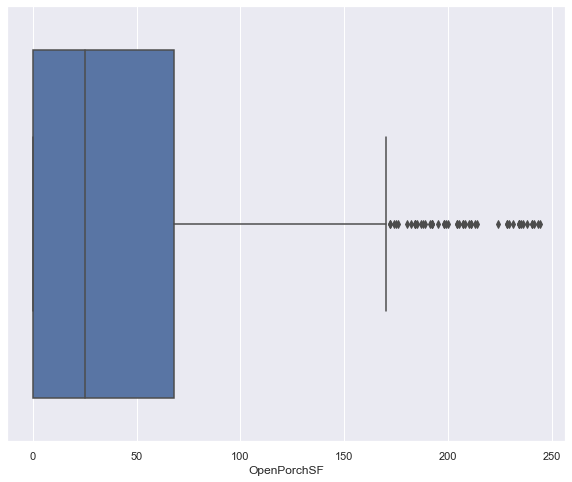

In [503]:
sns.boxplot(df_train.OpenPorchSF)

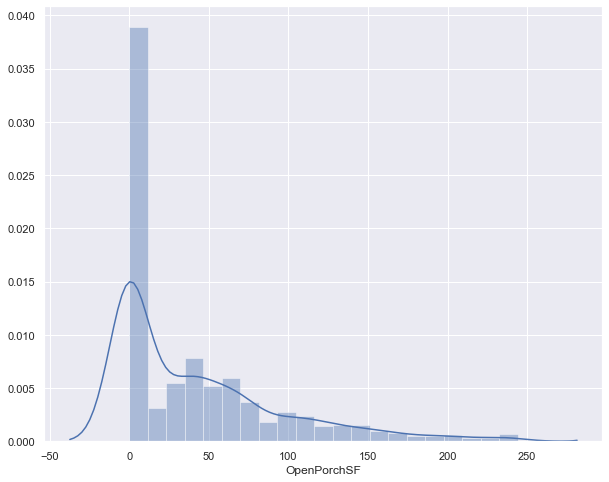

In [504]:
sns.distplot(df_train.OpenPorchSF)

# FEATURE SELECTION

## Filter Method

    - Correlatoin Matrix
    
## Wrapper Method

    - Forward Feature Selection

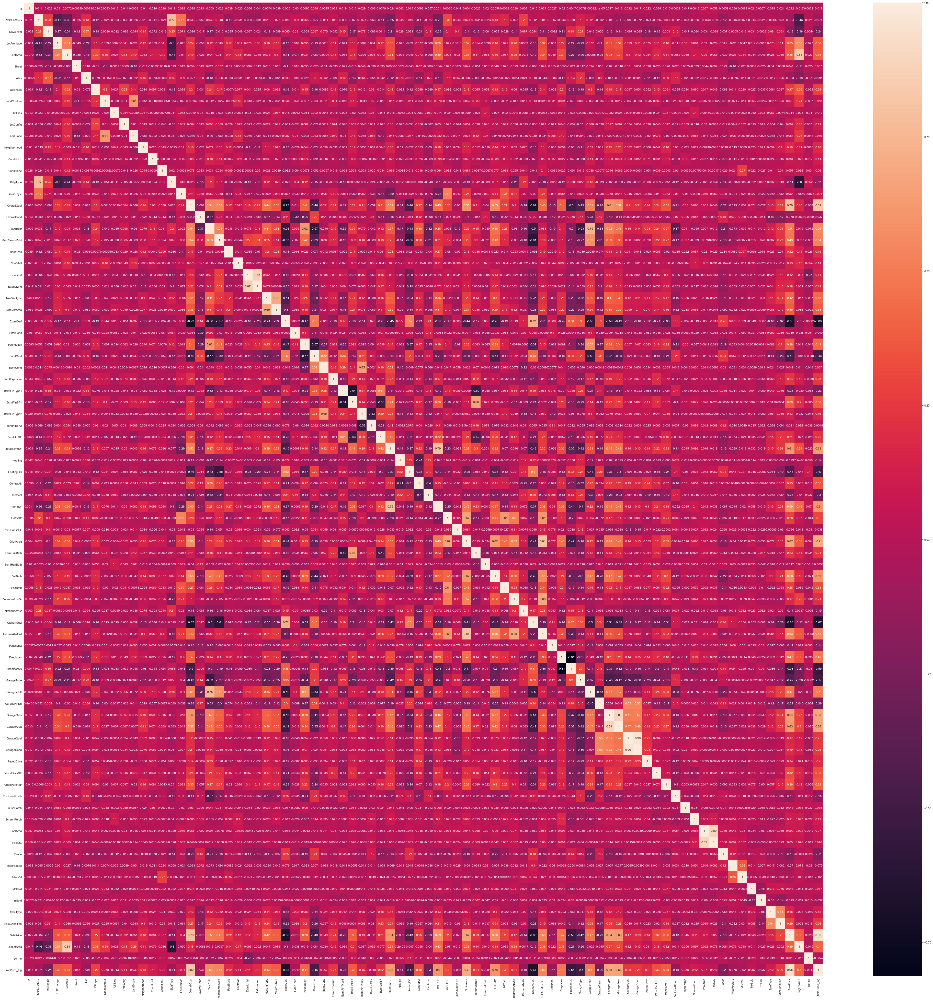

In [505]:
sns.set(rc={'figure.figsize':(70,70)})
cr = df_train.corr()
sns.heatmap(cr,annot=True)

In [506]:
cat=df_train.corr()
cat['SalePrice_log']

Id              -0.017942
MSSubClass      -0.073959
MSZoning        -0.237854
LotFrontage      0.364819
LotArea          0.378632
                   ...   
SaleCondition    0.256611
SalePrice        0.948374
LogLotArea       0.399918
ext_no          -0.004725
SalePrice_log    1.000000
Name: SalePrice_log, Length: 84, dtype: float64

In [507]:
cor=[]
pig=[]
sor=df_train.corr()
for i in sor['SalePrice_log']:
    if i >= 0.3 or i <= -0.3:
        cor.append(i)
for j in cor:
    saj= sor.index[sor['SalePrice_log']==j]
    pig.append(saj)

In [508]:
apple= df_train.loc[:,['LotFrontage','LogLotArea','OverallQual','YearRemodAdd','MasVnrType','MasVnrArea','ExterQual','Foundation','BsmtQual','BsmtFinSF1','TotalBsmtSF',
                   'HeatingQC','CentralAir','Electrical','1stFlrSF', '2ndFlrSF','GrLivArea','FullBath','KitchenQual','TotRmsAbvGrd',
                   'Fireplaces','FireplaceQu','GarageType','GarageCars','WoodDeckSF','OpenPorchSF']]
orange=df_train.loc[:,'SalePrice_log']

In [509]:
df_train.OverallQual.value_counts()

5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64

# OneHotEncoding

In [510]:
oh_encod=OneHotEncoder()
grapes=oh_encod.fit_transform(apple.loc[:,['OverallQual','YearRemodAdd','MasVnrType','ExterQual','BsmtQual','HeatingQC','CentralAir','Electrical','KitchenQual','FireplaceQu','GarageType','Foundation','FullBath','TotRmsAbvGrd','Fireplaces','GarageCars']]).toarray()

In [511]:
grapes = pd.DataFrame(grapes)
grapes

,0,1,2,3,4,5,6,7,8,9,...,77,78,79,80,81,82,83,84,85,86
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1456,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1457,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1458,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [512]:
apple.drop(columns=['OverallQual','YearRemodAdd','MasVnrType','ExterQual','BsmtQual','HeatingQC','CentralAir','Electrical','KitchenQual','FireplaceQu','GarageType','Foundation','FullBath','TotRmsAbvGrd','Fireplaces','GarageCars'],axis=1,inplace=True)

In [513]:
lion=pd.concat([apple,grapes],axis=1)
deer=lion
deer

,LotFrontage,LogLotArea,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,WoodDeckSF,OpenPorchSF,...,77,78,79,80,81,82,83,84,85,86
0,65.0,9.041922,196.0,706.0,856.0,856.0,854,1710.0,0,61,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,80.0,9.169518,0.0,978.0,1262.0,1262.0,0,1262.0,298,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,68.0,9.328123,162.0,486.0,920.0,920.0,866,1786.0,0,42,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,60.0,9.164296,0.0,216.0,756.0,961.0,756,1717.0,0,35,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,84.0,9.565214,350.0,655.0,1145.0,1145.0,1053,2198.0,192,84,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,8.976768,0.0,0.0,953.0,953.0,694,1647.0,0,40,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1456,85.0,9.486076,119.0,790.0,1542.0,2073.0,0,2073.0,349,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1457,66.0,9.109636,0.0,275.0,1152.0,1188.0,1152,2340.0,0,60,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1458,68.0,9.181632,0.0,49.0,1078.0,1078.0,0,1078.0,366,0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


# BackWard Selection

In [514]:
sd_42=StandardScaler()
bird=sd_42.fit_transform(deer)
bird=pd.DataFrame(bird)

In [515]:
dog = sm.add_constant(bird)
result12 = sm.OLS(orange,dog).fit()
result12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          SalePrice_log   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.886
Method:                 Least Squares   F-statistic:                     144.9
Date:                Sun, 12 Apr 2020   Prob (F-statistic):               0.00
Time:                        16:16:43   Log-Likelihood:                 895.94
No. Observations:                1460   AIC:                            -1632.
Df Residuals:                    1380   BIC:                            -1209.
Df Model:                          79                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.0241      0.004   3409.846      0.000      12.017      12.031
0              0.0035      0.005      0.734      0.463      -0.006       0.013
1              0.0427      0.005      8.524      0.000       0.033       0.053
2              0.0026      0.006      0.427      0.670      -0.009       0.014
3              0.0454      0.004     10.360      0.000       0.037       0.054
4              0.0388      0.010      4.085      0.000       0.020       0.057
5              0.0378      0.012      3.202      0.001       0.015       0.061
6              0.0499      0.012      4.091      0.000       0.026       0.074
7              0.0509      0.013      3.955      0.000       0.026       0.076
8              0.0103      0.004      2.638      0.008       0.003       0.018
9              0.0123      0.004      3.052      0.002       0.004       0.020
10            -0.0083      0.006     -1.450      0.147      -0.020       0.003
11            -0.0210      0.004     -5.382      0.000      -0.029      -0.013
12            -0.0323      0.004     -8.458      0.000      -0.040      -0.025
13            -0.0389      0.004     -9.641      0.000      -0.047      -0.031
14            -0.0308      0.004     -7.991      0.000      -0.038      -0.023
15            -0.0054      0.003     -1.707      0.088      -0.012       0.001
16             0.0210      0.004      5.768      0.000       0.014       0.028
17             0.0432      0.004      9.823      0.000       0.035       0.052
18             0.0356      0.005      6.923      0.000       0.026       0.046
19             0.0282      0.005      5.921      0.000       0.019       0.038
20            -0.0186      0.004     -5.235      0.000      -0.026      -0.012
21            -0.0072      0.004     -2.041      0.041      -0.014      -0.000
22             0.0046      0.003      1.403      0.161      -0.002       0.011
23             0.0182      0.003      5.457      0.000       0.012       0.025
24             0.0033      0.003      0.962      0.336      -0.003       0.010
25            -0.0068      0.004     -1.864      0.063      -0.014       0.000
26            -0.0007      0.003     -0.234      0.815      -0.007       0.005
27            -0.0021      0.004     -0.583      0.560      -0.009       0.005
28             0.0055      0.005      1.117      0.264      -0.004       0.015
29             0.0061      0.003      1.852      0.064      -0.000       0.013
30            -0.0064      0.003     -1.843      0.066      -0.013       0.000
31            -0.0084      0.004     -1.917      0.055      -0.017       0.000
32          6.791e-05      0.007      0.010      0.992      -0.014       0.014
33             0.0118      0.005      2.465      0.014       0.002       0.021
34             0.0085      0.003      2.566      0.010       0.002       0.015
35

In [516]:
bird.drop(columns=[2,10,15,22,24,26,27,28,32,38,40,41,44,45,46,47,50,52,53,55,56,60,66,67,68,69,71,72,73,75,76,77,78,80,81,82,83,86,88,93],axis=1,inplace=True)

In [517]:
bird.drop(columns=[0,25,29,30,33,34,35,36,39,54,59,61,63,70,79,95],axis=1,inplace=True)

In [518]:
dog = sm.add_constant(bird)
result12 = sm.OLS(orange,dog).fit()
result12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          SalePrice_log   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     271.3
Date:                Sun, 12 Apr 2020   Prob (F-statistic):               0.00
Time:                        16:16:44   Log-Likelihood:                 809.46
No. Observations:                1460   AIC:                            -1541.
Df Residuals:                    1421   BIC:                            -1335.
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.0241      0.004   3261.144      0.000      12.017      12.031
1              0.0446      0.004      9.944      0.000       0.036       0.053
3              0.0474      0.004     10.859      0.000       0.039       0.056
4              0.0502      0.007      7.310      0.000       0.037       0.064
5              0.0411      0.011      3.768      0.000       0.020       0.063
6              0.0562      0.012      4.782      0.000       0.033       0.079
7              0.0431      0.013      3.387      0.001       0.018       0.068
8              0.0129      0.004      3.207      0.001       0.005       0.021
9              0.0154      0.004      3.754      0.000       0.007       0.023
11            -0.0208      0.004     -5.386      0.000      -0.028      -0.013
12            -0.0268      0.004     -6.705      0.000      -0.035      -0.019
13            -0.0373      0.005     -8.202      0.000      -0.046      -0.028
14            -0.0290      0.005     -5.726      0.000      -0.039      -0.019
16             0.0391      0.005      7.743      0.000       0.029       0.049
17             0.0682      0.005     13.127      0.000       0.058       0.078
18             0.0570      0.005     11.137      0.000       0.047       0.067
19             0.0455      0.004     10.286      0.000       0.037       0.054
20            -0.0325      0.006     -5.294      0.000      -0.045      -0.020
21            -0.0148      0.005     -2.686      0.007      -0.026      -0.004
23             0.0160      0.006      2.526      0.012       0.004       0.028
31            -0.0135      0.004     -3.314      0.001      -0.021      -0.006
37             0.0193      0.005      4.080      0.000       0.010       0.029
42            -0.0178      0.002     -8.150      0.000      -0.022      -0.014
43             0.0178      0.002      8.150      0.000       0.014       0.022
48            -0.0129      0.004     -3.486      0.001      -0.020      -0.006
49             0.0146      0.005      2.931      0.003       0.005       0.024
51            -0.0184      0.005     -3.473      0.001      -0.029      -0.008
57            -0.0123      0.003     -4.623      0.000      -0.018      -0.007
58            -0.0028      0.004     -0.721      0.471      -0.010       0.005
62             0.0023      0.004      0.529      0.597      -0.006       0.011
64            -0.0138      0.005     -2.997      0.003      -0.023      -0.005
65            -0.0175      0.002     -8.018      0.000      -0.022      -0.013
74             0.0057      0.005      1.109      0.268      -0.004       0.016
84             0.0107      0.004      2.630      0.009       0.003       0.019
85            -0.0008      0.004     -0.204      0.838      -0.009       0.007
87             0.0052      0.004      1.311      0.190      -0.003       0.013
89

# Split data into train and test set

In [519]:
x_human,x_rat,y_human,y_rat=train_test_split(bird,orange,test_size=0.2,random_state=42)

# Check Regression Assumption

## No Multicolinearity 

- Multicollinearity is a state of very high intercorrelations or inter-associations among the independent variables. It is therefore a type of disturbance in the data, and if present in the data the statistical inferences made about the data may not be reliable.
    
- check the variance inflation factor (1/1-R^2) if feature has vif score is greater than 5 that does mean that feature has multicolinearity.

In [520]:
vif = [variance_inflation_factor(x_human.values, i) for i in range(x_human.shape[1])]
pd.DataFrame({'vif': vif},index=x_human.columns)

C:\Users\hp\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,vif
1,1.511943
3,1.382959
4,3.563910
5,9.316459
6,10.523085
7,11.821557
8,1.206841
9,1.253767
11,1.036106
12,1.153552


In [521]:
for i in range(0,len(x_human.columns)):
    a = x_human.loc[:,x_human.columns[i]]
    model = sm.OLS(y_human,a)
    results = model.fit()
    rsq = results.rsquared
    vif = round(1/(1-rsq),2)
    print('R-Squared value of {} column is {} keeping all other columns as feature'.format(x_human.columns[i],round(rsq,2)))
    print('vif of {} column is {} \n'.format(x_human.columns[i], vif))
    

R-Squared value of 1 column is 0.0 keeping all other columns as feature
vif of 1 column is 1.0 

R-Squared value of 3 column is 0.0 keeping all other columns as feature
vif of 3 column is 1.0 

R-Squared value of 4 column is 0.0 keeping all other columns as feature
vif of 4 column is 1.0 

R-Squared value of 5 column is 0.0 keeping all other columns as feature
vif of 5 column is 1.0 

R-Squared value of 6 column is 0.0 keeping all other columns as feature
vif of 6 column is 1.0 

R-Squared value of 7 column is 0.0 keeping all other columns as feature
vif of 7 column is 1.0 

R-Squared value of 8 column is 0.0 keeping all other columns as feature
vif of 8 column is 1.0 

R-Squared value of 9 column is 0.0 keeping all other columns as feature
vif of 9 column is 1.0 

R-Squared value of 11 column is 0.0 keeping all other columns as feature
vif of 11 column is 1.0 

R-Squared value of 12 column is 0.0 keeping all other columns as feature
vif of 12 column is 1.0 

R-Squared value of 13 colu

# Normality of Residual 

- Error should be normal distribution
- it can be checked by plotting histogram 

In [522]:
lr = LinearRegression()
lr.fit(x_human,y_human)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [523]:
y_pred = lr.predict(x_rat)

In [524]:
residual = y_rat - y_pred

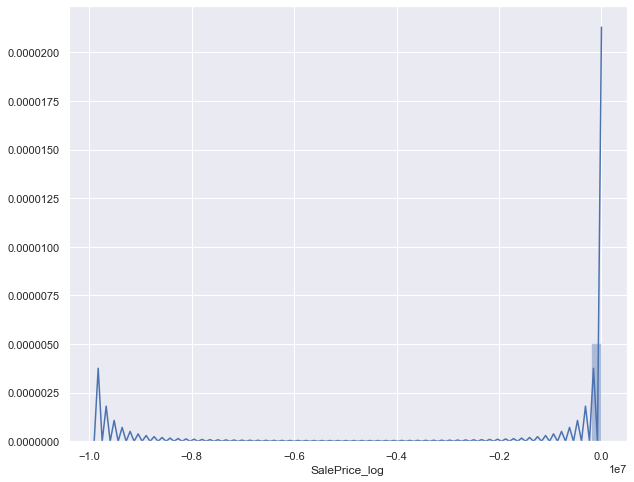

In [525]:
sns.set(rc={'figure.figsize':(10,8)})
sns.distplot(residual)

# Homoscedasticity

- Error should have equal variance 
- it can be checked by plotting scatter if more data point around 0 that does mean residuals have equal variance

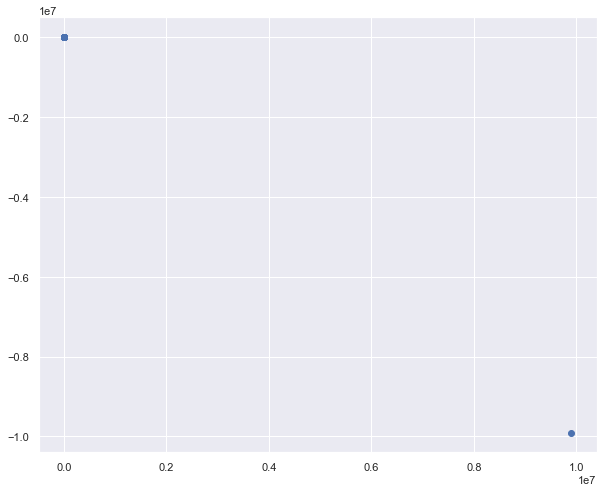

In [526]:
plt.scatter(x=y_pred,y=residual)

## No Autocorrelation of Residual

- Error shouldn't be correlated
- detection autocorrelation draw graph and look for point go beyond the blue area or Durbin-Watson test
- it is range b/w 0 to 4
- 2 means no autocorrelation 
- either value is less than 1 or greater than 3 that does mean residuals have autocorrelation

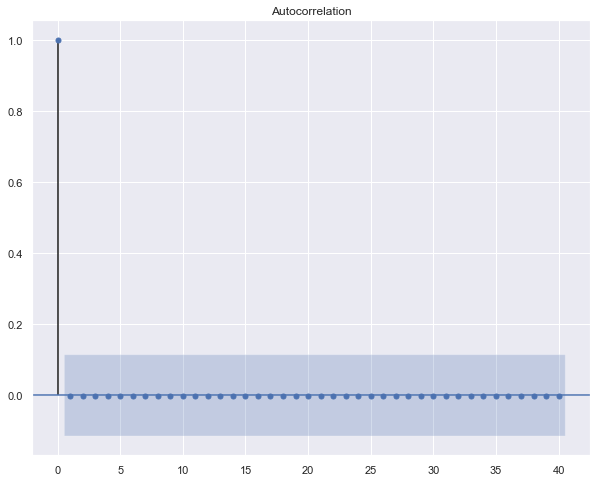

In [527]:
acf = smt.graphics.plot_acf(residual,lags=40,alpha=0.05)

In [528]:
x_check = x_human
y_check = y_human

x_check = sm.add_constant(x_check)
result222=sm.OLS(y_check,x_check).fit()
result222.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          SalePrice_log   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                     221.3
Date:                Sun, 12 Apr 2020   Prob (F-statistic):               0.00
Time:                        16:16:46   Log-Likelihood:                 673.34
No. Observations:                1168   AIC:                            -1271.
Df Residuals:                    1130   BIC:                            -1078.
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
1              0.0442      0.005      8.869      0.000       0.034       0.054
3              0.0471      0.005      9.911      0.000       0.038       0.056
4              0.0448      0.008      5.838      0.000       0.030       0.060
5              0.0462      0.012      3.755      0.000       0.022       0.070
6              0.0622      0.013      4.783      0.000       0.037       0.088
7              0.0404      0.014      2.848      0.004       0.013       0.068
8              0.0116      0.004      2.627      0.009       0.003       0.020
9              0.0174      0.004      3.916      0.000       0.009       0.026
11            -0.0168      0.006     -2.640      0.008      -0.029      -0.004
12            -0.0292      0.004     -6.712      0.000      -0.038      -0.021
13            -0.0338      0.005     -6.740      0.000      -0.044      -0.024
14            -0.0284      0.006     -5.128      0.000      -0.039      -0.018
16             0.0368      0.005      6.708      0.000       0.026       0.048
17             0.0707      0.006     12.407      0.000       0.060       0.082
18             0.0545      0.006      9.847      0.000       0.044       0.065
19             0.0424      0.005      8.421      0.000       0.033       0.052
20            -0.0333      0.007     -4.986      0.000      -0.046      -0.020
21            -0.0174      0.006     -2.844      0.005      -0.029      -0.005
23             0.0174      0.007      2.492      0.013       0.004       0.031
31            -0.0122      0.005     -2.700      0.007      -0.021      -0.003
37             0.0195      0.005      3.689      0.000       0.009       0.030
42            -0.0175      0.002     -7.585      0.000      -0.022      -0.013
43             0.0175      0.002      7.585      0.000       0.013       0.022
48          -459.2933      0.155  -2958.322      0.000    -459.598    -458.989
49             0.0157      0.006      2.797      0.005       0.005       0.027
51            -0.0158      0.006     -2.705      0.007      -0.027      -0.004
57            -0.0109      0.003     -3.744      0.000      -0.017      -0.005
58            -0.0061      0.004     -1.459      0.145      -0.014       0.002
62             0.0005      0.005      0.117      0.907      -0.008       0.010
64            -0.0160      0.005     -3.185      0.001      -0.026      -0.006
65            -0.0207      0.002     -8.502      0.000      -0.025      -0.016
74             0.0027      0.006      0.469      0.639      -0.008       0.014
84             0.0095      0.004      2.129      0.033       0.001       0.018
85            -0.0068      0.004     -1.540      0.124      -0.016       0.002
87             0.0052      0.004      1.296      0.195      -0.003       0.013
89             0.0055      0.003      2.064      0.039       0.000       0.011
90

In [529]:
def rm(f,o):
    a= f.sum()
    b= o.sum()
    error = a - b    
    error_sq = np.square(error)
    m_e_s= error_sq/len(f)
    rmse = np.sqrt(m_e_s)
    rmsle = round(np.sqrt(mean_squared_log_error(f,o)),4)
    return 'RMSLE={}, RMSE = {}, MSE = {}, Error = {}'.format(rmsle,rmse,m_e_s,error)

# Random Forest

In [530]:
kite= RandomForestRegressor(n_estimators=140)
kite.fit(x_human,y_human)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=140, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [531]:
k_pred=kite.predict(x_rat)

In [532]:
rm(y_rat,k_pred)

'RMSLE=0.0134, RMSE = 0.10917150718221595, MSE = 0.011918417980436628, Error = -1.8655235324936257'

# gboost

In [533]:
chess= GradientBoostingRegressor(n_estimators=100,criterion='mse')
chess.fit(x_human,y_human)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [534]:
c_p=chess.predict(x_rat)

In [535]:
rm(y_rat,c_p)

'RMSLE=0.0123, RMSE = 0.12651651413611303, MSE = 0.01600642834915329, Error = -2.1619151412469364'

In [536]:
ludo = Lars()
ludo.fit(x_human,y_human)

C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\_least_angle.py:582: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 8 iterations, i.e. alpha=2.555e-03, with an active set of 8 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
  ConvergenceWarning)
C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\_least_angle.py:582: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=1.494e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
  ConvergenceWarning)
C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\_least_angle.py:582: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=1.494e-03, with an active set of 13 regressors, and the smallest cholesky pivot e

Lars(copy_X=True, eps=2.220446049250313e-16, fit_intercept=True, fit_path=True,
     n_nonzero_coefs=500, normalize=True, precompute='auto', verbose=False)

In [537]:
ludo_p = ludo.predict(x_rat)

In [538]:
rm(y_rat,ludo_p)

'RMSLE=0.0269, RMSE = 0.17172040635332222, MSE = 0.029487897958150107, Error = -2.934359590060467'

# Elastic Net

In [539]:
video= ElasticNet()
video.fit(x_human,y_human)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [540]:
en_p=video.predict(x_rat)

In [541]:
rm(y_rat,en_p)

'RMSLE=0.0334, RMSE = 0.5639881676965202, MSE = 0.3180826533016782, Error = -9.637434034227681'

# bayes regression

In [542]:
ball=  BayesianRidge()
ball.fit(x_human,y_human)

BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, alpha_init=None,
              compute_score=False, copy_X=True, fit_intercept=True,
              lambda_1=1e-06, lambda_2=1e-06, lambda_init=None, n_iter=300,
              normalize=False, tol=0.001, verbose=False)

In [543]:
ball_p=ball.predict(x_rat)

In [544]:
rm(y_rat,ball_p)

'RMSLE=0.0122, RMSE = 0.038266659687844616, MSE = 0.0014643372436653123, Error = -0.6539009673874716'

## Polynomial Regression

In [545]:
poly_r = PolynomialFeatures(degree=2)
x_poly = poly_r.fit_transform(x_human)
poly_r.fit(x_poly,y_human)
x_p_train,x_p_test,y_p_train,y_p_test=train_test_split(x_poly,y_human,test_size=0.2,random_state=42)


In [546]:
lr2 = LinearRegression()
lr2.fit(x_p_train,y_p_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [547]:
p_pred = lr2.predict(x_p_test)

# Xgboost

In [548]:
xgb = XGBRegressor(n_estimators=150)
xgb.fit(x_human,y_human)

XGBRegressor(base_score=0.5, booster=None, colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints=None,
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=150, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
             validate_parameters=False, verbosity=None)

In [549]:
pred_x = xgb.predict(x_rat)

In [550]:
rm(y_rat,pred_x)

'RMSLE=0.0133, RMSE = 0.1581355125033366, MSE = 0.025006840314692923, Error = -2.70222082219243'

In [551]:
y_rat.sum()

3503.3129158965576

In [552]:
pred_x.sum()

3506.0151

# stack Regression

In [553]:
estimators=[('gboost',chess),('Random',kite),('bayes',ball)]
st = StackingRegressor(estimators=estimators,final_estimator=xgb)
st.fit(x_human,y_human)

StackingRegressor(cv=None,
                  estimators=[('gboost',
                               GradientBoostingRegressor(alpha=0.9,
                                                         ccp_alpha=0.0,
                                                         criterion='mse',
                                                         init=None,
                                                         learning_rate=0.1,
                                                         loss='ls', max_depth=3,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                  

In [554]:
pre_st = st.predict(x_rat)

In [555]:
rm(y_rat,pre_st)

'RMSLE=0.0132, RMSE = 0.056567456422124164, MSE = 0.0031998771260689164, Error = -0.9666251190674302'

In [556]:
(y_rat.sum(),pre_st.sum())

(3503.3129158965576, 3504.2795)

# Deep Neural Network

In [557]:
# Intialize NN
#model=Sequential()

# Input layer
#model.add(Dense(36,kernel_initializer='normal',input_dim=x_train_3.shape[1],activation='relu'))

# Hidden layers
#model.add(Dropout(0.5))
#model.add(Dense(128,kernel_initializer='normal',activation='relu'))
#model.add(Dense(128,kernel_initializer='normal',activation='relu'))
#model.add(Dense(128,kernel_initializer='normal',activation='relu'))



# Output Layer
#model.add(Dense(1,kernel_initializer='normal',activation='linear'))

# Compile the Network
#model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])

In [558]:
# define callback function
#checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
#checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
#callbacks_list = [checkpoint]

In [559]:
#model.fit(final_x7,y_df, epochs=1000, batch_size=32, validation_split = 0.2, callbacks=callbacks_list)

In [560]:
#wights_file = 'Weights-462--0.09010.hdf5'
#model.load_weights(wights_file)
#model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])

In [561]:
#nn_p = model.predict(x_test_3)

In [562]:
#nn_p_1=nn_p.reshape((292,))
#np.exp(nn_p_1)

In [563]:
#math.sqrt(mean_squared_error(y_test_3,nn_p_1))

# TEST DATA

In [564]:
df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [565]:
test_x=df_test.loc[:,:]
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal


In [566]:
test_x['LogLotArea'] = np.log(test_x['LotArea'])

In [567]:
banana=test_x.loc[:,['LotFrontage','LogLotArea','OverallQual','YearRemodAdd','MasVnrType','MasVnrArea','ExterQual','Foundation','BsmtQual','BsmtFinSF1','TotalBsmtSF',
                   'HeatingQC','CentralAir','Electrical','1stFlrSF', '2ndFlrSF','GrLivArea','FullBath','KitchenQual','TotRmsAbvGrd',
                   'Fireplaces','FireplaceQu','GarageType','GarageCars','WoodDeckSF','OpenPorchSF']]

In [568]:
banana.isnull().sum()

LotFrontage     227
LogLotArea        0
OverallQual       0
YearRemodAdd      0
MasVnrType       16
MasVnrArea       15
ExterQual         0
Foundation        0
BsmtQual         44
BsmtFinSF1        1
TotalBsmtSF       1
HeatingQC         0
CentralAir        0
Electrical        0
1stFlrSF          0
2ndFlrSF          0
GrLivArea         0
FullBath          0
KitchenQual       1
TotRmsAbvGrd      0
Fireplaces        0
FireplaceQu     730
GarageType       76
GarageCars        1
WoodDeckSF        0
OpenPorchSF       0
dtype: int64

In [569]:
df_train['OverallQual'].value_counts()

5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64

In [570]:
banana['OverallQual'].value_counts()

5     428
6     357
7     281
8     174
4     110
9      64
3      20
10     13
2      10
1       2
Name: OverallQual, dtype: int64

In [571]:
lk=[]

for j in banana['OverallQual']:
    if j not in df_train['OverallQual']:
        lk.append(j)

In [572]:
lk

[]

In [573]:
k=[]

for j in banana['YearRemodAdd']:
    if j not in df_train['YearRemodAdd']:
        lk.append(j)

In [574]:
banana.loc[banana['YearRemodAdd']<=1965,'YearRemodAdd'] = 0
banana.loc[(banana['YearRemodAdd']>1965)&(banana['YearRemodAdd']<=1980),'YearRemodAdd'] = 1
banana.loc[(banana['YearRemodAdd']>1980)&(banana['YearRemodAdd']<=1995),'YearRemodAdd'] = 2
banana.loc[(banana['YearRemodAdd']>1995)&(banana['YearRemodAdd']<=2010),'YearRemodAdd'] = 3

In [575]:
banana['YearRemodAdd'].value_counts()

3    646
0    391
1    243
2    179
Name: YearRemodAdd, dtype: int64

In [576]:
df_train['YearRemodAdd'].value_counts()

3    679
0    349
1    243
2    189
Name: YearRemodAdd, dtype: int64

In [577]:
mv ={'BrkCmn':1,
'BrkFace':2,
'CBlock':3,
'NaN':0,
'Stone':4}
banana['MasVnrType'] = banana['MasVnrType'].map(mv)

In [578]:
banana['MasVnrType'].fillna(0,inplace=True)

In [579]:
df_train['MasVnrType'].value_counts(dropna=False)

0.0    872
2.0    445
4.0    128
1.0     15
Name: MasVnrType, dtype: int64

In [580]:
banana['MasVnrType'].value_counts(dropna=False)

0.0    894
2.0    434
4.0    121
1.0     10
Name: MasVnrType, dtype: int64

In [581]:
df_train['ExterQual'].value_counts(dropna= False)

3    906
2    488
1     52
4     14
Name: ExterQual, dtype: int64

In [582]:
eq = {'Ex':1, 'Gd':2, 'TA':3, 'Fa':4, 'Po':5}
banana['ExterQual'] = banana['ExterQual'].map(eq)

In [583]:
banana['ExterQual'].value_counts(dropna= False)

3    892
2    491
1     55
4     21
Name: ExterQual, dtype: int64

In [584]:
bq = {'Ex':1,'Gd':2,'TA':3,'Fa':4,'Po':5, 'NaN':0}
banana['BsmtQual'] = banana['BsmtQual'].map(bq)

In [585]:
df_train['BsmtQual'].value_counts(dropna=False)

3.0    649
2.0    618
1.0    121
0.0     37
4.0     35
Name: BsmtQual, dtype: int64

In [586]:
banana['BsmtQual'] = banana['BsmtQual'].fillna(0)

In [587]:
banana['BsmtQual'].value_counts(dropna=False)

3.0    634
2.0    591
1.0    137
4.0     53
0.0     44
Name: BsmtQual, dtype: int64

In [588]:
df_train['HeatingQC'].value_counts(dropna=False)

1    741
3    428
2    241
4     49
5      1
Name: HeatingQC, dtype: int64

In [589]:
qc = {'Ex':1, 'Gd':2, 'TA':3, 'Fa':4, 'Po':5}
banana['HeatingQC'] = banana['HeatingQC'].map(qc)

In [590]:
banana['HeatingQC'].value_counts(dropna=False)

1    752
3    429
2    233
4     43
5      2
Name: HeatingQC, dtype: int64

In [591]:
df_train['CentralAir'].value_counts(dropna = False)

1    1365
0      95
Name: CentralAir, dtype: int64

In [592]:
ca = {'N':0,'Y':1}
banana['CentralAir'] = banana['CentralAir'].map(ca)

In [593]:
banana['CentralAir'].value_counts(dropna = False)

1    1358
0     101
Name: CentralAir, dtype: int64

In [594]:
df_train['Electrical'].value_counts(dropna=False)

0.0    1335
1.0      94
2.0      27
3.0       3
4.0       1
Name: Electrical, dtype: int64

In [595]:
el = {'SBrkr':0,'FuseA':1, 'FuseF':2, 'FuseP':3, 'Mix':4}
banana['Electrical'] = banana['Electrical'].map(el)

In [596]:
banana['Electrical'].value_counts(dropna=False)

0    1337
1      94
2      23
3       5
Name: Electrical, dtype: int64

In [597]:
banana['Electrical'] = banana['Electrical'].fillna(0)

In [598]:
banana['Electrical'].value_counts(dropna=False)

0    1337
1      94
2      23
3       5
Name: Electrical, dtype: int64

In [599]:
df_train['KitchenQual'].value_counts(dropna=False)

2    735
1    586
0    100
3     39
Name: KitchenQual, dtype: int64

In [600]:
kq = {'Ex':0,'Gd':1,'TA':2,'Fa':3,'Po':4}
banana['KitchenQual'] = banana['KitchenQual'].map(kq)

In [601]:
banana['KitchenQual'].value_counts(dropna=False)

2.0    757
1.0    565
0.0    105
3.0     31
NaN      1
Name: KitchenQual, dtype: int64

In [602]:
banana['KitchenQual'] = banana['KitchenQual'].fillna(2)

In [603]:
df_train['FireplaceQu'].value_counts(dropna=False)

5.0    690
2.0    380
3.0    313
4.0     33
1.0     24
6.0     20
Name: FireplaceQu, dtype: int64

In [604]:
fpq = {'NaN':5,'Ex':1,'Gd':2, 'TA':3, 'Fa':4,'Po':6} 
banana['FireplaceQu'] = banana['FireplaceQu'].map(fpq)

In [605]:
banana['FireplaceQu'].value_counts(dropna=False)

NaN    730
2.0    364
3.0    279
4.0     41
6.0     26
1.0     19
Name: FireplaceQu, dtype: int64

In [606]:
banana['FireplaceQu'] = banana['FireplaceQu'].fillna(5)

In [607]:
banana['FireplaceQu'].value_counts(dropna=False)

5.0    730
2.0    364
3.0    279
4.0     41
6.0     26
1.0     19
Name: FireplaceQu, dtype: int64

In [608]:
banana['GarageType'].value_counts(dropna=False)

Attchd     853
Detchd     392
BuiltIn     98
NaN         76
Basment     17
2Types      17
CarPort      6
Name: GarageType, dtype: int64

In [609]:
gt = {'2Types':0,'Attchd':1,'Basment':2,'BuiltIn':3,'CarPort':4,'Detchd':5, 'NaN':6}
banana['GarageType'] = banana['GarageType'].map(gt)

In [610]:
df_train['GarageType'].value_counts(dropna=False)

1.0    870
5.0    387
3.0     88
6.0     81
2.0     19
4.0      9
0.0      6
Name: GarageType, dtype: int64

In [611]:
banana['GarageType'] = banana['GarageType'].fillna(6)

In [612]:
banana['GarageType'].value_counts(dropna=False)

1.0    853
5.0    392
3.0     98
6.0     76
0.0     17
2.0     17
4.0      6
Name: GarageType, dtype: int64

In [613]:
df_train['Foundation'].value_counts(dropna = False)

2    647
1    634
0    146
3     24
4      6
5      3
Name: Foundation, dtype: int64

In [614]:
fd = {'BrkTil':0,'CBlock':1,'PConc':2,'Slab':3,'Stone':4,'Wood':5}
banana['Foundation'] = banana['Foundation'].map(fd)

In [615]:
banana['Foundation'].value_counts(dropna = False)

2    661
1    601
0    165
3     25
4      5
5      2
Name: Foundation, dtype: int64

In [616]:
# 'OverallQual','YearRemodAdd','MasVnrType','ExterQual','BsmtQual','HeatingQC','CentralAir','Electrical','KitchenQual','FireplaceQu','GarageType','Foundation','FullBath','TotRmsAbvGrd','Fireplaces','GarageCars'

In [617]:
df_train['TotRmsAbvGrd'].value_counts()

6     402
7     329
5     275
8     187
4      97
9      75
10     47
11     18
3      17
12     11
14      1
2       1
Name: TotRmsAbvGrd, dtype: int64

In [618]:
banana['TotRmsAbvGrd'].value_counts()

6     442
7     320
5     308
8     160
4      99
9      68
10     33
11     14
3       8
12      5
15      1
13      1
Name: TotRmsAbvGrd, dtype: int64

In [619]:
df_train['Fireplaces'].value_counts()

0    690
1    650
2    115
3      5
Name: Fireplaces, dtype: int64

In [620]:
banana['Fireplaces'].value_counts()
banana['Fireplaces'].replace(4,3,inplace=True)

In [621]:
df_train['GarageCars'].value_counts()

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64

In [622]:
banana['GarageCars'].value_counts()
banana['GarageCars'].replace(5.0,4.0,inplace=True)

In [623]:
df_train['FullBath'].value_counts()

2    768
1    650
3     33
0      9
Name: FullBath, dtype: int64

In [624]:
banana['FullBath'].value_counts()
banana['Fireplaces'].replace(4,3,inplace=True)

In [625]:
banana.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 26 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   LotFrontage   1232 non-null   float64
 1   LogLotArea    1459 non-null   float64
 2   OverallQual   1459 non-null   int64  
 3   YearRemodAdd  1459 non-null   int64  
 4   MasVnrType    1459 non-null   float64
 5   MasVnrArea    1444 non-null   float64
 6   ExterQual     1459 non-null   int64  
 7   Foundation    1459 non-null   int64  
 8   BsmtQual      1459 non-null   float64
 9   BsmtFinSF1    1458 non-null   float64
 10  TotalBsmtSF   1458 non-null   float64
 11  HeatingQC     1459 non-null   int64  
 12  CentralAir    1459 non-null   int64  
 13  Electrical    1459 non-null   int64  
 14  1stFlrSF      1459 non-null   int64  
 15  2ndFlrSF      1459 non-null   int64  
 16  GrLivArea     1459 non-null   int64  
 17  FullBath      1459 non-null   int64  
 18  KitchenQual   1459 non-null 

In [626]:
banana['LotFrontage']=banana['LotFrontage'].fillna(banana['LotFrontage'].median())

In [627]:
banana['MasVnrArea'].fillna(banana.groupby('MasVnrType')['MasVnrArea'].transform('median'),inplace=True)

In [628]:
banana['BsmtFinSF1']=banana['BsmtFinSF1'].fillna(banana['BsmtFinSF1'].median())

In [629]:
banana['TotalBsmtSF']=banana['TotalBsmtSF'].fillna(banana['TotalBsmtSF'].median())

In [630]:
banana['GarageCars'].fillna(banana.groupby('GarageType')['GarageCars'].transform('median'),inplace=True)

In [631]:
oh_encod=OneHotEncoder()
papaya=oh_encod.fit_transform(banana.loc[:,['OverallQual','YearRemodAdd','MasVnrType','ExterQual','BsmtQual','HeatingQC','CentralAir','Electrical','KitchenQual','FireplaceQu','GarageType','Foundation','FullBath','TotRmsAbvGrd','Fireplaces','GarageCars']]).toarray()

In [632]:
papaya = pd.DataFrame(papaya)
papaya

,0,1,2,3,4,5,6,7,8,9,...,77,78,79,80,81,82,83,84,85,86
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1455,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1456,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1457,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [633]:
banana.drop(columns=['OverallQual','YearRemodAdd','MasVnrType','ExterQual','BsmtQual','HeatingQC','CentralAir','Electrical','KitchenQual','FireplaceQu','GarageType','Foundation','FullBath','TotRmsAbvGrd','Fireplaces','GarageCars'],axis=1,inplace=True)

In [634]:
cheetah=pd.concat([banana,papaya],axis=1)
hog=cheetah
hog

,LotFrontage,LogLotArea,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,WoodDeckSF,OpenPorchSF,...,77,78,79,80,81,82,83,84,85,86
0,80.0,9.360655,0.0,468.0,882.0,896,0,896,140,0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,81.0,9.565704,108.0,923.0,1329.0,1329,0,1329,393,36,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,74.0,9.534595,0.0,791.0,928.0,928,701,1629,212,34,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,78.0,9.208138,20.0,602.0,926.0,926,678,1604,360,36,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,43.0,8.518193,0.0,263.0,1280.0,1280,0,1280,0,82,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,21.0,7.568379,0.0,0.0,546.0,546,546,1092,0,0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1455,21.0,7.546446,0.0,252.0,546.0,546,546,1092,0,24,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1456,160.0,9.903488,0.0,1224.0,1224.0,1224,0,1224,474,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1457,62.0,9.253496,0.0,337.0,912.0,970,0,970,80,32,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# BackWard Selection

In [635]:
sd_54=StandardScaler()
fish=sd_54.fit_transform(hog)
fish=pd.DataFrame(fish)

In [637]:
fish

,0,1,2,3,4,5,6,7,8,9,...,87,88,89,90,91,92,93,94,95,96
0,0.567330,0.561781,-0.563316,0.063428,-0.370716,-0.654561,-0.775254,-1.215588,0.366678,-0.701628,...,-0.026189,0.999315,-0.857228,-0.277043,-0.069433,-0.234421,1.604986,-1.057148,-0.390447,-0.091066
1,0.615963,0.970361,0.047057,1.063511,0.639230,0.433298,-0.775254,-0.323539,2.347867,-0.178826,...,-0.026189,0.999315,-0.857228,-0.277043,-0.069433,-0.234421,1.604986,-1.057148,-0.390447,-0.091066
2,0.275532,0.908374,-0.563316,0.773377,-0.266784,-0.574165,0.891944,0.294508,0.930495,-0.207871,...,-0.026189,-1.000686,1.166551,-0.277043,-0.069433,-0.234421,-0.623058,0.945941,-0.390447,-0.091066
3,0.470064,0.257876,-0.450284,0.357958,-0.271303,-0.579190,0.837243,0.243004,2.089451,-0.178826,...,-0.026189,-1.000686,1.166551,-0.277043,-0.069433,-0.234421,-0.623058,0.945941,-0.390447,-0.091066
4,-1.232092,-1.116906,-0.563316,-0.387160,0.528520,0.310192,-0.775254,-0.424487,-0.729632,0.489198,...,-0.026189,0.999315,-0.857228,-0.277043,-0.069433,-0.234421,-0.623058,0.945941,-0.390447,-0.091066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-2.302019,-3.009500,-0.563316,-0.965230,-1.129871,-1.533893,0.523306,-0.811797,-0.729632,-0.701628,...,-0.026189,0.999315,-0.857228,-0.277043,-0.069433,4.265837,-0.623058,-1.057148,-0.390447,-0.091066
1455,-2.302019,-3.053203,-0.563316,-0.411338,-1.129871,-1.533893,0.523306,-0.811797,-0.729632,-0.353093,...,-0.026189,0.999315,-0.857228,-0.277043,-0.069433,-0.234421,1.604986,-1.057148,-0.390447,-0.091066
1456,4.457971,1.643426,-0.563316,1.725105,0.401995,0.169499,-0.775254,-0.539856,2.982161,-0.701628,...,-0.026189,-1.000686,1.166551,-0.277043,-0.069433,-0.234421,-0.623058,0.945941,-0.390447,-0.091066
1457,-0.308065,0.348255,-0.563316,-0.224509,-0.302935,-0.468645,-0.775254,-1.063136,-0.103169,-0.236915,...,-0.026189,0.999315,-0.857228,-0.277043,-0.069433,4.265837,-0.623058,-1.057148,-0.390447,-0.091066


In [638]:
fish.drop(columns=[2,10,15,22,24,26,27,28,32,38,40,41,44,45,46,47,50,52,53,55,56,60,66,67,68,69,71,72,73,75,76,77,78,80,81,82,83,86,88,93],axis=1,inplace=True)

In [639]:
fish.drop(columns=[0,25,29,30,33,34,35,36,39,54,59,61,63,70,79,95],axis=1,inplace=True)

In [640]:

fish.columns

Int64Index([ 1,  3,  4,  5,  6,  7,  8,  9, 11, 12, 13, 14, 16, 17, 18, 19, 20,
            21, 23, 31, 37, 42, 43, 48, 49, 51, 57, 58, 62, 64, 65, 74, 84, 85,
            87, 89, 90, 91, 92, 94, 96],
           dtype='int64')

In [641]:
bird.columns

Int64Index([ 1,  3,  4,  5,  6,  7,  8,  9, 11, 12, 13, 14, 16, 17, 18, 19, 20,
            21, 23, 31, 37, 42, 43, 48, 49, 51, 57, 58, 62, 64, 65, 74, 84, 85,
            87, 89, 90, 91, 92, 94, 96],
           dtype='int64')

In [ ]:
pre_st = st.predict(fi)

# Submission

In [ ]:
#prediction=xgb_r.predict(test_final)
#result_p=prediction.reshape((1459))
#pred=pd.Series(np.exp(result_p))
#id_=df_test['Id']
#result=pd.concat([id_,round(pred)],axis=1)
#result.columns=['Id','SalePrice']
#Submission.to_csv('Submission.csv',index=False) 
#Submission= result